In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
from visualizations.scripts.drawer import metric_viewer, russia_plots, russia_plots_n
from yellowbrick.cluster import KElbowVisualizer
from tqdm.notebook import tqdm
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score, silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.stats import pearsonr
from matplotlib import cm
import xarray as xr
import seaborn as sns
import plotly.express as px
import plotly
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import geopandas as gpd
from copy import deepcopy
import glob
import sys
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)

sys.path.append("/workspaces/my_dissertation")


gauges_file = gpd.read_file("../geo_data/geometry/russia_gauges.gpkg")
gauges_file["gauge_id"] = gauges_file["gauge_id"].astype(str)
gauges_file = gauges_file.set_index("gauge_id")
ws_file = gpd.read_file("../geo_data/geometry/russia_ws.gpkg")
ws_file = ws_file.set_index("gauge_id")
# ws_file = ws_file[ws_file['new_area'] <= 50000]


def lim_definer(area: float):
    lim_1, lim_2, lim_3, lim_4 = 100, 2000, 10000, 50000

    if area < lim_1:
        return "< 100 $км^2$"
    elif (area >= lim_1) & (area <= lim_2):
        return "100 $км^2$ - 2 000 $км^2$"
    elif (area > lim_2) & (area <= lim_3):
        return "2 000 $км^2$ - 10 000 $км^2$"
    elif (area > lim_3) & (area <= lim_4):
        return "10 000 $км^2$ - 50 000 $км^2$"
    else:
        return "> 50 000 $км^2$"


ws_file["size"] = ws_file.loc[:, "new_area"].apply(lambda x: lim_definer(x))
ws_file["size"] = pd.Categorical(
    ws_file["size"],
    [
        "< 100 $км^2$",
        "100 $км^2$ - 2 000 $км^2$",
        "2 000 $км^2$ - 10 000 $км^2$",
        "10 000 $км^2$ - 50 000 $км^2$",
    ],
)

basemap_data = gpd.read_file("../geo_data/geometry/basemap_2023.gpkg")

basin_districts = gpd.read_file("../geo_data/geometry/basin_districts.gpkg")
basin_districts = basin_districts.reset_index(drop=True)
# fixed umgs shapes
basin_districts = basin_districts.reindex(
    [
        0,
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        26,
        10,
        11,
        12,
        27,
        14,
        15,
        16,
        17,
        18,
        19,
        20,
        21,
        22,
        23,
        24,
        25,
        9,
        13,
    ]
)
basin_districts = basin_districts.reset_index(drop=True)
basin_districts = basin_districts.rename(columns={"BAS_OKRUG": "name1"})

In [42]:
def read_table_gauge_str(
    table_path: str, index_filter: pd.Index = pd.Index([]), filter_zero: bool = False
) -> tuple[pd.DataFrame, float, float, float]:
    table = pd.read_csv(table_path)
    if "Unnamed: 0" in table.columns:
        table = table.rename(columns={"Unnamed: 0": "gauge_id"})
    table["gauge_id"] = table["gauge_id"].astype(str)
    table = table.set_index("gauge_id")

    if index_filter.empty:
        pass
    else:
        table = table.loc[table.index.isin(index_filter)]

    if filter_zero:
        table = table[(table["precision"] != 0) & (table["recall"] != 0)]
    median_recall, median_precision, median_rmse = (
        table["recall"].median(),
        table["precision"].median(),
        table["rmse"].median(),
    )
    return table, median_recall, median_precision, median_rmse

In [53]:
pd.concat(
    [
        winter_table["precision"],
        spring_table["precision"],
        summer_table["precision"],
        autumn_table["precision"],
    ],
    axis=1,
).dropna()

,precision,precision,precision,precision
gauge_id,,,,
7034,1.000000,1.000000,1.000000,0.833333
8084,0.000000,0.500000,1.000000,0.666667
72113,0.600000,0.400000,1.000000,0.500000
78196,1.000000,1.000000,1.000000,1.000000
70574,1.000000,0.833333,1.000000,0.833333
...,...,...,...,...
10287,0.000000,0.333333,0.833333,0.000000
5072,1.000000,0.833333,0.500000,0.833333
5105,0.166667,0.750000,0.250000,0.400000


In [44]:
autumn_table, autumn_recall, autumn_precision, autumn_rmse = read_table_gauge_str(
    table_path="./tables/test_precision_recall_autumn.csv",
    index_filter=gauges_file.index,
)
summer_table, summer_recall, summer_precision, summer_rmse = read_table_gauge_str(
    table_path="./tables/test_precision_recall_summer.csv",
    index_filter=gauges_file.index,
)
winter_table, winter_recall, winter_precision, winter_rmse = read_table_gauge_str(
    table_path="./tables/test_precision_recall_winter.csv",
    index_filter=gauges_file.index,
)
spring_table, spring_recall, spring_precision, spring_rmse = read_table_gauge_str(
    table_path="./tables/test_precision_recall_spring.csv",
    index_filter=gauges_file.index,
)
whole_year_table, whole_year_recall, whole_year_precision, whole_year_rmse = read_table_gauge_str(
    table_path="./tables/test_precision_recall_whole_year.csv",
    index_filter=gauges_file.index,
    filter_zero=True
)
# open_year_table, open_year_recall, open_year_precision = read_table_gauge_str(
# table_path="./tables/test_precision_recall_open_year.csv",
# index_filter=gauges_file.index,
# filter_zero=True
# )

In [ ]:
def multi_drawer(
    concat_tables: list,
    gauges_file: gpd.GeoDataFrame,
    table_columns: list,
    metric_values: list,
):
    full_file = pd.concat(
        concat_tables,
        axis=1,
    ).dropna()

    draw_file = gauges_file.loc[gauges_file.index.isin(full_file.index), [
        "geometry"]]
    draw_file.loc[:, table_columns] = full_file.values
    # give ugms some shine
    for i, geom in enumerate(basin_districts["geometry"]):
        ugms_part = draw_file.loc[
            [geom.intersects(gage_point)
             for gage_point in draw_file["geometry"]],
            :,
        ]
        ugms_name = basin_districts.loc[i, "name1"]

        basin_districts.loc[
            i,
            table_columns,
        ] = ugms_part[table_columns].median()

    # give ugms some shine
    for i, geom in enumerate(basin_districts["geometry"]):
        ugms_part = draw_file.loc[
            [geom.intersects(gage_point)
             for gage_point in draw_file["geometry"]],
            :,
        ]
        ugms_name = basin_districts.loc[i, "name1"]

        basin_districts.loc[
            i,
            table_columns,
        ] = ugms_part[table_columns].median()

    meteo_nse = russia_plots_n(
        gdf_to_plot=draw_file,
        basemap_data=basemap_data,
        figsize=(15, 10),
        nrows=2,
        ncols=2,
        list_of_limits=[0, 0.3, 0.5, 0.7, 1.0],
        label_list=["а)", "б)", "в)", "г)"],
        columns_from_gdf=table_columns,
        hist_name=table_columns,
        with_histogram=True,
        title_text=[
            f"precision за зиму: месяцы (12, 1, 2),\nprecision = {metric_values[0]:.2f}",
            f"precision за весну: месяцы (3, 4, 5),\nprecision = {metric_values[1]:.2f}",
            f"precision за лето: месяцы (6, 7, 8),\nprecision = {metric_values[2]:.2f}",
            f"precision за осень: месяцы (9, 10, 11),\nprecision = {metric_values[4]:.2f}",
        ],
        ugms=True,
        ugms_gdf=basin_districts,
    )
    return meteo_nse

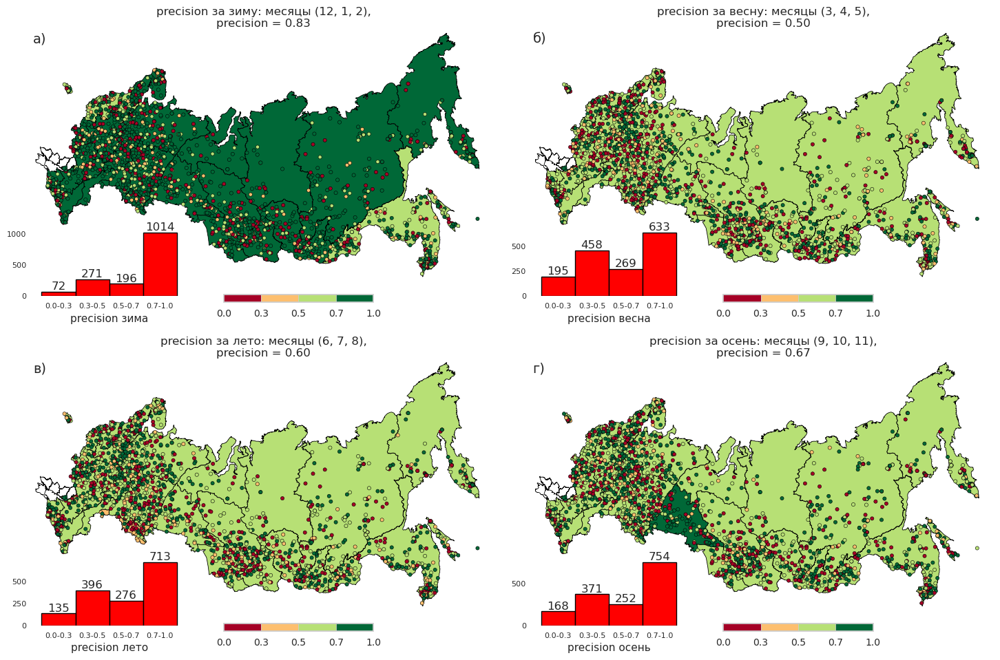

In [55]:
full_file = pd.concat(
    [
        winter_table["precision"],
        spring_table["precision"],
        summer_table["precision"],
        autumn_table["precision"],
    ],
    axis=1,
).dropna()

precision_file = gauges_file.loc[gauges_file.index.isin(full_file.index), [
    "geometry"]]
precision_file.loc[
    :, ["precision зима", "precision весна", "precision лето", "precision осень"]
] = full_file.values
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = precision_file.loc[
        [geom.intersects(gage_point) for gage_point in precision_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["precision зима", "precision весна",
            "precision лето", "precision осень"]
    ] = ugms_part[
        ["precision зима", "precision весна", "precision лето", "precision осень"]
    ].median()

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = precision_file.loc[
        [geom.intersects(gage_point) for gage_point in precision_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        [
            "precision зима",
            "precision весна",
            "precision лето",
            "precision осень",
        ],
    ] = ugms_part[
        ["precision зима", "precision весна", "precision лето", "precision осень"]
    ].median()
meteo_nse = russia_plots_n(
    gdf_to_plot=precision_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    list_of_limits=[0, 0.3, 0.5, 0.7, 1.0],
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "precision зима",
        "precision весна",
        "precision лето",
        "precision осень",
    ],
    hist_name=[
        "precision зима",
        "precision весна",
        "precision лето",
        "precision осень",
    ],
    with_histogram=True,
    title_text=[
        f"precision за зиму: месяцы (12, 1, 2),\nprecision = {winter_precision:.2f}",
        f"precision за весну: месяцы (3, 4, 5),\nprecision = {spring_precision:.2f}",
        f"precision за лето: месяцы (6, 7, 8),\nprecision = {summer_precision:.2f}",
        f"precision за осень: месяцы (9, 10, 11),\nprecision = {autumn_precision:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

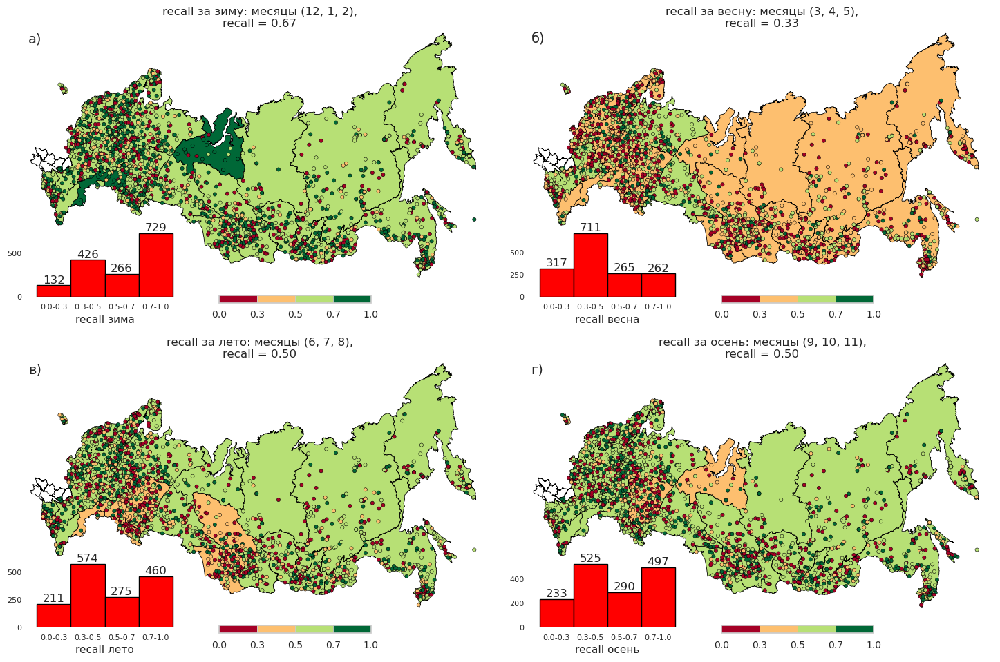

In [56]:
full_file = pd.concat(
    [
        winter_table["recall"],
        spring_table["recall"],
        summer_table["recall"],
        autumn_table["recall"],
    ],
    axis=1,
).dropna()

recall_file = gauges_file.loc[gauges_file.index.isin(full_file.index), [
    "geometry"]]
recall_file.loc[:, ["recall зима", "recall весна", "recall лето", "recall осень"]] = (
    full_file.values
)
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = recall_file.loc[
        [geom.intersects(gage_point) for gage_point in recall_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["recall зима", "recall весна", "recall лето", "recall осень"]
    ] = ugms_part[
        ["recall зима", "recall весна", "recall лето", "recall осень"]
    ].median()

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = recall_file.loc[
        [geom.intersects(gage_point) for gage_point in recall_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        [
            "recall зима",
            "recall весна",
            "recall лето",
            "recall осень",
        ],
    ] = ugms_part[
        ["recall зима", "recall весна", "recall лето", "recall осень"]
    ].median()
meteo_nse = russia_plots_n(
    gdf_to_plot=recall_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    list_of_limits=[0, 0.3, 0.5, 0.7, 1.0],
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "recall зима",
        "recall весна",
        "recall лето",
        "recall осень",
    ],
    hist_name=[
        "recall зима",
        "recall весна",
        "recall лето",
        "recall осень",
    ],
    with_histogram=True,
    title_text=[
        f"recall за зиму: месяцы (12, 1, 2),\nrecall = {winter_recall:.2f}",
        f"recall за весну: месяцы (3, 4, 5),\nrecall = {spring_recall:.2f}",
        f"recall за лето: месяцы (6, 7, 8),\nrecall = {summer_recall:.2f}",
        f"recall за осень: месяцы (9, 10, 11),\nrecall = {autumn_recall:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

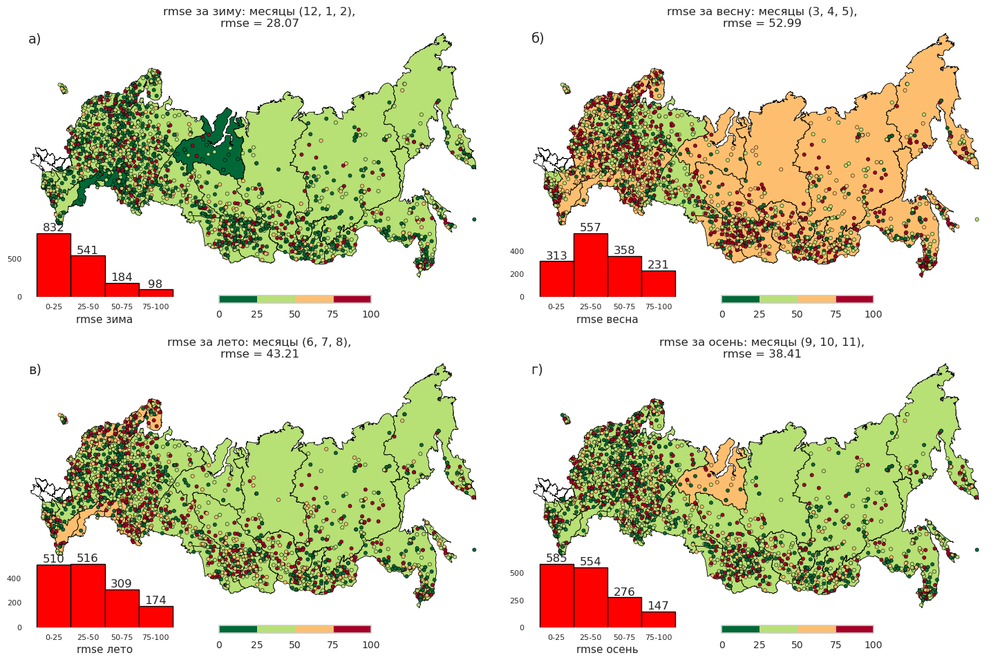

In [61]:
full_file = pd.concat(
    [
        winter_table["rmse"],
        spring_table["rmse"],
        summer_table["rmse"],
        autumn_table["rmse"],
    ],
    axis=1,
).dropna()

rmse_file = gauges_file.loc[gauges_file.index.isin(full_file.index), [
    "geometry"]]
rmse_file.loc[:, ["rmse зима", "rmse весна", "rmse лето", "rmse осень"]] = (
    full_file.values
)
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = rmse_file.loc[
        [geom.intersects(gage_point) for gage_point in rmse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["rmse зима", "rmse весна", "rmse лето", "rmse осень"]
    ] = ugms_part[
        ["rmse зима", "rmse весна", "rmse лето", "rmse осень"]
    ].median()

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = rmse_file.loc[
        [geom.intersects(gage_point) for gage_point in rmse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        [
            "rmse зима",
            "rmse весна",
            "rmse лето",
            "rmse осень",
        ],
    ] = ugms_part[
        ["rmse зима", "rmse весна", "rmse лето", "rmse осень"]
    ].median()
meteo_nse = russia_plots_n(
    gdf_to_plot=rmse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    list_of_limits=[0, 25, 50, 75, 100],
    cmap_name="RdYlGn_r",
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "rmse зима",
        "rmse весна",
        "rmse лето",
        "rmse осень",
    ],
    hist_name=[
        "rmse зима",
        "rmse весна",
        "rmse лето",
        "rmse осень",
    ],
    with_histogram=True,
    title_text=[
        f"rmse за зиму: месяцы (12, 1, 2),\nrmse = {winter_rmse:.2f}",
        f"rmse за весну: месяцы (3, 4, 5),\nrmse = {spring_rmse:.2f}",
        f"rmse за лето: месяцы (6, 7, 8),\nrmse = {summer_rmse:.2f}",
        f"rmse за осень: месяцы (9, 10, 11),\nrmse = {autumn_rmse:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

In [62]:
whole_year_table

,recall,precision,rmse
gauge_id,,,
7034,0.958333,0.958333,10.440187
8084,0.250000,0.428571,98.790003
72113,0.541667,0.619048,31.911636
78196,0.875000,1.000000,61.510554
70574,0.916667,0.916667,15.893798
...,...,...,...
70494,0.500000,0.571429,49.238190
10287,0.291667,0.291667,66.626362
5072,0.791667,0.791667,18.994584


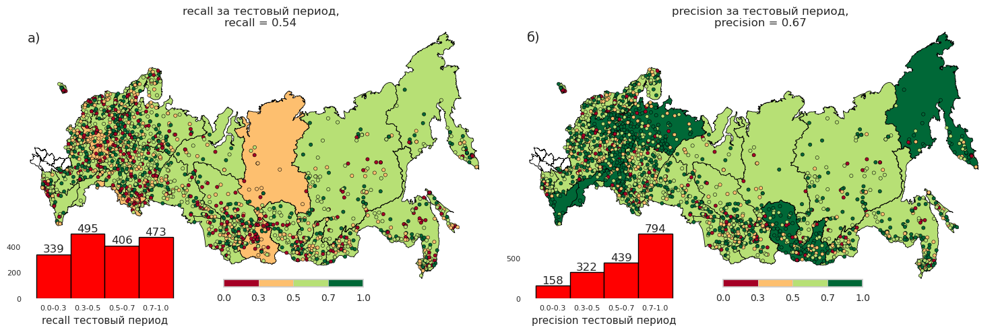

In [71]:
full_file = pd.concat(
    [whole_year_table["recall"], whole_year_table["precision"]],
    axis=1,
).dropna()

precision_file = gauges_file.loc[gauges_file.index.isin(full_file.index), [
    "geometry"]]
precision_file.loc[:, ["recall тестовый период", "precision тестовый период"]] = (
    full_file.values
)
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = precision_file.loc[
        [geom.intersects(gage_point) for gage_point in precision_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["recall тестовый период", "precision тестовый период"]] = (
        ugms_part[["recall тестовый период",
                   "precision тестовый период"]].median()
    )

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = precision_file.loc[
        [geom.intersects(gage_point) for gage_point in precision_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        ["recall тестовый период", "precision тестовый период"],
    ] = ugms_part[["recall тестовый период", "precision тестовый период"]].median()
meteo_nse = russia_plots_n(
    gdf_to_plot=precision_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=1,
    ncols=2,
    list_of_limits=[0, 0.3, 0.5, 0.7, 1.0],
    label_list=["а)", "б)"],
    columns_from_gdf=["recall тестовый период", "precision тестовый период"],
    hist_name=["recall тестовый период", "precision тестовый период"],
    with_histogram=True,
    title_text=[
        f"recall за тестовый период,\nrecall = {whole_year_recall:.2f}",
        f"precision за тестовый период,\nprecision = {whole_year_precision:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

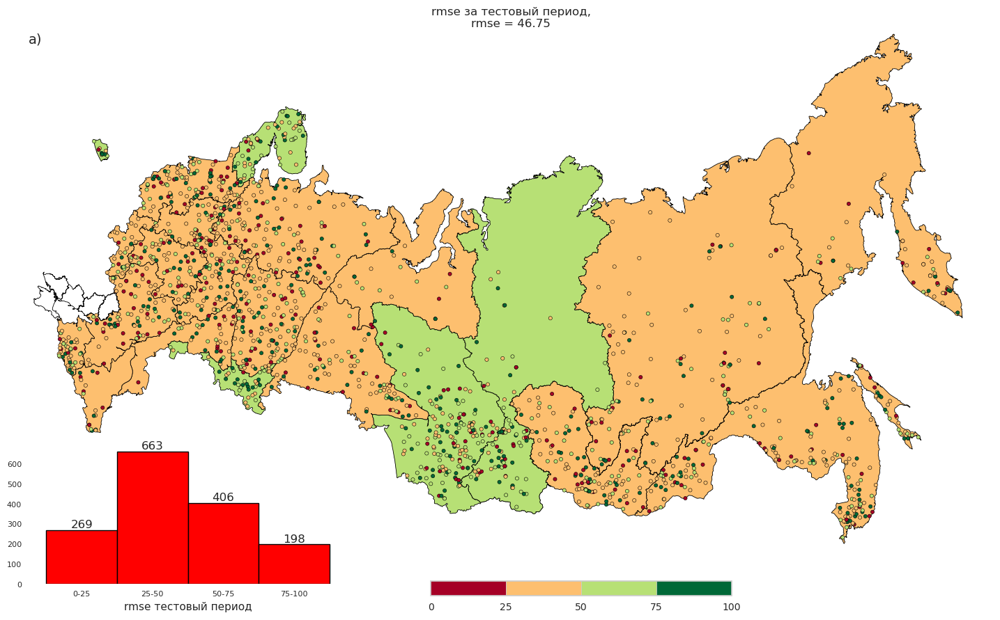

In [70]:
full_file = pd.concat(
    [whole_year_table["rmse"]],
    axis=1,
).dropna()

precision_file = gauges_file.loc[gauges_file.index.isin(full_file.index), [
    "geometry"]]
precision_file.loc[:, ["rmse тестовый период"]] = full_file.values
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = precision_file.loc[
        [geom.intersects(gage_point) for gage_point in precision_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["rmse тестовый период"]] = ugms_part[
        ["rmse тестовый период"]
    ].median()

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = precision_file.loc[
        [geom.intersects(gage_point) for gage_point in precision_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        ["rmse тестовый период"],
    ] = ugms_part[["rmse тестовый период"]].median()
meteo_nse = russia_plots_n(
    gdf_to_plot=precision_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=1,
    ncols=1,
    label_list=["а)"],
    list_of_limits=[0, 25, 50, 75, 100],
    columns_from_gdf=["rmse тестовый период"],
    hist_name=["rmse тестовый период"],
    with_histogram=True,
    title_text=[
        f"rmse за тестовый период,\nrmse = {whole_year_rmse:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

In [ ]:
nse_file = gauges_file.loc[gauges_file.index.isin(lstm_table.index), [
    "geometry"]]
nse_file.loc[:, ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]] = pd.concat(
    [gr4j_table["NSE"], hbv_table["NSE"], lstm_table["NSE"], lstm_no_static["NSE"]],
    axis=1,
).values
nse_file = nse_file.dropna()
# nse_file = nse_file.sort_values(by="NSE_hbv", ascending=False)[:150]
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]] = (
        ugms_part[["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]].median()
    )
basin_districts.loc[
    [25, 26, 27], ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]
] = np.NaN

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        [
            "NSE_gr4j",
            "NSE_hbv",
            "NSE_lstm",
            "NSE_lstm_ns",
        ],
    ] = ugms_part[["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]].median()
basin_districts.loc[
    [25, 26, 27], ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]
] = np.NaN


meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "NSE_gr4j",
        "NSE_hbv",
        "NSE_lstm",
        "NSE_lstm_ns",
    ],
    hist_name=["NSE для HBV", "NSE для GR4J",
               "NSE для LSTM-static", "NSE для LSTM"],
    with_histogram=True,
    title_text=[
        f"NSE для HBV,\nNSE = {nse_gr4j:.2f}",
        f"NSE для GR4J,\nNSE = {nse_hbv:.2f}",
        f"NSE для LSTM с осадками ERA5-Land,\nNSE = {nse_lstm:.2f}",
        f"NSE для LSTM с осадками ERA5-Land без физ.гео параметров,\nNSE = {nse_lstm_ns:.2f}",
        # f"NSE для Random Forest Regressor,\nNSE = {nse_rfr:.2f}",
        # f"NSE для Random Forest Regressor (cross-validation),\nNSE = {nse_rfr_cv:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

In [29]:
def read_table_gauge_str(
    table_path: str, index_filter: pd.Index = pd.Index([])
) -> tuple[pd.DataFrame, float]:
    table = pd.read_csv(table_path)
    if "Unnamed: 0" in table.columns:
        table = table.rename(columns={"Unnamed: 0": "gauge_id"})
    table["gauge_id"] = table["gauge_id"].astype(str)
    table = table.set_index("gauge_id")

    if index_filter.empty:
        pass
    else:
        table = table.loc[table.index.isin(index_filter)]
    median_nse = table["NSE"].median()
    return table, median_nse


lstm_table, nse_lstm = read_table_gauge_str("./tables/LSTM_static_res.csv")
gr4j_table, nse_gr4j = read_table_gauge_str(
    "./tables/GR4J_final_table.csv", index_filter=lstm_table.index
)
hbv_table, nse_hbv = read_table_gauge_str(
    "./tables/HBV_final_table.csv", index_filter=lstm_table.index
)
lstm_no_static, nse_lstm_ns = read_table_gauge_str(
    "./tables/LSTM_no_static_res.csv", index_filter=lstm_table.index
)

rfr_table_cv, nse_rfr_cv = read_table_gauge_str(
    "./tables/res_rfr_cv.csv", index_filter=lstm_table.index
)

tft_single, nse_tft_single = read_table_gauge_str(
    "./tables/some_tft_res_single.csv", index_filter=lstm_table.index
)
tft_multi, nse_tft_multi = read_table_gauge_str(
    "./tables/some_tft_res_multi.csv", index_filter=lstm_table.index
)

tft_single_pred, nse_tft_s_pred = read_table_gauge_str(
    "./tables/single_gauge_predict.csv", index_filter=lstm_table.index
)
tft_multi_pred, nse_tft_m_pred = read_table_gauge_str(
    "./tables/multi_gauge_predict.csv", index_filter=lstm_table.index
)

# FIXME
tft_blind = pd.read_csv("./tables/partial_gages.csv", index_col="gauge_id")[
    ["NSE_blind_tft"]
]
tft_blind = tft_blind.rename(columns={"NSE_blind_tft": "NSE"})
tft_blind.index = tft_blind.index.astype(str)
nse_tft_blind = tft_blind["NSE"].median()


lstm_blind = pd.read_csv("./tables/partial_gages.csv", index_col="gauge_id")[
    ["NSE_blind_lstm"]
]
lstm_blind = lstm_blind.rename(columns={"NSE_blind_lstm": "NSE"})
lstm_blind.index = lstm_blind.index.astype(str)
nse_lstm_blind = lstm_blind["NSE"].median()

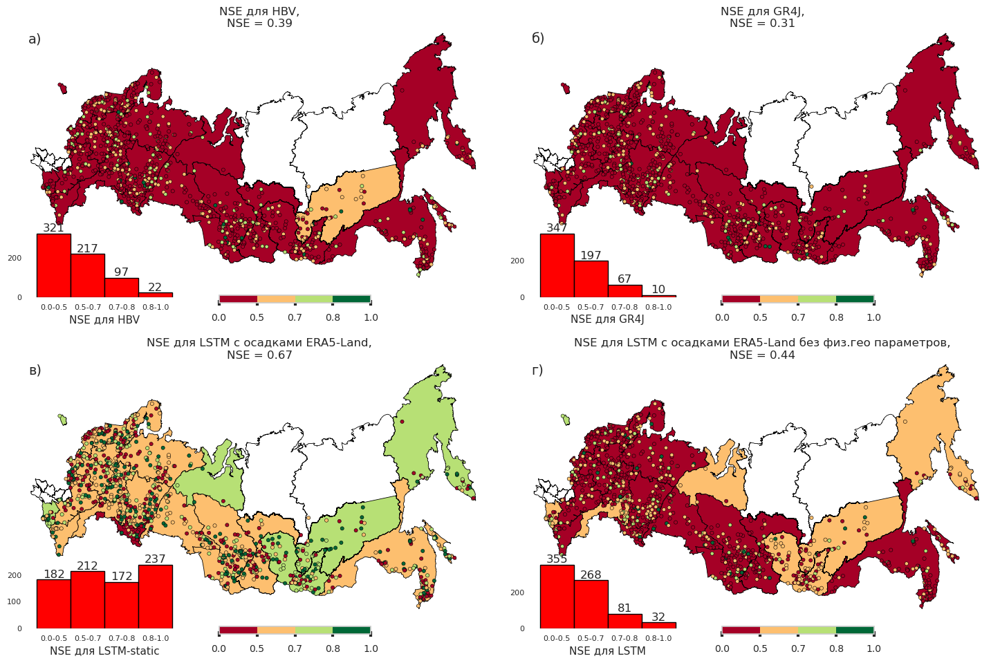

In [7]:
nse_file = gauges_file.loc[gauges_file.index.isin(lstm_table.index), [
    "geometry"]]
nse_file.loc[:, ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]] = pd.concat(
    [gr4j_table["NSE"], hbv_table["NSE"], lstm_table["NSE"], lstm_no_static["NSE"]],
    axis=1,
).values
nse_file = nse_file.dropna()
# nse_file = nse_file.sort_values(by="NSE_hbv", ascending=False)[:150]
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]] = (
        ugms_part[["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]].median()
    )
basin_districts.loc[
    [25, 26, 27], ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]
] = np.NaN

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        [
            "NSE_gr4j",
            "NSE_hbv",
            "NSE_lstm",
            "NSE_lstm_ns",
        ],
    ] = ugms_part[["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]].median()
basin_districts.loc[
    [25, 26, 27], ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns"]
] = np.NaN


meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "NSE_gr4j",
        "NSE_hbv",
        "NSE_lstm",
        "NSE_lstm_ns",
    ],
    hist_name=["NSE для HBV", "NSE для GR4J",
               "NSE для LSTM-static", "NSE для LSTM"],
    with_histogram=True,
    title_text=[
        f"NSE для HBV,\nNSE = {nse_gr4j:.2f}",
        f"NSE для GR4J,\nNSE = {nse_hbv:.2f}",
        f"NSE для LSTM с осадками ERA5-Land,\nNSE = {nse_lstm:.2f}",
        f"NSE для LSTM с осадками ERA5-Land без физ.гео параметров,\nNSE = {nse_lstm_ns:.2f}",
        # f"NSE для Random Forest Regressor,\nNSE = {nse_rfr:.2f}",
        # f"NSE для Random Forest Regressor (cross-validation),\nNSE = {nse_rfr_cv:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

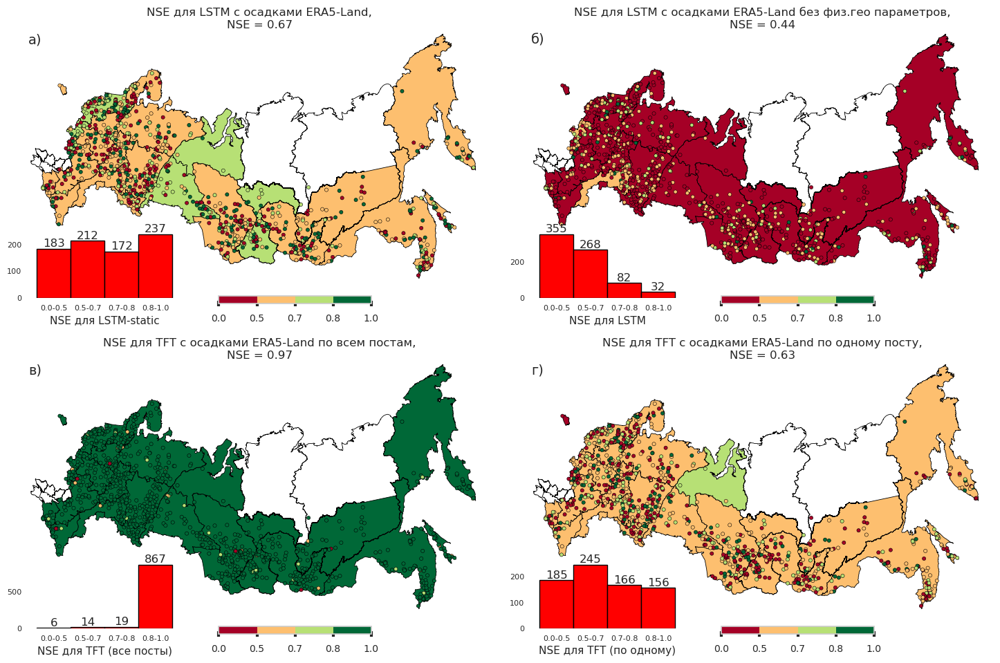

In [9]:
nse_file = gauges_file.loc[gauges_file.index.isin(lstm_table.index), [
    "geometry"]]
nse_file.loc[:, ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"]] = (
    pd.concat(
        [lstm_table["NSE"], lstm_no_static["NSE"],
            tft_multi["NSE"], tft_single["NSE"]],
        axis=1,
    ).values
)
nse_file = nse_file.dropna()
# nse_file = nse_file.sort_values(by="NSE_hbv", ascending=False)[:150]
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"]
    ] = ugms_part[
        ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"]
    ].median()
basin_districts.loc[
    [25, 26, 27], ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"]
] = np.NaN

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"],
    ] = ugms_part[
        ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"]
    ].median()
basin_districts.loc[
    [25, 26, 27], ["NSE_lstm", "NSE_lstm_ns", "NSE_tft_multi", "NSE_tft_single"]
] = np.NaN


meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=["NSE_lstm", "NSE_lstm_ns",
                      "NSE_tft_multi", "NSE_tft_single"],
    hist_name=[
        "NSE для LSTM-static",
        "NSE для LSTM",
        "NSE для TFT (все посты)",
        "NSE для TFT (по одному)",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для LSTM с осадками ERA5-Land,\nNSE = {nse_lstm:.2f}",
        f"NSE для LSTM с осадками ERA5-Land без физ.гео параметров,\nNSE = {nse_lstm_ns:.2f}",
        f"NSE для TFT с осадками ERA5-Land по всем постам,\nNSE = {nse_tft_multi:.2f}",
        f"NSE для TFT с осадками ERA5-Land по одному посту,\nNSE = {nse_tft_single:.2f}",
        # f"NSE для Random Forest Regressor,\nNSE = {nse_rfr:.2f}",
        # f"NSE для Random Forest Regressor (cross-validation),\nNSE = {nse_rfr_cv:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

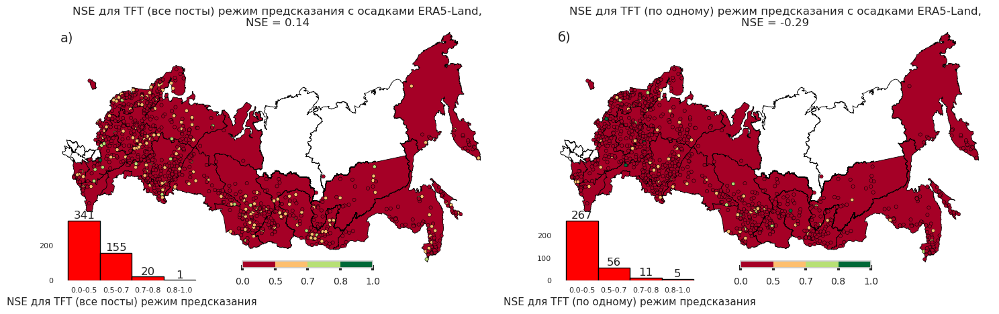

In [54]:
nse_file = gauges_file.loc[
    gauges_file.index.isin(
        pd.concat(
            [
                tft_multi_pred["NSE"],
                tft_single_pred["NSE"],
            ],
            axis=1,
        ).index
    ),
    ["geometry"],
]

nse_file.loc[:, ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"]] = pd.concat(
    [
        tft_multi_pred["NSE"],
        tft_single_pred["NSE"],
    ],
    axis=1,
).values

# nse_file = nse_file.sort_values(by="NSE_hbv", ascending=False)[:150]
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"]] = ugms_part[
        ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"]
    ].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"],
] = np.NaN

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"],
    ] = ugms_part[["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"]].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred"],
] = np.NaN


meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    columns_from_gdf=[
        "NSE_tft_mlt_pred",
        "NSE_tft_sngl_pred",
    ],
    hist_name=[
        "NSE для TFT (все посты) режим предсказания",
        "NSE для TFT (по одному) режим предсказания",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для TFT (все посты) режим предсказания с осадками ERA5-Land,\nNSE = {nse_tft_m_pred:.2f}",
        f"NSE для TFT (по одному) режим предсказания с осадками ERA5-Land,\nNSE = {nse_tft_s_pred:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

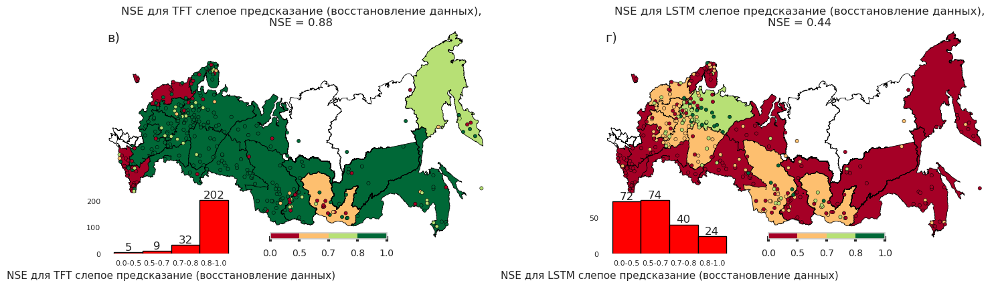

In [55]:
nse_file = gauges_file.loc[
    gauges_file.index.isin(
        pd.concat(
            [
                tft_blind["NSE"],
                lstm_blind["NSE"],
            ],
            axis=1,
        ).index
    ),
    ["geometry"],
]

nse_file.loc[:, ["NSE_tft_blind", "NSE_lstm_blind"]] = pd.concat(
    [
        tft_blind["NSE"],
        lstm_blind["NSE"],
    ],
    axis=1,
).values

# nse_file = nse_file.sort_values(by="NSE_hbv", ascending=False)[:150]
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE_tft_blind", "NSE_lstm_blind"]] = ugms_part[
        ["NSE_tft_blind", "NSE_lstm_blind"]
    ].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_tft_blind", "NSE_lstm_blind"],
] = np.NaN

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        ["NSE_tft_blind", "NSE_lstm_blind"],
    ] = ugms_part[["NSE_tft_blind", "NSE_lstm_blind"]].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_tft_blind", "NSE_lstm_blind"],
] = np.NaN


meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=1,
    ncols=2,
    label_list=["в)", "г)"],
    columns_from_gdf=[
        "NSE_tft_blind",
        "NSE_lstm_blind",
    ],
    hist_name=[
        "NSE для TFT слепое предсказание (восстановление данных)",
        "NSE для LSTM слепое предсказание (восстановление данных)",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для TFT слепое предсказание (восстановление данных),\nNSE = {nse_tft_blind:.2f}",
        f"NSE для LSTM слепое предсказание (восстановление данных),\nNSE = {nse_lstm_blind:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

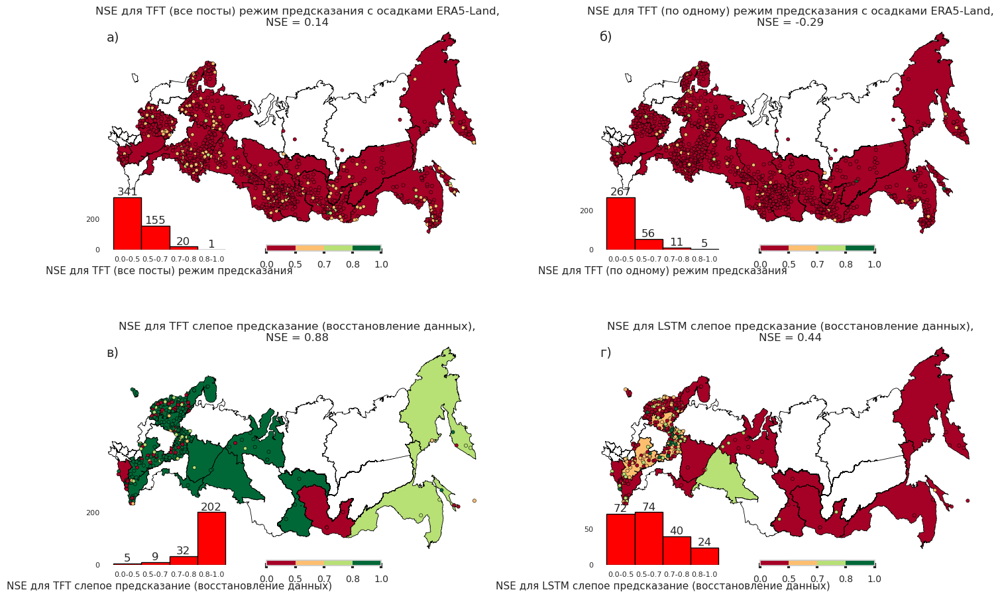

In [53]:
nse_file = gauges_file.loc[
    gauges_file.index.isin(
        pd.concat(
            [
                tft_multi_pred["NSE"],
                tft_single_pred["NSE"],
                tft_blind["NSE"],
                lstm_blind["NSE"],
            ],
            axis=1,
        ).index
    ),
    ["geometry"],
]

nse_file.loc[
    :, ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred", "NSE_tft_blind", "NSE_lstm_blind"]
] = pd.concat(
    [
        tft_multi_pred["NSE"],
        tft_single_pred["NSE"],
        tft_blind["NSE"],
        lstm_blind["NSE"],
    ],
    axis=1,
).values

# nse_file = nse_file.sort_values(by="NSE_hbv", ascending=False)[:150]
# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred",
            "NSE_tft_blind", "NSE_lstm_blind"]
    ] = ugms_part[
        ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred",
            "NSE_tft_blind", "NSE_lstm_blind"]
    ].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred", "NSE_tft_blind", "NSE_lstm_blind"],
] = np.NaN

# give ugms some shine
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred",
            "NSE_tft_blind", "NSE_lstm_blind"],
    ] = ugms_part[
        ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred",
            "NSE_tft_blind", "NSE_lstm_blind"]
    ].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_tft_mlt_pred", "NSE_tft_sngl_pred", "NSE_tft_blind", "NSE_lstm_blind"],
] = np.NaN


meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "NSE_tft_mlt_pred",
        "NSE_tft_sngl_pred",
        "NSE_tft_blind",
        "NSE_lstm_blind",
    ],
    hist_name=[
        "NSE для TFT (все посты) режим предсказания",
        "NSE для TFT (по одному) режим предсказания",
        "NSE для TFT слепое предсказание (восстановление данных)",
        "NSE для LSTM слепое предсказание (восстановление данных)",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для TFT (все посты) режим предсказания с осадками ERA5-Land,\nNSE = {nse_tft_m_pred:.2f}",
        f"NSE для TFT (по одному) режим предсказания с осадками ERA5-Land,\nNSE = {nse_tft_s_pred:.2f}",
        f"NSE для TFT слепое предсказание (восстановление данных),\nNSE = {nse_tft_blind:.2f}",
        f"NSE для LSTM слепое предсказание (восстановление данных),\nNSE = {nse_lstm_blind:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

In [19]:
def nse_descriptor(nse_df: pd.DataFrame, model_name: str):
    res_df = pd.DataFrame()
    res_df.loc[0, "Model"] = model_name

    res_df.loc[0, "Number of gages"] = f"{len(nse_df):.0f}"

    # nse_max = nse_df['NSE'].max()
    # res_df.loc[0, 'Max NSE'] = f'{nse_max:.2f}'

    nse_median = nse_df["NSE"].median()
    res_df.loc[0, "Median NSE"] = f"{nse_median:.2f}"

    # nse_mean = nse_df['NSE'].mean()
    # res_df.loc[0, 'Average NSE'] = f'{nse_mean:.2f}'

    # nse_min = nse_df['NSE'].min()
    # res_df.loc[0, 'Min NSE'] = f'{nse_min:.2f}'

    nse_less_t_z = (nse_df["NSE"] <= 0).sum()
    res_df.loc[0, "NSE < 0, %"] = f"{(nse_less_t_z/len(nse_df)):.0%}"

    bad_models = (nse_df["NSE"] < 0.5).sum()
    res_df.loc[0, "NSE < 0.5, %"] = f"{(bad_models/len(nse_df)):.0%}"

    return res_df


res_list = list()

hbv_table.replace([np.inf, -np.inf], np.nan, inplace=True)
gr4j_table.replace([np.inf, -np.inf], np.nan, inplace=True)


for model, res in {
    "HBV": hbv_table,
    "GR4J": gr4j_table,
    "LSTM физ. гео ERA5-Land": lstm_table,
    "LSTM ERA5-Land без физ. гео": lstm_no_static,
}.items():
    res_list.append(nse_descriptor(nse_df=res, model_name=model))

res_nse = (
    pd.concat(res_list)
    .sort_values(by="Median NSE", ascending=False)
    .reset_index(drop=True)
)

In [20]:
res_nse

,Model,Number of gages,Median NSE,"NSE < 0, %","NSE < 0.5, %"
0,LSTM физ. гео ERA5-Land,911,0.67,11%,32%
1,LSTM ERA5-Land без физ. гео,911,0.44,19%,58%
2,GR4J,904,0.39,27%,63%
3,HBV,906,0.31,31%,70%


In [22]:
res_list = list()

hbv_table.replace([np.inf, -np.inf], np.nan, inplace=True)
gr4j_table.replace([np.inf, -np.inf], np.nan, inplace=True)

for model, res in {
    "LSTM with static": lstm_table,
    "LSTM just meteo": lstm_no_static,
    "HBV": hbv_table,
    "GR4J": gr4j_table,
}.items():
    res_list.append(nse_descriptor(nse_df=res, model_name=model))

res_nse = (
    pd.concat(res_list)
    .sort_values(by="Median NSE", ascending=False)
    .reset_index(drop=True)
)
res_nse.to_csv("./tables/vino_readings_table.csv", index=False)
res_nse

,Model,Number of gages,Median NSE,"NSE < 0, %","NSE < 0.5, %"
0,LSTM with static,911,0.67,11%,32%
1,LSTM just meteo,911,0.44,19%,58%
2,GR4J,904,0.39,27%,63%
3,HBV,906,0.31,31%,70%


In [27]:
compare_table = pd.DataFrame()
nse_cols = ["NSE_gr4j", "NSE_hbv", "NSE_lstm",
            "NSE_lstm_ns", "NSE_tft", "NSE_rfr_cv"]
nse_tables = [
    gr4j_table,
    hbv_table,
    lstm_table,
    lstm_no_static,
    tft_multi,
    rfr_table_cv,
]

for g in lstm_table.index:
    for col, table in zip(nse_cols, nse_tables):
        try:
            compare_table.loc[g, f"{col}"] = table.loc[g, "NSE"]
        except KeyError:
            compare_table.loc[g, f"{col}"] = np.NaN
compare_table["gr4j_vs_lstm"] = [
    "gr4j" if i else "lstm"
    for i in compare_table["NSE_gr4j"] > compare_table["NSE_lstm"]
]
compare_table["hbv_vs_lstm"] = [
    "hbv" if i else "lstm" for i in compare_table["NSE_hbv"] > compare_table["NSE_lstm"]
]

compare_table["gr4j_vs_lstm_ns"] = [
    "gr4j" if i else "lstm_ns"
    for i in compare_table["NSE_gr4j"] > compare_table["NSE_lstm_ns"]
]
compare_table["hbv_vs_lstm_ns"] = [
    "hbv" if i else "lstm_ns"
    for i in compare_table["NSE_hbv"] > compare_table["NSE_lstm_ns"]
]

compare_table["hbv_vs_rfr"] = [
    "hbv" if i else "tft" for i in compare_table["NSE_hbv"] > compare_table["NSE_tft"]
]
compare_table["hbv_vs_rfr_cv"] = [
    "hbv" if i else "rfr_cv"
    for i in compare_table["NSE_hbv"] > compare_table["NSE_rfr_cv"]
]

compare_table["gr4j_vs_rfr"] = [
    "gr4j" if i else "tft" for i in compare_table["NSE_gr4j"] > compare_table["NSE_tft"]
]
compare_table["gr4j_vs_rfr_cv"] = [
    "gr4j" if i else "rfr_cv"
    for i in compare_table["NSE_gr4j"] > compare_table["NSE_rfr_cv"]
]

compare_table["lstm_vs_rfr"] = [
    "lstm" if i else "tft" for i in compare_table["NSE_lstm"] > compare_table["NSE_tft"]
]
compare_table["lstm_vs_rfr_cv"] = [
    "lstm" if i else "rfr_cv"
    for i in compare_table["NSE_lstm"] > compare_table["NSE_rfr_cv"]
]

compare_table["lstm_ns_vs_rfr"] = [
    "lstm_ns" if i else "tft"
    for i in compare_table["NSE_lstm_ns"] > compare_table["NSE_tft"]
]
compare_table["lstm_ns_vs_rfr_cv"] = [
    "lstm_ns" if i else "rfr_cv"
    for i in compare_table["NSE_lstm_ns"] > compare_table["NSE_rfr_cv"]
]

compare_table["lstm_vs_lstm_ns"] = [
    "lstm" if i else "lstm_ns"
    for i in compare_table["NSE_lstm"] > compare_table["NSE_lstm_ns"]
]
compare_table.loc[
    compare_table["NSE_gr4j"].isna(),
    ["gr4j_vs_lstm", "hbv_vs_lstm", "hbv_vs_rfr_cv", "gr4j_vs_rfr_cv"],
] = np.NaN
compare_table["gr4j_vs_lstm"] = [
    "gr4j" if i else "lstm"
    for i in compare_table["NSE_gr4j"] > compare_table["NSE_lstm"]
]
compare_table["hbv_vs_lstm"] = [
    "hbv" if i else "lstm" for i in compare_table["NSE_hbv"] > compare_table["NSE_lstm"]
]
compare_table["gr4j_vs_lstm_ns"] = [
    "gr4j" if i else "lstm_ns"
    for i in compare_table["NSE_gr4j"] > compare_table["NSE_lstm_ns"]
]
compare_table["hbv_vs_lstm_ns"] = [
    "hbv" if i else "lstm_ns"
    for i in compare_table["NSE_hbv"] > compare_table["NSE_lstm_ns"]
]
compare_table["lstm_vs_lstm_ns"] = [
    "lstm" if i else "lstm_ns"
    for i in compare_table["NSE_lstm"] > compare_table["NSE_lstm_ns"]
]
compare_table.loc[
    compare_table["NSE_gr4j"].isna(),
    ["gr4j_vs_lstm", "hbv_vs_lstm", "hbv_vs_rfr_cv", "gr4j_vs_rfr_cv"],
] = np.NaN

In [28]:
compare_IEEE = compare_table[
    [
        "gr4j_vs_lstm",
        "gr4j_vs_lstm_ns",
        "hbv_vs_lstm",
        "hbv_vs_lstm_ns",
        "lstm_vs_lstm_ns",
    ]
]
compare_IEEE

,gr4j_vs_lstm,gr4j_vs_lstm_ns,hbv_vs_lstm,hbv_vs_lstm_ns,lstm_vs_lstm_ns
2090,lstm,lstm_ns,lstm,lstm_ns,lstm
2103,lstm,gr4j,lstm,lstm_ns,lstm
84037,lstm,lstm_ns,lstm,lstm_ns,lstm
11350,lstm,lstm_ns,lstm,lstm_ns,lstm_ns
48058,lstm,lstm_ns,lstm,lstm_ns,lstm
...,...,...,...,...,...
3076,lstm,gr4j,lstm,hbv,lstm
78087,lstm,lstm_ns,lstm,lstm_ns,lstm
5092,lstm,lstm_ns,lstm,hbv,lstm
9290,lstm,gr4j,lstm,hbv,lstm


In [30]:
compare_table.loc[compare_table[["NSE_gr4j"]].dropna(axis=0).index, :]

,NSE_gr4j,NSE_hbv,NSE_lstm,NSE_lstm_ns,NSE_tft,NSE_rfr_cv,gr4j_vs_lstm,hbv_vs_lstm,gr4j_vs_lstm_ns,hbv_vs_lstm_ns,hbv_vs_rfr,hbv_vs_rfr_cv,gr4j_vs_rfr,gr4j_vs_rfr_cv,lstm_vs_rfr,lstm_vs_rfr_cv,lstm_ns_vs_rfr,lstm_ns_vs_rfr_cv,lstm_vs_lstm_ns
2090,0.517969,0.018288,0.768865,0.579776,0.990465,0.904513,lstm,lstm,lstm_ns,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,lstm
2103,0.176324,-1.812192,0.729967,-0.487392,0.977607,0.797554,lstm,lstm,gr4j,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,lstm
84037,-2.628349,-2.264722,-0.138326,-0.306529,0.906521,-9.511622,lstm,lstm,lstm_ns,lstm_ns,tft,hbv,tft,gr4j,tft,lstm,tft,lstm_ns,lstm
11350,-0.082772,-0.076198,0.652255,0.769402,0.998040,0.384816,lstm,lstm,lstm_ns,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,lstm,tft,lstm_ns,lstm_ns
48058,0.006380,0.210599,0.636976,0.241619,0.989022,0.684754,lstm,lstm,lstm_ns,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,lstm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3076,0.220182,0.153735,0.583859,-0.165523,0.931904,0.346009,lstm,lstm,gr4j,hbv,tft,rfr_cv,tft,rfr_cv,tft,lstm,tft,rfr_cv,lstm
78087,-4.263492,-5.225433,0.104186,-0.152080,0.986324,-6.035271,lstm,lstm,lstm_ns,lstm_ns,tft,hbv,tft,gr4j,tft,lstm,tft,lstm_ns,lstm
5092,0.505522,0.605635,0.761632,0.531429,0.972448,0.545146,lstm,lstm,lstm_ns,hbv,tft,hbv,tft,rfr_cv,tft,lstm,tft,rfr_cv,lstm
9290,0.702465,0.648722,0.823858,0.433845,0.936641,0.492673,lstm,lstm,gr4j,hbv,tft,hbv,tft,gr4j,tft,lstm,tft,rfr_cv,lstm


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


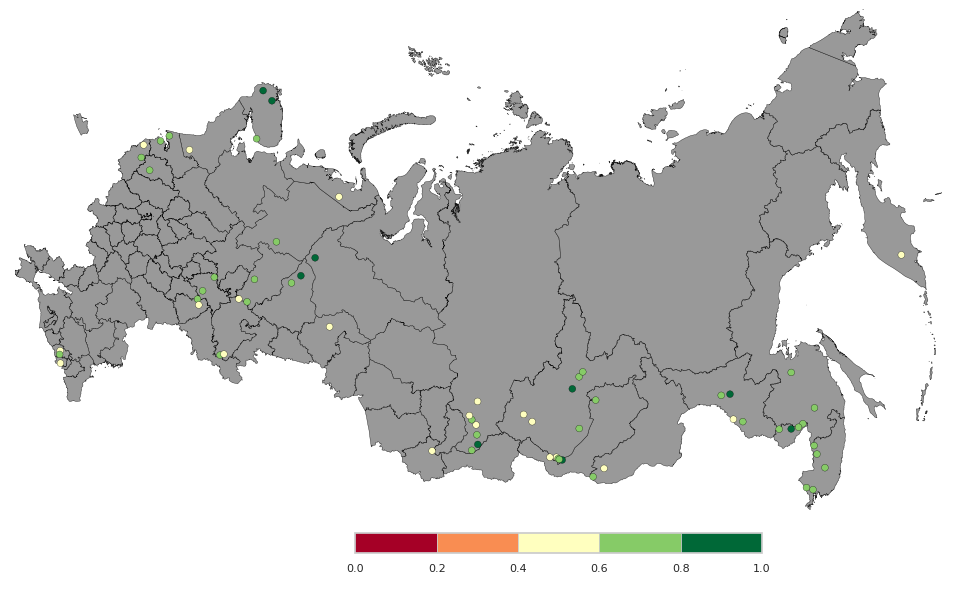

In [31]:
# gr4j_supremacy = compare_table.loc[
#     compare_IEEE[compare_IEEE['gr4j_vs_lstm'] == 'gr4j'].index, ['NSE_gr4j', 'NSE_lstm']]
gr4j_supremacy = compare_table.loc[compare_table[[
    "NSE_gr4j"]].dropna(axis=0).index, :]
gr4j_supremacy["diff"] = gr4j_supremacy["NSE_gr4j"] - \
    gr4j_supremacy["NSE_lstm"]
gr4j_supremacy["geometry"] = gauges_file.loc[gr4j_supremacy.index, "geometry"]
gr4j_supremacy = gpd.GeoDataFrame(gr4j_supremacy, geometry="geometry")
# gr4j_supremacy = gr4j_supremacy.loc[(gr4j_supremacy['NSE_gr4j'] > 0.5) & (gr4j_supremacy['NSE_lstm'] < 0.5),
#                                     :]
gr4j_supremacy = gr4j_supremacy.loc[
    (gr4j_supremacy["NSE_gr4j"] > gr4j_supremacy["NSE_lstm"])
    & (gr4j_supremacy["NSE_gr4j"] > 0.5),
    :,
]

russia_plots(
    gdf_to_plot=gr4j_supremacy,
    distinction_col="",
    metric_col="NSE_gr4j",
    basemap_data=basemap_data,
    figsize=(15, 8),
    title_text="",
    just_points=False,
)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


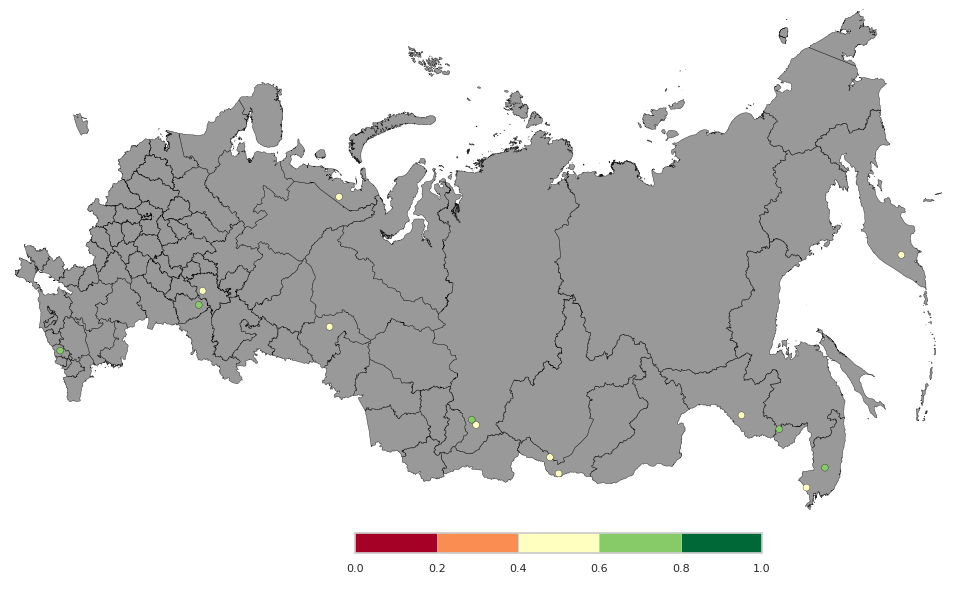

In [32]:
hbv_supremacy = compare_table.loc[
    compare_IEEE[compare_IEEE["hbv_vs_lstm"] ==
                 "hbv"].index, ["NSE_hbv", "NSE_lstm"]
]
hbv_supremacy["diff"] = hbv_supremacy["NSE_hbv"] - hbv_supremacy["NSE_lstm"]
hbv_supremacy["geometry"] = gauges_file.loc[hbv_supremacy.index, "geometry"]
hbv_supremacy = gpd.GeoDataFrame(hbv_supremacy, geometry="geometry")
hbv_supremacy = hbv_supremacy.loc[
    (hbv_supremacy["NSE_hbv"] > 0.5) & (hbv_supremacy["NSE_lstm"] < 0.5), :
]
russia_plots(
    gdf_to_plot=hbv_supremacy,
    distinction_col="",
    metric_col="NSE_hbv",
    basemap_data=basemap_data,
    figsize=(15, 8),
    title_text="",
    just_points=False,
)

In [111]:
static_attributes = pd.read_csv(
    "../geo_data/attributes/static_with_height.csv")
static_attributes["gauge_id"] = static_attributes["gauge_id"].astype(str)
static_attributes = static_attributes.set_index("gauge_id")

### Skip to this part

In [33]:
compare_table

,NSE_gr4j,NSE_hbv,NSE_lstm,NSE_lstm_ns,NSE_tft,NSE_rfr_cv,gr4j_vs_lstm,hbv_vs_lstm,gr4j_vs_lstm_ns,hbv_vs_lstm_ns,hbv_vs_rfr,hbv_vs_rfr_cv,gr4j_vs_rfr,gr4j_vs_rfr_cv,lstm_vs_rfr,lstm_vs_rfr_cv,lstm_ns_vs_rfr,lstm_ns_vs_rfr_cv,lstm_vs_lstm_ns
2090,0.517969,0.018288,0.768865,0.579776,0.990465,0.904513,lstm,lstm,lstm_ns,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,lstm
2103,0.176324,-1.812192,0.729967,-0.487392,0.977607,0.797554,lstm,lstm,gr4j,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,lstm
84037,-2.628349,-2.264722,-0.138326,-0.306529,0.906521,-9.511622,lstm,lstm,lstm_ns,lstm_ns,tft,hbv,tft,gr4j,tft,lstm,tft,lstm_ns,lstm
11350,-0.082772,-0.076198,0.652255,0.769402,0.998040,0.384816,lstm,lstm,lstm_ns,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,lstm,tft,lstm_ns,lstm_ns
48058,0.006380,0.210599,0.636976,0.241619,0.989022,0.684754,lstm,lstm,lstm_ns,lstm_ns,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,tft,rfr_cv,lstm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3076,0.220182,0.153735,0.583859,-0.165523,0.931904,0.346009,lstm,lstm,gr4j,hbv,tft,rfr_cv,tft,rfr_cv,tft,lstm,tft,rfr_cv,lstm
78087,-4.263492,-5.225433,0.104186,-0.152080,0.986324,-6.035271,lstm,lstm,lstm_ns,lstm_ns,tft,hbv,tft,gr4j,tft,lstm,tft,lstm_ns,lstm
5092,0.505522,0.605635,0.761632,0.531429,0.972448,0.545146,lstm,lstm,lstm_ns,hbv,tft,hbv,tft,rfr_cv,tft,lstm,tft,rfr_cv,lstm
9290,0.702465,0.648722,0.823858,0.433845,0.936641,0.492673,lstm,lstm,gr4j,hbv,tft,hbv,tft,gr4j,tft,lstm,tft,rfr_cv,lstm


In [99]:
compared_gauges = gauges_file[["geometry"]]
compared_gauges[
    ["gr4j_vs_lstm", "hbv_vs_lstm", "gr4j_vs_lstm_ns", "hbv_vs_lstm_ns"]
] = compare_table[["gr4j_vs_lstm", "hbv_vs_lstm", "gr4j_vs_lstm_ns", "hbv_vs_lstm_ns"]]
compared_gauges = compared_gauges.loc[~compared_gauges["gr4j_vs_lstm"].isna(
), :]

/opt/conda/lib/python3.9/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [58]:
nse_file = gauges_file[["geometry"]]
nse_file[
    ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns", "NSE_rfr", "NSE_rfr_cv"]
] = compare_table[
    ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns", "NSE_rfr", "NSE_rfr_cv"]
]
nse_file = nse_file.loc[~nse_file["NSE_lstm"].isna(), :]
nse_file

/Users/dmbrmv/miniconda3/envs/geo/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,geometry,NSE_gr4j,NSE_hbv,NSE_lstm,NSE_lstm_ns,NSE_rfr,NSE_rfr_cv
gauge_id,,,,,,,
49014,POINT (31.05794 65.77917),NaN,NaN,0.544290,0.638239,0.577663,0.558769
49047,POINT (30.50502 64.95504),NaN,NaN,0.683292,0.234485,0.517304,0.479409
49052,POINT (31.14297 65.21779),NaN,NaN,0.846952,0.548791,0.751701,0.718761
49058,POINT (32.11508 64.75309),-1.757978,-0.932752,0.816702,-0.296881,0.690607,0.660461
49070,POINT (34.71204 64.74240),0.178350,0.351561,0.477104,0.256056,0.570786,0.544739
...,...,...,...,...,...,...,...
2027,POINT (157.97093 54.16468),NaN,NaN,0.478540,0.692436,0.685237,0.639462
72191,POINT (33.87509 59.49075),NaN,NaN,-8.680100,-8.682244,NaN,NaN
49053,POINT (31.22690 65.19361),NaN,NaN,0.661735,0.181012,0.681434,0.673569


In [179]:
# give ugms some shine
for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["NSE_gr4j", "NSE_hbv", "NSE_lstm",
            "NSE_lstm_ns", "NSE_rfr", "NSE_rfr_cv"]
    ] = ugms_part[
        ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns", "NSE_rfr", "NSE_rfr_cv"]
    ].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_gr4j", "NSE_hbv", "NSE_lstm", "NSE_lstm_ns", "NSE_rfr", "NSE_rfr_cv"],
] = np.NaN

  0%|          | 0/28 [00:00<?, ?it/s]

In [ ]:
meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=3,
    label_list=["а)", "б)", "в)", "г)", "д)", "е)"],
    columns_from_gdf=[
        "NSE_gr4j",
        "NSE_hbv",
        "NSE_lstm",
        "NSE_lstm_ns",
        "NSE_rfr",
        "NSE_rfr_cv",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для HBV,\nNSE = {nse_gr4j:.2f}",
        f"NSE для GR4J,\nNSE = {nse_hbv:.2f}",
        f"NSE для LSTM с осадками ERA5-Land,\nNSE = {nse_lstm:.2f}",
        f"NSE для LSTM с осадками ERA5-Land без физ.гео параметров,\nNSE = {nse_lstm_ns:.2f}",
        f"NSE для Random Forest Regressor,\nNSE = {nse_rfr:.2f}",
        f"NSE для Random Forest Regressor (cross-validation),\nNSE = {nse_rfr_cv:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)

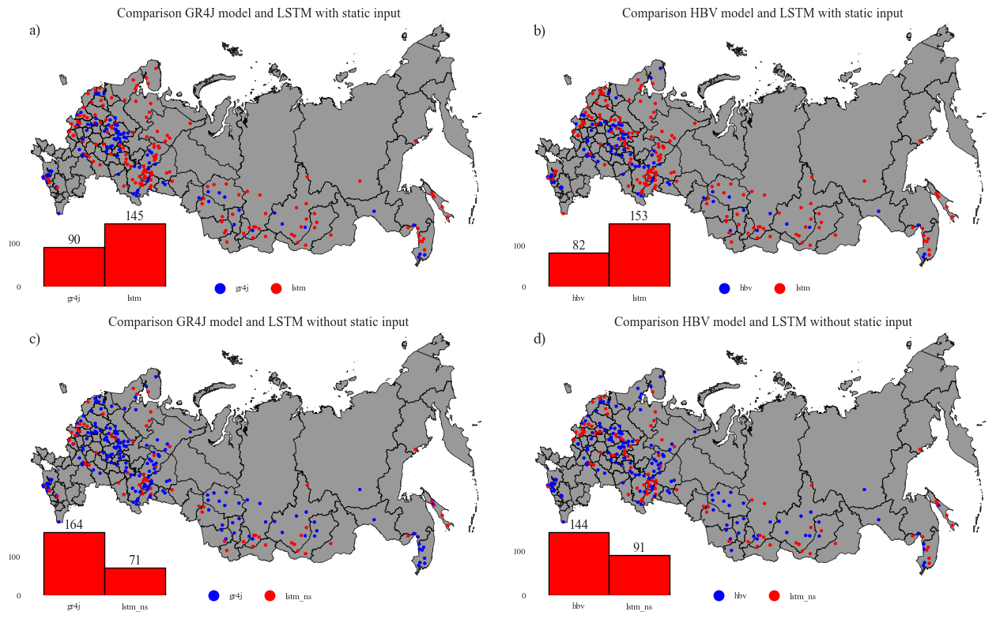

In [101]:
сompare_nse = russia_plots_n(
    gdf_to_plot=compared_gauges,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=2,
    cmap_name="bwr",
    label_list=["a)", "b)", "c)", "d)"],
    columns_from_gdf=[
        "gr4j_vs_lstm",
        "hbv_vs_lstm",
        "gr4j_vs_lstm_ns",
        "hbv_vs_lstm_ns",
    ],
    with_histogram=True,
    title_text=[
        "Comparison GR4J model and LSTM with static input",
        "Comparison HBV model and LSTM with static input",
        "Comparison GR4J model and LSTM without static input",
        "Comparison HBV model and LSTM without static input",
    ],
    just_points=True,
    ugms=False,
    ugms_gdf=basin_districts,
)
сompare_nse.savefig("./images/IEE_PLOT_compare.pdf",
                    dpi=600, bbox_inches="tight")

### Based conclusions

In [ ]:
# ugms_shp = gpd.read_file(
#     '../geo_data/great_db/geometry/ugms.shp')[['name1', 'geometry']]
# # Update geometrty in UGMS based on available gage stations
# # sib
# srednesib_limit = gpd.read_file(
#     '../geo_data/great_db/geometry/srednesib_lim.gpkg')
# ugms_shp.loc[len(ugms_shp)+1, ['name1', 'geometry']] = ['Среднесибирское, ограниченное', ugms_shp.loc[17,
#                                                                                                       'geometry'].intersection(srednesib_limit.loc[0, 'geometry'])]
# # yakutsk
# yakutsk_limit = gpd.read_file(
#     '../geo_data/great_db/geometry/yakut_lim.gpkg')
# ugms_shp.loc[len(ugms_shp)+1, ['name1', 'geometry']] = ['Якутское, ограниченное', ugms_shp.loc[23,
#                                                                                                'geometry'].intersection(yakutsk_limit.loc[0, 'geometry'])]
# # chukotka
# chukotka_limit = gpd.read_file(
#     '../geo_data/great_db/geometry/chukot_limit.gpkg')
# ugms_shp.loc[len(ugms_shp)+1, ['name1', 'geometry']] = [
#     'Чукотское, ограниченное', ugms_shp.loc[22, 'geometry'].intersection(
#         chukotka_limit.loc[0, 'geometry'])]
# ugms_shp = ugms_shp.reset_index(drop=True)
# # fixed umgs shapes
# ugms_shp = ugms_shp.reindex([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
#                              12, 13, 14, 15, 16, 25, 18, 19, 20, 21,
#                              27, 26, 24, 17, 23, 22])
# ugms_shp = ugms_shp.reset_index(drop=True)

In [7]:
wholeRussiaEval = np.load(
    "./verif_metrics_20210930.npy", allow_pickle=True).item()

forecastHindcast = np.load(
    "./oper_hindcasts_and_forecasts.npy", allow_pickle=True
).item()

actualObs = np.load(
    "./obs_and_qfh_stat_and_hist_hindcasts.npy", allow_pickle=True
).item()

In [18]:
ref_df = pd.DataFrame()
for gauge, metrics in wholeRussiaEval["GR4J_NSE"]["0"].items():
    ref_df.loc[gauge, "NSE"] = metrics["NSE"]
    ref_df.loc[gauge, "KGE"] = metrics["KGE"]
    ref_df.loc[gauge, "r"] = metrics["PearsonR"]
    ref_df.loc[gauge, "beta"] = metrics["BIAS"]
ref_df.dropna().to_csv("./tables/GR4J_ayzel_res.csv")

In [6]:
import glob
import pandas as pd
from conceptual_runs.scripts.data_readers import metric_df
import sys

sys.path.append("/workspaces/my_dissertation")

lstm_no_static = list()
for f in glob.glob("./results/lstm/*.csv"):
    gauge_id = f.split("/")[-1][:-4]

    t = pd.read_csv(f)

    pred, target = t["q_mm_day_sim"], t["q_mm_day_obs"]

    lstm_no_static.append(metric_df(gauge_id, pred, target))
pd.concat(lstm_no_static).to_csv("./tables/LSTM_no_static_res.csv")

lstm_static = list()

for f in glob.glob("./results/lstm_static/*.csv"):
    gauge_id = f.split("/")[-1][:-4]

    t = pd.read_csv(f)

    pred, target = t["q_mm_day_sim"], t["q_mm_day_obs"]

    lstm_static.append(metric_df(gauge_id, pred, target))
pd.concat(lstm_static).to_csv("./tables/LSTM_static_res.csv")

### Best meteo input

In [124]:
test_df

,q_cms_s,q_mm_day,lvl_sm,prcp_e5,prcp_e5l,prcp_gpcp,prcp_imerg,prcp_mswep
date,,,,,,,,
2008-01-01,0.29,0.125257,98.0,10.224018,1.349438,0.661902,4.259790,0.684862
2008-01-02,0.30,0.129576,99.0,16.917299,2.224435,0.394628,0.666838,1.141161
2008-01-03,0.30,0.129576,99.0,4.906432,0.651298,0.073903,0.993880,0.254522
2008-01-04,0.30,0.129576,99.0,0.209901,0.027969,0.086330,0.639017,0.000000
2008-01-05,0.30,0.129576,99.0,15.489159,2.045221,0.194593,0.304980,0.667778
...,...,...,...,...,...,...,...,...
2020-12-27,0.26,0.112299,98.0,0.036662,0.004931,0.000000,0.264091,0.000000
2020-12-28,0.26,0.112299,98.0,0.003681,0.000488,0.000000,0.052935,0.000000
2020-12-29,0.26,0.112299,98.0,0.005162,0.000684,0.103384,1.444995,0.000000


In [138]:
pd.concat(res_df, axis=0)

,prcp_e5,prcp_e5l,prcp_gpcp,prcp_imerg,prcp_mswep
10620,0.023689,0.023284,-0.010829,0.023076,0.019003
4197,0.089042,0.090665,0.047455,-0.007693,0.085626
8306,0.302196,0.302414,0.257192,0.247418,0.273573
78614,-0.022609,-0.022651,-0.022767,-0.025705,-0.003252
5287,0.126174,0.126194,0.087967,0.091244,0.111467
...,...,...,...,...,...
72660,-0.042199,-0.042254,-0.030826,-0.028795,-0.048799
75576,-0.018645,-0.018682,-0.023123,-0.023089,-0.032533
83288,0.215020,0.213392,0.086547,0.061690,0.198657
4012,NaN,0.081573,0.037686,NaN,NaN


In [ ]:
def get_r2(df, frequency: str, prcp_col: str, hydro_col: str = "q_mm_day"):
    df = df.groupby(pd.Grouper(freq=frequency)).sum()
    df = pd.concat([df[prcp_col], df[hydro_col]], axis=1).dropna()
    return pearsonr(x=df[hydro_col], y=df[prcp_col])


r2_meteo = dict()
for freq in ["1D", "7D", "30D"]:
    res_df = list()
    for file in tqdm(glob.glob("../geo_data/great_db/nc_all_q/*.nc")):
        gauge_id = file.split("/")[-1][:-3]
        test_df = xr.open_dataset(file)
        test_df = test_df.to_dataframe()[
            [
                "q_cms_s",
                "q_mm_day",
                "lvl_sm",
                "prcp_e5",
                "prcp_e5l",
                "prcp_gpcp",
                "prcp_imerg",
                "prcp_mswep",
            ]
        ]

        res_df.append(
            pd.DataFrame(
                {
                    prcp_col: get_r2(
                        df=test_df,
                        frequency=freq,
                        prcp_col=prcp_col,
                        hydro_col="q_mm_day",
                    )[0]
                    for prcp_col in [
                        "prcp_e5",
                        "prcp_e5l",
                        "prcp_gpcp",
                        "prcp_imerg",
                        "prcp_mswep",
                    ]
                },
                index=[gauge_id],
            )
        )
    res_df = pd.concat(res_df, axis=0)
    res_df.index.name = "gauge_id"
    geom_r2 = gauges_file.set_index("gauge_id").join(res_df).dropna()
    r2_meteo[freq] = geom_r2

In [144]:
def r2_descriptor(r2_df: pd.DataFrame, prcp_col: str, day_range: str):
    res_df = pd.DataFrame()
    res_df.loc[0, "Сумма за дней:"] = day_range
    res_df.loc[0, "Источник реанализа"] = prcp_col

    res_df.loc[0, "Объектов в выборке"] = f"{len(r2_df):.0f}"

    nse_max = r2_df[prcp_col].max()
    res_df.loc[0, "Максимальная корреляция"] = f"{nse_max:.2f}"

    nse_median = r2_df[prcp_col].median()
    res_df.loc[0, "Медианная корреляция"] = f"{nse_median:.2f}"

    nse_mean = r2_df[prcp_col].mean()
    res_df.loc[0, "Средняя корреляция"] = f"{nse_mean:.2f}"

    nse_min = r2_df[prcp_col].min()
    res_df.loc[0, "Минимальная корреляция"] = f"{nse_min:.2f}"

    nse_less_t_z = (r2_df[prcp_col] < 0).sum()
    res_df.loc[0, "Корреляция < 0"] = f"{nse_less_t_z:.0f}"

    return res_df

### Meteo Correlation table

In [145]:
r2_1d = list()
for met_col in ["prcp_e5", "prcp_e5l", "prcp_gpcp", "prcp_imerg", "prcp_mswep"]:
    r2_1d.append(
        r2_descriptor(r2_df=r2_meteo["1D"],
                      prcp_col=met_col, day_range="1 день")
    )
r2_1d_df = pd.concat(r2_1d)
r2_7d = list()
for met_col in ["prcp_e5", "prcp_e5l", "prcp_gpcp", "prcp_imerg", "prcp_mswep"]:
    r2_7d.append(
        r2_descriptor(r2_df=r2_meteo["7D"],
                      prcp_col=met_col, day_range="7 дней")
    )
r2_7d_df = pd.concat(r2_7d)
r2_30d = list()
for met_col in ["prcp_e5", "prcp_e5l", "prcp_gpcp", "prcp_imerg", "prcp_mswep"]:
    r2_30d.append(
        r2_descriptor(r2_df=r2_meteo["30D"],
                      prcp_col=met_col, day_range="30 дней")
    )
r2_30d_df = pd.concat(r2_30d)
res_df = pd.concat([r2_1d_df, r2_7d_df, r2_30d_df]).reset_index(drop=True)
test_df = res_df.set_index(
    ["Сумма за дней:", "Источник реанализа"], append=False)
test_df.to_csv("./results/r2_meteo.csv")

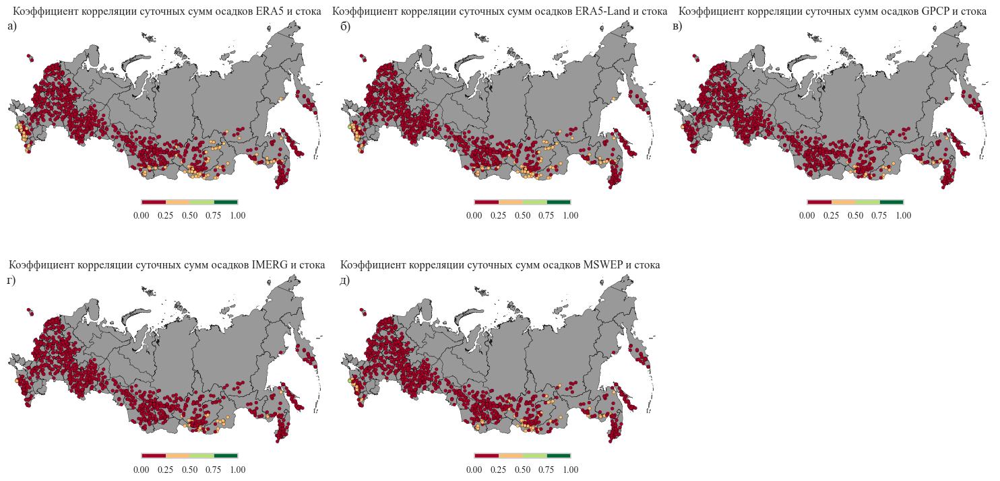

In [156]:
r2_plots = russia_plots_n(
    gdf_to_plot=r2_meteo["1D"],
    basemap_data=basemap_data,
    cmap_name="RdYlGn",
    figsize=(15, 8),
    label_list=["а)", "б)", "в)", "г)", "д)"],
    nrows=2,
    ncols=3,
    columns_from_gdf=["prcp_e5", "prcp_e5l",
                      "prcp_gpcp", "prcp_imerg", "prcp_mswep"],
    with_histogram=False,
    title_text=[
        "Коэффициент корреляции суточных сумм осадков ERA5 и стока",
        "Коэффициент корреляции суточных сумм осадков ERA5-Land и стока",
        "Коэффициент корреляции суточных сумм осадков GPCP и стока",
        "Коэффициент корреляции суточных сумм осадков IMERG и стока",
        "Коэффициент корреляции суточных сумм осадков MSWEP и стока",
    ],
)
r2_plots.savefig("./images/r2_plots_1d.png", dpi=1500, bbox_inches="tight")

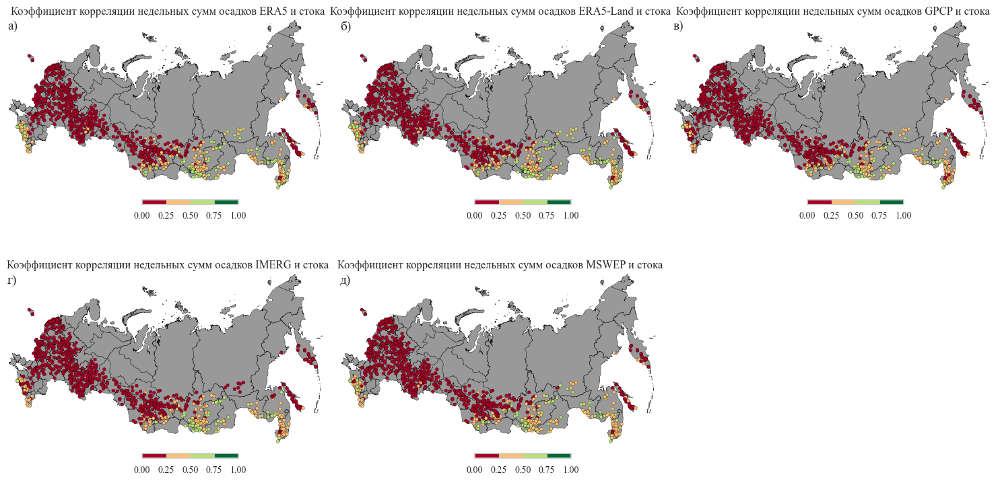

In [152]:
r2_plots_7d = russia_plots_n(
    gdf_to_plot=r2_meteo["7D"],
    basemap_data=basemap_data,
    figsize=(15, 8),
    label_list=["а)", "б)", "в)", "г)", "д)"],
    nrows=2,
    ncols=3,
    columns_from_gdf=["prcp_e5", "prcp_e5l",
                      "prcp_gpcp", "prcp_imerg", "prcp_mswep"],
    with_histogram=False,
    title_text=[
        "Коэффициент корреляции недельных сумм осадков ERA5 и стока",
        "Коэффициент корреляции недельных сумм осадков ERA5-Land и стока",
        "Коэффициент корреляции недельных сумм осадков GPCP и стока",
        "Коэффициент корреляции недельных сумм осадков IMERG и стока",
        "Коэффициент корреляции недельных сумм осадков MSWEP и стока",
    ],
)
r2_plots_7d.savefig("./images/r2_plots_7d.png", dpi=1500, bbox_inches="tight")

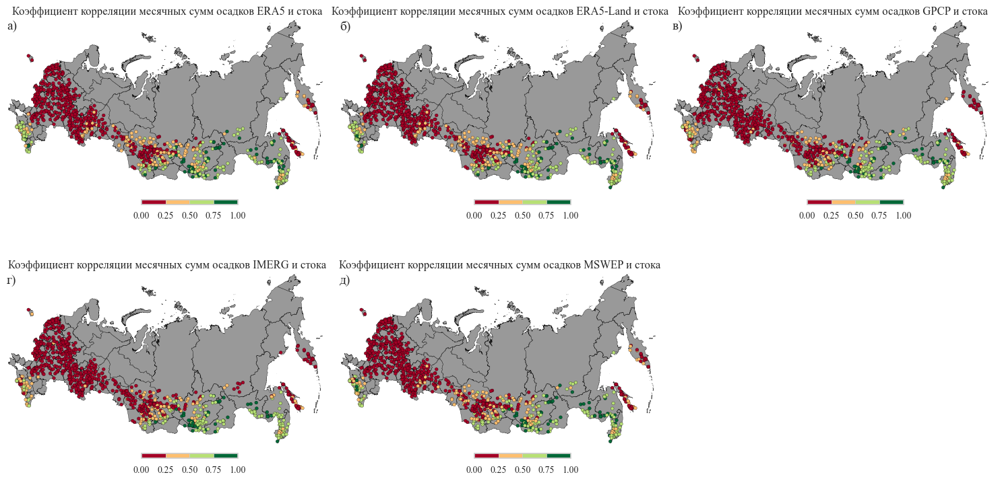

In [154]:
r2_plots_30d = russia_plots_n(
    gdf_to_plot=r2_meteo["30D"],
    basemap_data=basemap_data,
    figsize=(15, 8),
    label_list=["а)", "б)", "в)", "г)", "д)"],
    nrows=2,
    ncols=3,
    columns_from_gdf=["prcp_e5", "prcp_e5l",
                      "prcp_gpcp", "prcp_imerg", "prcp_mswep"],
    with_histogram=False,
    title_text=[
        "Коэффициент корреляции месячных сумм осадков ERA5 и стока",
        "Коэффициент корреляции месячных сумм осадков ERA5-Land и стока",
        "Коэффициент корреляции месячных сумм осадков GPCP и стока",
        "Коэффициент корреляции месячных сумм осадков IMERG и стока",
        "Коэффициент корреляции месячных сумм осадков MSWEP и стока",
    ],
)
r2_plots_30d.savefig("./images/r2_plots_30d.png",
                     dpi=1500, bbox_inches="tight")

### Different meteo input

In [62]:
# lstm era5l
lstm_era5l, nse_era5l = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5L_static_SmallMedium_0205_095021/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm era5
lstm_era5, nse_era5 = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5_SmallMedium_1205_112433/test/model_epoch021/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm gpcp
lstm_gpcp, nse_gpcp = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/gpcp_SmallMedium_1205_054740/test/model_epoch030/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm imerg
lstm_imerg, nse_imerg = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/imerg_SmallMedium_1205_085602/test/model_epoch030/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm mswep
lstm_mswep, nse_mswep = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/mswep_static_SmallMedium_0205_153244/test/model_epoch021/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm no static
lstm_no_static, nse_no_static = metric_viewer(
    metric_csv="../test_meteo_input/runs_no_static/era5Land_prcp_0604_111347/test/model_epoch030/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# file for table
nse_file = gpd.GeoDataFrame(geometry=lstm_era5["geometry"])
nse_file.index = lstm_era5.index
nse_file[["name_ru", "name_en"]] = lstm_era5[["name_ru", "name_en"]]
nse_file["NSE_era5l"] = lstm_era5l["NSE"]
nse_file["NSE_era5"] = lstm_era5["NSE"]
nse_file["NSE_gpcp"] = lstm_gpcp["NSE"]
nse_file["NSE_imerg"] = lstm_imerg["NSE"]
nse_file["NSE_mswep"] = lstm_mswep["NSE"]
nse_file["NSE_no_static"] = lstm_no_static["NSE"]
# get rid of imerg errors
# nse_file = nse_file.replace(np.NaN, 0)
nse_file[
    ["NSE_era5l", "NSE_era5", "NSE_gpcp", "NSE_imerg", "NSE_mswep", "NSE_no_static"]
] = nse_file[
    ["NSE_era5l", "NSE_era5", "NSE_gpcp", "NSE_imerg", "NSE_mswep", "NSE_no_static"]
].clip(lower=0)
# give ugms some shine
for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i,
        [
            "NSE_era5l",
            "NSE_era5",
            "NSE_gpcp",
            "NSE_imerg",
            "NSE_mswep",
            "NSE_no_static",
        ],
    ] = ugms_part[
        ["NSE_era5l", "NSE_era5", "NSE_gpcp",
            "NSE_imerg", "NSE_mswep", "NSE_no_static"]
    ].median()
basin_districts.loc[
    [25, 26, 27],
    ["NSE_era5l", "NSE_era5", "NSE_gpcp", "NSE_imerg", "NSE_mswep", "NSE_no_static"],
] = np.NaN

A Jupyter Widget

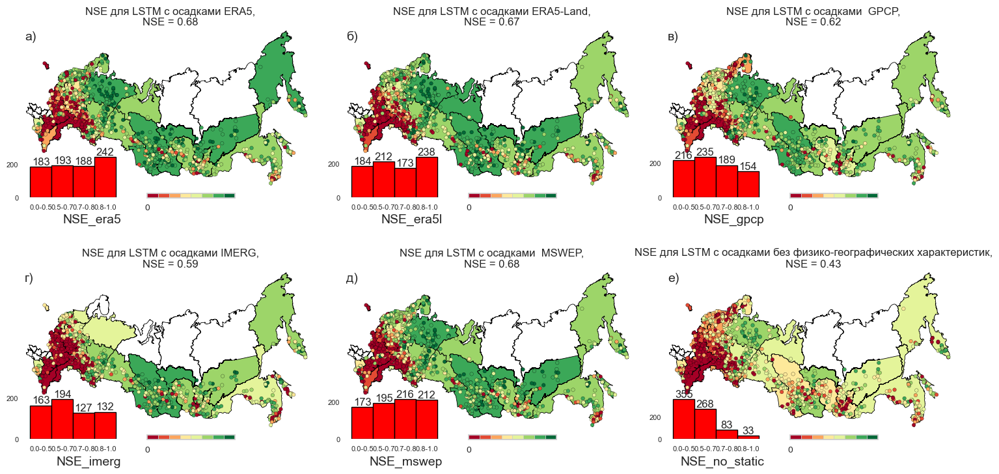

In [16]:
meteo_nse = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=3,
    label_list=["а)", "б)", "в)", "г)", "д)", "е)"],
    columns_from_gdf=[
        "NSE_era5",
        "NSE_era5l",
        "NSE_gpcp",
        "NSE_imerg",
        "NSE_mswep",
        "NSE_no_static",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для LSTM с осадками ERA5,\nNSE = {nse_era5:.2f}",
        f"NSE для LSTM с осадками ERA5-Land,\nNSE = {nse_era5l:.2f}",
        f"NSE для LSTM с осадками  GPCP,\nNSE = {nse_gpcp:.2f}",
        f"NSE для LSTM с осадками IMERG,\nNSE = {nse_imerg:.2f}",
        f"NSE для LSTM с осадками  MSWEP,\nNSE = {nse_mswep:.2f}",
        f"NSE для LSTM с осадками без физико-географических характеристик,\nNSE = {nse_no_static:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)
meteo_nse.savefig("./images/meteo_nse.png", dpi=1500, bbox_inches="tight")

### Model comparison for IEEE

In [4]:
temp = pd.read_csv("./tables/GR4J_ayzel_res.csv")
temp = temp.rename(columns={"Unnamed: 0": "gauge_id"})
temp.to_csv("./tables/GR4J_ayzel_res.csv", index=False)

In [66]:
# lstm + static
lstm_era5l, nse_lstm_static = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5L_static_SmallMedium_0205_095021/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm (only meteo)
lstm_no_static, nse_lstm_meteo = metric_viewer(
    metric_csv="../test_meteo_input/runs_no_static/era5Land_prcp_0604_111347/test/model_epoch030/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# hbv
hbv_ayzel, nse_hbv_ayzel = metric_viewer(
    metric_csv="./tables/HBV_ayzel_res.csv", metric_col="NSE", gauges_file=gauges_file
)
# gr4j
gr4j_ayzel, nse_gr4j_ayzel = metric_viewer(
    metric_csv="./tables/GR4J_ayzel_res.csv", metric_col="NSE", gauges_file=gauges_file
)

ws_file = ws_file.loc[lstm_era5l.index, :]


nse_file = gpd.GeoDataFrame(geometry=lstm_era5l["geometry"])
nse_file.index = lstm_era5l.index
nse_file[["name_ru", "name_en"]] = lstm_era5l[["name_ru", "name_en"]]
nse_file["NSE EA-LSTM"] = lstm_era5l["NSE"]
nse_file["NSE LSTM"] = lstm_no_static.loc[
    [True if x in lstm_era5l.index else False for x in lstm_no_static.index], :
]["NSE"]
nse_file["NSE HBV"] = hbv_ayzel["NSE"]
nse_file["NSE GR4J"] = gr4j_ayzel["NSE"]

# get rid of imerg errors
# nse_file = nse_file.replace(np.NaN, 0)
nse_file[["NSE EA-LSTM", "NSE LSTM", "NSE HBV", "NSE GR4J"]] = nse_file[
    ["NSE EA-LSTM", "NSE LSTM", "NSE HBV", "NSE GR4J"]
].clip(lower=0)

for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE EA-LSTM", "NSE LSTM", "NSE HBV", "NSE GR4J"]] = (
        ugms_part[["NSE EA-LSTM", "NSE LSTM", "NSE HBV", "NSE GR4J"]].median()
    )

basin_districts.loc[[26, 27], ["NSE EA-LSTM", "NSE LSTM", "NSE HBV", "NSE GR4J"]] = (
    np.NaN
)

A Jupyter Widget

In [81]:
from visualizations.scripts.drawer import metric_viewer
import pandas as pd
import sys

sys.path.append("/home/anton/dima_experiments/my_dissertation")

# hbv
hbv_ayzel = pd.read_csv("./tables/HBV_ayzel_res.csv", index_col="gauge_id")
hbv_ayzel.index = hbv_ayzel.index.astype(str)
# gr4j
gr4j_ayzel = pd.read_csv("./tables/GR4J_ayzel_res.csv", index_col="gauge_id")
gr4j_ayzel.index = gr4j_ayzel.index.astype(str)

lstm_era5l = pd.read_csv("./tables/LSTM_static_res.csv", index_col="gauge_id")
lstm_era5l.index.name = "gauge_id"
lstm_era5l.index = lstm_era5l.index.astype(str)

lstm_no_static = pd.read_csv(
    "./tables/LSTM_no_static_res.csv", index_col="gauge_id")
lstm_no_static.index.name = "gauge_id"
lstm_no_static.index = lstm_no_static.index.astype(str)

In [82]:
cross_gr4j = gr4j_ayzel.loc[gr4j_ayzel.index.isin(lstm_era5l.index)]
cross_gr4j = cross_gr4j[["NSE", "KGE", "r", "beta"]]
cross_hbv = hbv_ayzel.loc[hbv_ayzel.index.isin(lstm_era5l.index)]
cross_hbv = cross_hbv[["NSE", "KGE", "r", "beta"]]

cross_lstm = lstm_era5l.loc[lstm_era5l.index.isin(cross_hbv.index)]
cross_lstm = cross_lstm[["NSE", "KGE", "r", "beta"]]

cross_lstm_ns = lstm_no_static.loc[lstm_no_static.index.isin(cross_hbv.index)]
cross_lstm_ns = cross_lstm_ns[["NSE", "KGE", "r", "beta"]]

In [83]:
stat_df = pd.DataFrame()
stat_df.index.name = "Model"
for model, df in {
    "LSTM-static": cross_lstm,
    "LSTM": cross_lstm_ns,
    "HBV": cross_hbv,
    "GR4J": cross_gr4j,
}.items():
    cols = df.columns
    stat_df.loc[model, cols] = df.median().values
    stat_df.loc[model, "NSE>0.5"] = sum(df["NSE"] > 0.5)
stat_df

,NSE,KGE,r,beta,NSE>0.5
Model,,,,,
LSTM-static,0.707803,0.686369,0.875550,1.014403,165.0
LSTM,0.478465,0.437377,0.772485,1.103848,114.0
HBV,0.534144,0.604575,0.817865,-0.444003,130.0
GR4J,0.645797,0.637641,0.847221,-0.943268,146.0


In [13]:
pd.read_csv("./tables/LSTM_static_res.csv",
            index_col="Unnamed: 0")["beta"].median()

1.0049031477796977

In [64]:
stat_df.to_csv("./tables/compare_table.csv")

In [84]:
stat_df

,NSE,KGE,r,beta,NSE>0.5
Model,,,,,
LSTM-static,0.707803,0.686369,0.875550,1.014403,165.0
LSTM,0.478465,0.437377,0.772485,1.103848,114.0
HBV,0.534144,0.604575,0.817865,-0.444003,130.0
GR4J,0.645797,0.637641,0.847221,-0.943268,146.0


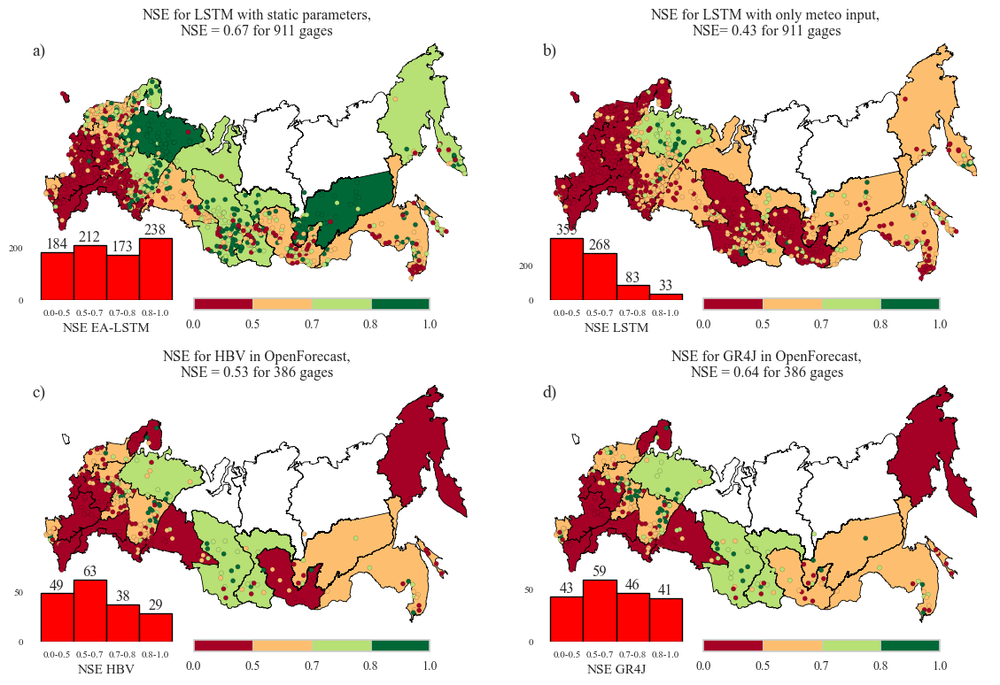

In [69]:
v = len(
    lstm_no_static.loc[
        [True if x in lstm_era5l.index else False for x in lstm_no_static.index], :
    ]
)
differ_models = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=2,
    columns_from_gdf=["NSE EA-LSTM", "NSE LSTM", "NSE HBV", "NSE GR4J"],
    label_list=["a)", "b)", "c)", "d)"],
    with_histogram=True,
    title_text=[
        f"NSE for LSTM with static parameters,\nNSE = {nse_lstm_static:.2f} for {len(lstm_era5l)} gages",
        f"NSE for LSTM with only meteo input, \nNSE={nse_lstm_meteo: .2f} for {v} gages",
        f"NSE for HBV in OpenForecast,\nNSE = {nse_hbv_ayzel:.2f} for {len(hbv_ayzel)} gages",
        f"NSE for GR4J in OpenForecast,\nNSE = {nse_gr4j_ayzel:.2f} for {len(gr4j_ayzel)} gages",
    ],
    ugms=True,
    ugms_gdf=basin_districts.iloc[np.r_[4:25, 26:28], :],
)
differ_models.savefig("./images/IEE_PLOT.pdf", dpi=600, bbox_inches="tight")

### Spatial distribution of NSE quality

In [ ]:
metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5L_static_SmallMedium_0205_095021/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)

In [60]:
# tft era5l
lstm_era5l, nse_era5l = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5L_static_SmallMedium_0205_095021/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft single era5l
tft_era5l, nse_tft = metric_viewer(
    metric_csv="../forecast/result/tft_by_gauge.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft single era5l
tft_all_era5l, nse_tft_all = metric_viewer(
    metric_csv="../forecast/result/tft_predictions_256.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# hbv era5l
hbv_era5l, nse_hbv = metric_viewer(
    metric_csv="../conceptual_runs/final_hbv.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# gr4j era5l
gr4j_era5l, nse_gr4j = metric_viewer(
    metric_csv="../conceptual_runs/final_gr4j.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# rfr era5l
rfr_era5l, nse_rfr = metric_viewer(
    metric_csv="../conceptual_runs/res_rfr.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
ws_file = ws_file.loc[tft_era5l.index, :]

In [61]:
nse_file = gpd.GeoDataFrame(geometry=lstm_era5["geometry"])
nse_file.index = lstm_era5.index
nse_file[["name_ru", "name_en"]] = lstm_era5[["name_ru", "name_en"]]
nse_file["NSE_era5l"] = lstm_era5["NSE"]
nse_file["NSE_TFT"] = tft_era5l["NSE"]
nse_file["NSE_TFT_all"] = tft_all_era5l["NSE"]
nse_file["NSE_hbv"] = hbv_ayzel["NSE"]
nse_file["NSE_gr4j"] = gr4j_ayzel["NSE"]
nse_file["NSE_rfr"] = rfr_era5l["NSE"]
# get rid of imerg errors
# nse_file = nse_file.replace(np.NaN, 0)
nse_file[["NSE_era5l", "NSE_TFT", "NSE_TFT_all", "NSE_hbv", "NSE_gr4j", "NSE_rfr"]] = (
    nse_file[
        ["NSE_era5l", "NSE_TFT", "NSE_TFT_all", "NSE_hbv", "NSE_gr4j", "NSE_rfr"]
    ].clip(lower=0)
)

for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = nse_file.loc[
        [geom.intersects(gage_point) for gage_point in nse_file["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["NSE_era5l", "NSE_TFT", "NSE_TFT_all",
            "NSE_hbv", "NSE_gr4j", "NSE_rfr"]
    ] = ugms_part[
        ["NSE_era5l", "NSE_TFT", "NSE_TFT_all", "NSE_hbv", "NSE_gr4j", "NSE_rfr"]
    ].median()
basin_districts.loc[
    [26, 27], ["NSE_era5l", "NSE_TFT", "NSE_TFT_all",
               "NSE_hbv", "NSE_gr4j", "NSE_rfr"]
] = np.NaN

NameError: name 'lstm_era5' is not defined

In [53]:
differ_models = russia_plots_n(
    gdf_to_plot=nse_file,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=3,
    columns_from_gdf=[
        "NSE_era5l",
        "NSE_TFT",
        "NSE_TFT_all",
        "NSE_hbv",
        "NSE_gr4j",
        "NSE_rfr",
    ],
    label_list=["а)", "б)", "в)", "г)", "д)", "е)"],
    with_histogram=True,
    title_text=[
        f"NSE для LSTM с осадками ERA5-Land,\nNSE = {nse_era5l:.2f}",
        f"NSE для Temporal Fusion Transformer (по постам),\nNSE = {nse_tft:.2f}",
        f"NSE для Temporal Fusion Transformer,\nNSE = {nse_tft_all:.2f}",
        f"NSE для HBV OpenForecast,\nNSE = {nse_hbv_ayzel:.2f}",
        f"NSE для GR4J OpenForecast,\nNSE = {nse_gr4j__ayzel:.2f}",
        f"NSE для Random Forest Regressor,\nNSE = {nse_rfr:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)
differ_models.savefig("./images/differ_models.png",
                      dpi=1500, bbox_inches="tight")

NameError: name 'nse_file' is not defined

In [17]:
temp_df = pd.read_csv("../forecast/result/tft_predictions_64.csv")
temp_df = temp_df.iloc[:-5]
temp_df.index = tft_era5l.index
temp_df.to_csv("../forecast/result/tft_predictions_64.csv")

### Blind forecast

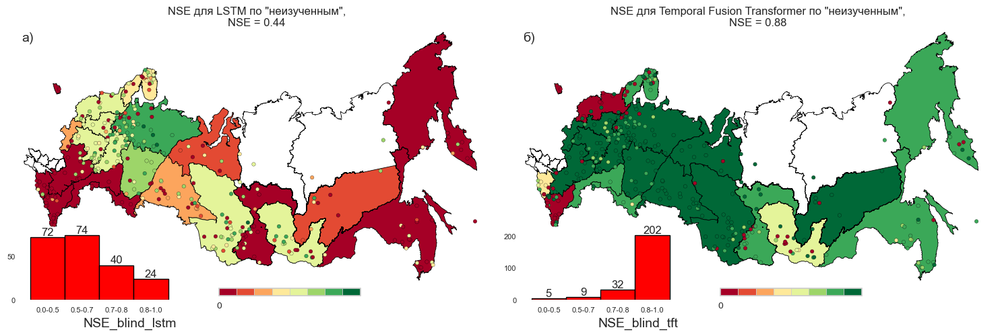

In [5]:
# lstm blind
lstm_blind, nse_lstm_blind = metric_viewer(
    metric_csv="../test_meteo_input/runs_blind/era5L_static_CellsBlind_2004_130807/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft blind
tft_blind, nse_tft_blind = metric_viewer(
    metric_csv="/workspaces/my_dissertation/forecast/result/blind_forecast_tft_256_20epoch.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
lstm_blind = lstm_blind[lstm_blind.index.isin(tft_blind.index)]


blind_gdf = gpd.GeoDataFrame(geometry=lstm_blind["geometry"])

blind_gdf["NSE_blind_tft"] = tft_blind["NSE"]
blind_gdf["NSE_blind_lstm"] = lstm_blind["NSE"]
blind_gdf.to_csv("./tables/partial_gages.csv")

for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = blind_gdf.loc[
        [geom.intersects(gage_point) for gage_point in blind_gdf["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE_blind_tft", "NSE_blind_lstm"]] = ugms_part[
        ["NSE_blind_tft", "NSE_blind_lstm"]
    ].median()
basin_districts.loc[[26, 27], ["NSE_blind_tft", "NSE_blind_lstm"]] = np.NaN

blind_plots = russia_plots_n(
    gdf_to_plot=blind_gdf,
    basemap_data=basemap_data,
    figsize=(15, 8),
    label_list=["а)", "б)"],
    nrows=1,
    ncols=2,
    columns_from_gdf=["NSE_blind_lstm", "NSE_blind_tft"],
    with_histogram=True,
    title_text=[
        f'NSE для LSTM по "неизученным",\nNSE = {nse_lstm_blind:.2f}',
        f'NSE для Temporal Fusion Transformer по "неизученным",\nNSE = {nse_tft_blind:.2f}',
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)
# blind_plots.savefig('./images/blind_forecast.png',
#                     dpi=1500, bbox_inches='tight')

### CDF for model runs

In [179]:
# random forest regressor
rfr_run, nse_rfr = metric_viewer(
    metric_csv="../conceptual_runs/res_rfr.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# hbv
hbv_ayzel, nse_hbv_ayzel = metric_viewer(
    metric_csv="./tables/DELETE_NSE_HBV.csv", metric_col="NSE", gauges_file=gauges_file
)
# gr4j
gr4j_ayzel, nse_gr4j__ayzel = metric_viewer(
    metric_csv="./tables/DELETE_NSE.csv", metric_col="NSE", gauges_file=gauges_file
)
# hbv
my_hbv, nse_hbv_my = metric_viewer(
    metric_csv="../conceptual_runs/final_hbv.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# gr4j
my_gr4j, nse_gr4j_my = metric_viewer(
    metric_csv="../conceptual_runs/final_gr4j.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft (by gauge)
tft_run, nse_tft_single = metric_viewer(
    metric_csv="../forecast/result/tft_by_gauge.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft (all together)
tft_256, nse_tft_all = metric_viewer(
    metric_csv="../forecast/result/tft_predictions_256.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm + static
lstm_era5l, nse_lstm_static = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5L_static_SmallMedium_0205_095021/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm (only meteo)
lstm_no_static, nse_lstm_meteo = metric_viewer(
    metric_csv="../test_meteo_input/runs_no_static/era5Land_prcp_0604_111347/test/model_epoch030/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)

In [180]:
# tft single era5l
tft_single, nse_tft = metric_viewer(
    metric_csv="../forecast/result/tft_by_gauge.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft single era5l
tft_256, nse_tft_all = metric_viewer(
    metric_csv="../forecast/result/tft_predictions_256.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft 64
tft_64, nse_tft = metric_viewer(
    metric_csv="../forecast/result/tft_predictions_64.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft single era5l
tft_6, nse_tft_all = metric_viewer(
    metric_csv="../forecast/result/tft_predictions_6.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)

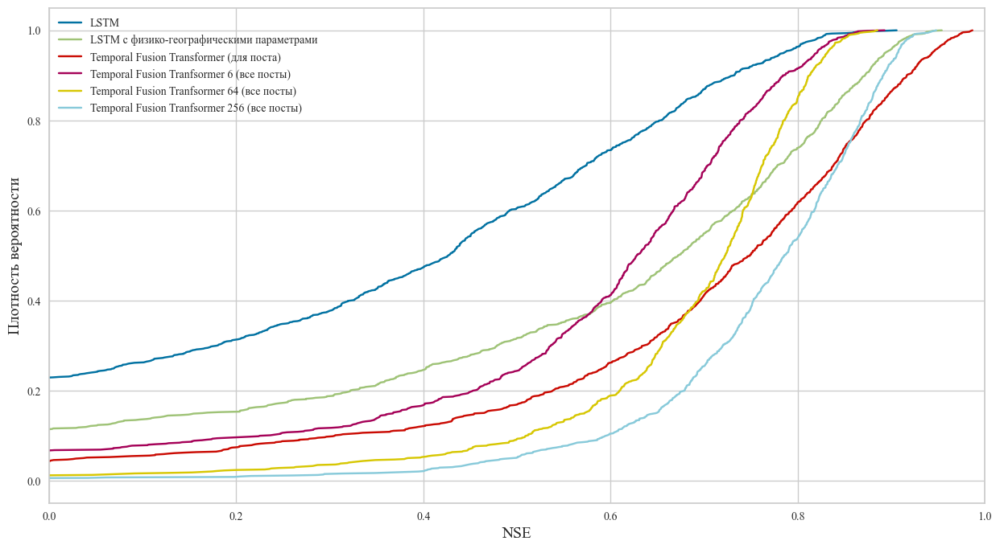

In [181]:
def ecdf(x: np.ndarray):
    """Calculate empirical cummulative density function

    Parameters
    ----------
    x : np.ndarray
        Array containing the data

    Returns
    -------
    x : np.ndarray
        Array containing the sorted metric values
    y : np.ndarray]
        Array containing the sorted cdf values
    """
    xs = np.sort(x)
    ys = np.arange(1, len(xs) + 1) / float(len(xs))
    return xs, ys


fig, ax = plt.subplots(figsize=(15, 8))

for name, fil in {
    "LSTM": lstm_no_static["NSE"],
    "LSTM с физико-географическими параметрами": lstm_era5l["NSE"],
    "Temporal Fusion Transformer (для поста)": tft_run["NSE"],
    "Temporal Fusion Tranfsormer 6 (все посты)": tft_6["NSE"],
    "Temporal Fusion Tranfsormer 64 (все посты)": tft_64["NSE"],
    "Temporal Fusion Tranfsormer 256 (все посты)": tft_256["NSE"],
}.items():
    bin_, cdf_ = ecdf(fil.to_numpy())
    plt.plot(bin_, cdf_, label=f"{name}")
    ax.set_xlim(0, 1)
    ax.grid(True)
    ax.legend(loc="upper left")
    ax.set_xlabel("NSE", fontsize=14)
    ax.set_ylabel("Плотность вероятности", fontsize=14)
fig.savefig("./images/CDF_models_TFT.png", dpi=1000, bbox_inches="tight")

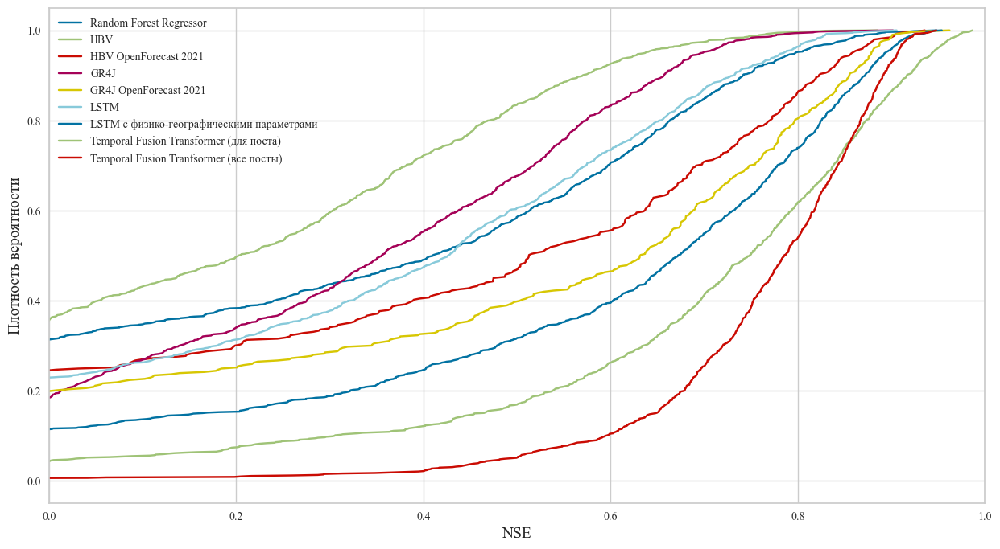

In [183]:
def ecdf(x: np.ndarray):
    """Calculate empirical cummulative density function

    Parameters
    ----------
    x : np.ndarray
        Array containing the data

    Returns
    -------
    x : np.ndarray
        Array containing the sorted metric values
    y : np.ndarray]
        Array containing the sorted cdf values
    """
    xs = np.sort(x)
    ys = np.arange(1, len(xs) + 1) / float(len(xs))
    return xs, ys


fig, ax = plt.subplots(figsize=(15, 8))

for name, fil in {
    "Random Forest Regressor": rfr_run["NSE"],
    "HBV": my_hbv["NSE"],
    "HBV OpenForecast 2021": hbv_ayzel["NSE"],
    "GR4J": my_gr4j["NSE"],
    "GR4J OpenForecast 2021": gr4j_ayzel["NSE"],
    "LSTM": lstm_no_static["NSE"],
    "LSTM с физико-географическими параметрами": lstm_era5l["NSE"],
    "Temporal Fusion Transformer (для поста)": tft_run["NSE"],
    "Temporal Fusion Tranfsormer (все посты)": tft_256["NSE"],
}.items():
    bin_, cdf_ = ecdf(fil.to_numpy())
    plt.plot(bin_, cdf_, label=f"{name}")
    ax.set_xlim(0, 1)
    ax.grid(True)
    ax.legend(loc="upper left")
    ax.set_xlabel("NSE", fontsize=14)
    ax.set_ylabel("Плотность вероятности", fontsize=14)
fig.savefig("./images/CDF_models.png", dpi=1500, bbox_inches="tight")

### Result table for NSE

In [46]:
# random forest regressor
rfr_run, nse_rfr = metric_viewer(
    metric_csv="../conceptual_runs/res_rfr.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# hbv
hbv_ayzel, nse_hbv_ayzel = metric_viewer(
    metric_csv="./tables/DELETE_NSE_HBV.csv", metric_col="NSE", gauges_file=gauges_file
)
# gr4j
gr4j_ayzel, nse_gr4j__ayzel = metric_viewer(
    metric_csv="./tables/DELETE_NSE.csv", metric_col="NSE", gauges_file=gauges_file
)
# hbv
my_hbv, nse_hbv_my = metric_viewer(
    metric_csv="../conceptual_runs/final_hbv.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# gr4j
my_gr4j, nse_gr4j_my = metric_viewer(
    metric_csv="../conceptual_runs/final_gr4j.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft (by gauge)
tft_run, nse_tft_single = metric_viewer(
    metric_csv="../forecast/result/tft_by_gauge.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# tft (all together)
tft_256, nse_tft_all = metric_viewer(
    metric_csv="../forecast/result/tft_predictions_256.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm + static
lstm_era5l, nse_lstm_static = metric_viewer(
    metric_csv="../test_meteo_input/runs_static/era5L_static_SmallMedium_0205_095021/test/model_epoch024/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
# lstm (only meteo)
lstm_no_static, nse_lstm_meteo = metric_viewer(
    metric_csv="../test_meteo_input/runs_no_static/era5Land_prcp_0604_111347/test/model_epoch030/test_metrics.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)

In [58]:
def nse_descriptor(nse_df: pd.DataFrame, model_name: str):
    res_df = pd.DataFrame()
    res_df.loc[0, "Модель"] = model_name

    res_df.loc[0, "Объектов в выборке"] = f"{len(nse_df):.0f}"

    nse_max = nse_df["NSE"].max()
    res_df.loc[0, "Максимум NSE"] = f"{nse_max:.2f}"

    nse_median = nse_df["NSE"].median()
    res_df.loc[0, "Медианный NSE"] = f"{nse_median:.2f}"

    nse_mean = nse_df["NSE"].mean()
    res_df.loc[0, "Средний NSE"] = f"{nse_mean:.2f}"

    nse_min = nse_df["NSE"].min()
    res_df.loc[0, "Минимум NSE"] = f"{nse_min:.2f}"

    nse_less_t_z = (nse_df["NSE"] < 0).sum()
    res_df.loc[0, "NSE < 0"] = f"{nse_less_t_z:.0f}"

    bad_models = (nse_df["NSE"] < 0.5).sum()
    res_df.loc[0, "Плохие модели, %"] = f"{(bad_models/len(nse_df)):.0%}"

    return res_df


test_gr4j = deepcopy(gr4j_era5l)
test_rfr = deepcopy(rfr_era5l)

for g_id in test_gr4j.index:
    if g_id in ws_file.index:
        pass
    else:
        test_gr4j = test_gr4j.drop(g_id)

for g_id in test_rfr.index:
    if g_id in ws_file.index:
        pass
    else:
        test_rfr = test_rfr.drop(g_id)
res_list = list()

hbv_ayzel.replace([np.inf, -np.inf], np.nan, inplace=True)
hbv_ayzel.loc[hbv_ayzel.sort_values(by="NSE").head(10).index, "NSE"] = 0
gr4j_ayzel.replace([np.inf, -np.inf], np.nan, inplace=True)


for model, res in {
    "LSTM физ. гео ERA5-Land": lstm_era5l,
    "LSTM физ. гео ERA5": lstm_era5,
    "LSTM физ. гео GPCP": lstm_gpcp,
    "LSTM физ. гео IMERG": lstm_imerg,
    "LSTM физ. гео MSWEP": lstm_mswep,
    "LSTM ERA5-Land без физ. гео": lstm_no_static.loc[lstm_era5l.index, :],
    "Temporal Fusion Transformer (для поста)": tft_era5l,
    "Temporal Fusion Transformer (все посты)": tft_all_era5l,
    "HBV, OpenForecast 2021": hbv_ayzel,
    "HBV ERA5-Land": hbv_era5l.loc[hbv_era5l.index.isin(lstm_era5l.index), :],
    "GR4J, OpenForecast 2021": gr4j_ayzel,
    "GR4J ERA5-Land": test_gr4j,
    "RandomForestRegressor ERA5-Land": test_rfr,
}.items():
    res_list.append(nse_descriptor(nse_df=res, model_name=model))

res_nse = (
    pd.concat(res_list)
    .sort_values(by="Медианный NSE", ascending=False)
    .reset_index(drop=True)
)
res_nse.to_csv("./tables/model_quality.csv", index=False)
res_nse

,Модель,Объектов в выборке,Максимум NSE,Медианный NSE,Средний NSE,Минимум NSE,NSE < 0,"Плохие модели, %"
0,Temporal Fusion Transformer (все посты),919,0.95,0.79,0.75,-2.72,5,5%
1,Temporal Fusion Transformer (для поста),909,0.99,0.75,0.49,-115.51,39,17%
2,LSTM физ. гео ERA5,911,0.95,0.68,0.03,-116.63,105,32%
3,LSTM физ. гео MSWEP,911,0.95,0.68,-0.11,-113.71,115,32%
4,LSTM физ. гео ERA5-Land,911,0.95,0.67,-0.00,-273.15,104,32%
5,"GR4J, OpenForecast 2021",393,0.96,0.64,-190.77,-51507.55,71,38%
6,LSTM физ. гео GPCP,911,0.93,0.62,-0.06,-179.63,117,37%
7,LSTM физ. гео IMERG,755,0.91,0.59,-0.21,-97.60,139,40%
8,"HBV, OpenForecast 2021",393,0.94,0.53,0.44,-0.38,29,45%
9,LSTM ERA5-Land без физ. гео,911,0.89,0.44,-0.06,-28.64,172,58%


### TFT attributs (feature importance, attention, etc.)

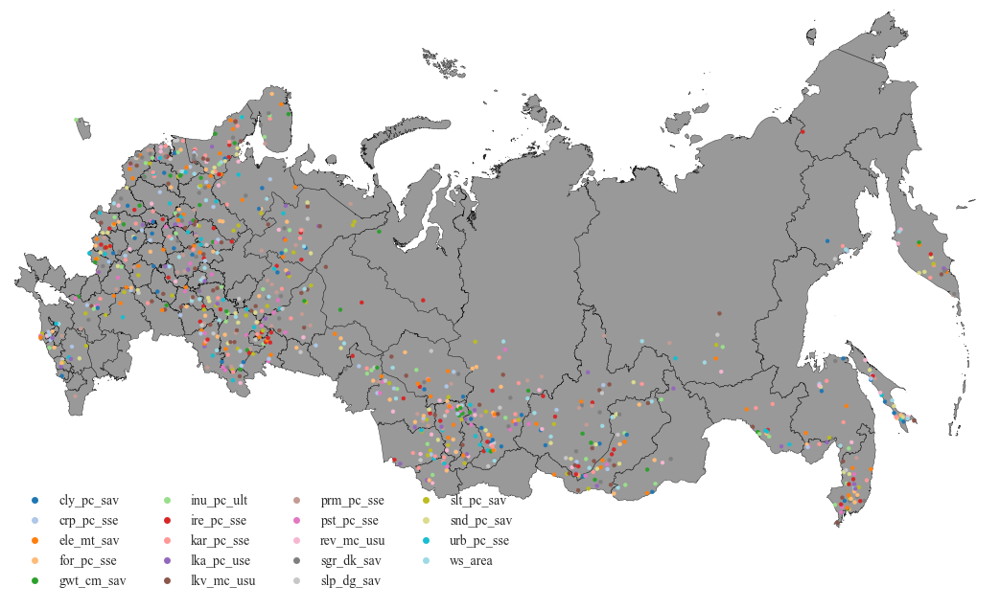

In [75]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_era5l,
    basemap_data=basemap_data,
    distinction_col="static",
    cmap_name="tab20",
    figsize=(15, 8),
    title_text="",
    just_points=True,
)
gauges_fig.savefig("./images/static_TFT.png", dpi=1500, bbox_inches="tight")

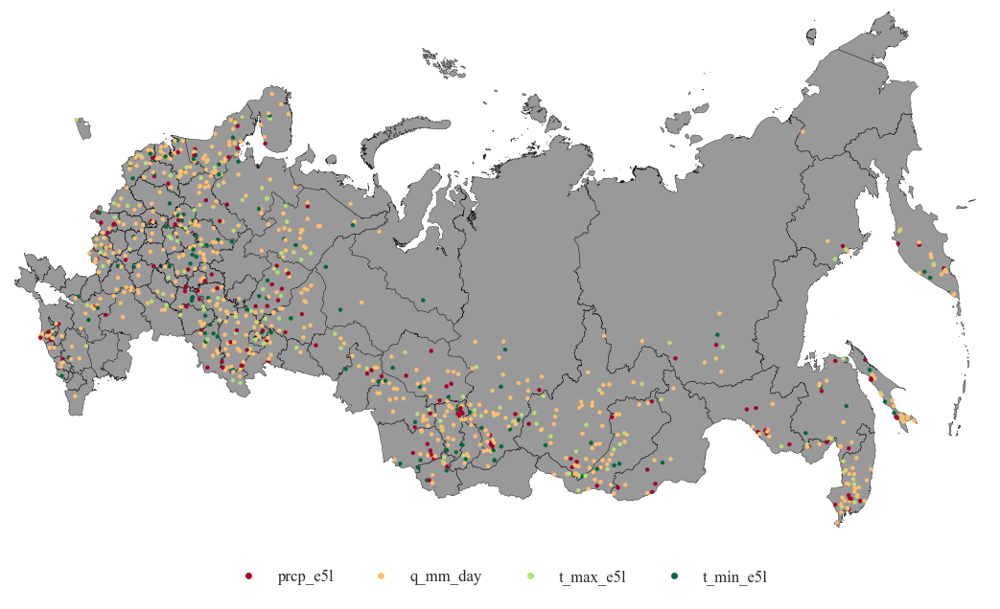

In [73]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_era5l,
    basemap_data=basemap_data,
    distinction_col="encoder",
    figsize=(15, 8),
    title_text="",
    just_points=True,
)
gauges_fig.savefig("./images/encoder_TFT.png", dpi=1500, bbox_inches="tight")

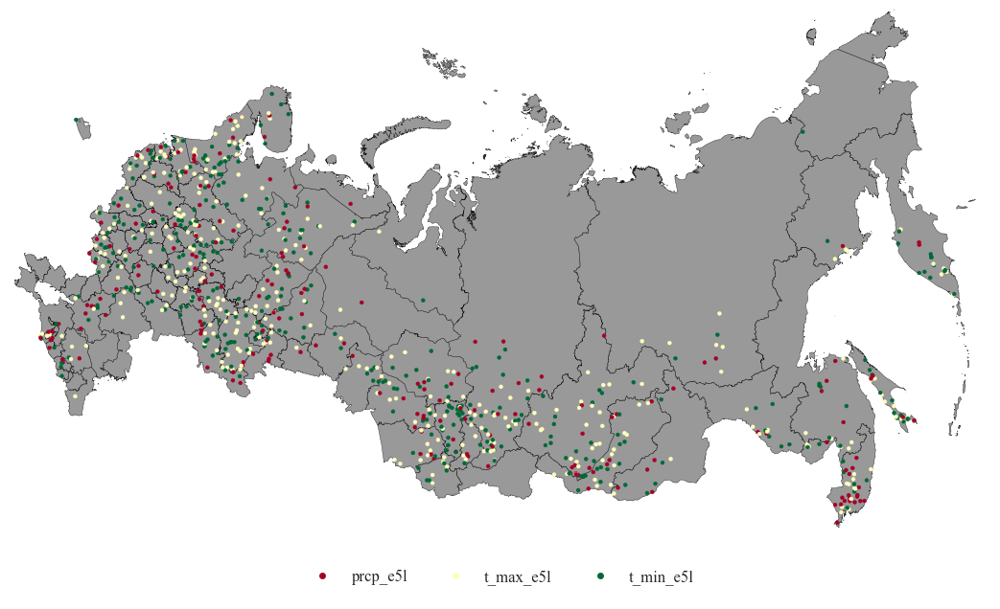

In [74]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_era5l,
    basemap_data=basemap_data,
    distinction_col="decoder",
    figsize=(15, 8),
    title_text="",
    just_points=True,
)
gauges_fig.savefig("./images/decoder_TFT.png", dpi=1500, bbox_inches="tight")

In [205]:
def day_to_attnt(val: float):
    if val < 7:
        return "Быстряя"
    elif (val >= 7) & (val <= 30):
        return "Средняя"
    elif (val >= 30) & (val <= 90):
        return "Средне-длинная"
    else:
        return "Длинная"

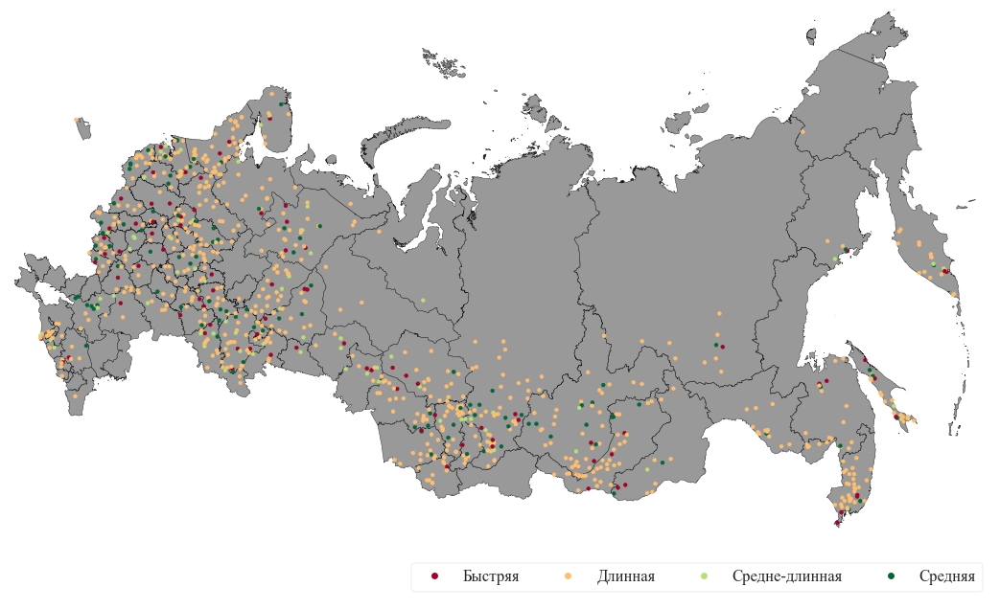

In [207]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_era5l,
    basemap_data=basemap_data,
    distinction_col="attention",
    figsize=(15, 8),
    title_text="",
    just_points=True,
)
gauges_fig.savefig("./images/attention_TFT.png", dpi=1500, bbox_inches="tight")

### GMC forecast quality

In [4]:
def find_gmc(
    predictions: np.ndarray,
    observations: np.ndarray,
    days_shift: int,
    eq_param: int,
    with_p=False,
) -> np.ndarray:
    """[summary]

    Args:
        predictions (np.array): [description]
        observations (np.array): [description]
        days_shift (int): [description]

    Returns:
        np.array: [description]
    """

    predictions_error = np.array(observations - predictions)
    delta_1 = np.array(observations[:-days_shift] - observations[days_shift:])
    sigma = np.std(delta_1 - np.mean(delta_1), ddof=1)
    gmc_criteria = np.abs(0.674 * sigma)
    S = np.sqrt(
        np.sum([i**2 for i in predictions_error]) /
        (len(predictions_error) - eq_param)
    )

    s_sigma = S / sigma

    descision = [
        "Прогноз оправдывается"
        if np.abs(error) <= gmc_criteria
        else "Прогноз не оправдывается"
        for error in predictions_error
    ]

    values, counts = np.unique(descision, return_counts=True)
    try:
        first_value, second_value = counts
        first_key, second_key = values
        print(f"\nКачество прогноза заблаговременностью {days_shift} день")
        print(
            f"""Результаты оценки качества прогноза:\n{first_key} -- {first_value} раз(а),
    {second_key} -- {second_value} раз(а)"""
        )
        print(f"Критерий точности ГМЦ +/- {gmc_criteria:.3f}")
        accuracy = second_value / (first_value + second_value)
        print(f"Оправдываемость прогнозов по методике ГМЦ {accuracy:.2%}")
        print(
            f"S/sigma_delta {s_sigma:.2f} -- длина ряда {len(predictions_error)}")
    except:
        print(f"\nКачество прогноза заблаговременностью {days_shift} день")
        print(
            f"""Результаты оценки качества прогноза:\n{values[0]} -- {counts[0]} раз(а)"""
        )
        print(f"Критерий точности ГМЦ +/- {gmc_criteria:.3f}")
        accuracy = 0
        print(f"Оправдываемость прогнозов по методике ГМЦ {accuracy:.2%}")
        print(
            f"S/sigma_delta {s_sigma:.2f} -- длина ряда {len(predictions_error)}")
    if with_p:
        return np.array(
            [
                np.round(S * 100, decimals=1),
                np.round(sigma * 100, decimals=1),
                np.round(s_sigma, decimals=2),
                f"{accuracy:.1%}",
            ]
        )

    else:
        return np.array(
            [
                np.round(gmc_criteria, decimals=3),
                np.round(s_sigma, decimals=2),
                np.round(accuracy * 100, decimals=2),
            ]
        )

In [41]:
for gauge_id in tft_all_era5l.index:
    test_df = pd.read_csv(
        f"./results/tft_256/{gauge_id}.csv", index_col="date")
    test_df.index = pd.to_datetime(test_df.index)
    tft_all_era5l.loc[gauge_id, ["S/σ", "ГМЦ"]] = find_gmc(
        predictions=test_df["q_mm_day_pred"].to_numpy(),
        observations=test_df["q_mm_day"].to_numpy(),
        days_shift=7,
        eq_param=24,
        with_p=False,
    )[1:3]
for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = tft_all_era5l.loc[
        [geom.intersects(gage_point) for gage_point in tft_all_era5l["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["ГМЦ"]] = ugms_part[["ГМЦ"]].mean()
    basin_districts.loc[i, ["S/σ"]] = ugms_part[["S/σ"]].min()

basin_districts.loc[[26, 27], ["ГМЦ", "S/σ"]] = np.NaN


Качество прогноза заблаговременностью 7 день
Результаты оценки качества прогноза:
Прогноз не оправдывается -- 78 раз(а),
    Прогноз оправдывается -- 647 раз(а)
Критерий точности ГМЦ +/- 0.334
Оправдываемость прогнозов по методике ГМЦ 89.24%
S/sigma_delta 0.73 -- длина ряда 725

Качество прогноза заблаговременностью 7 день
Результаты оценки качества прогноза:
Прогноз не оправдывается -- 149 раз(а),
    Прогноз оправдывается -- 576 раз(а)
Критерий точности ГМЦ +/- 0.552
Оправдываемость прогнозов по методике ГМЦ 79.45%
S/sigma_delta 0.73 -- длина ряда 725

Качество прогноза заблаговременностью 7 день
Результаты оценки качества прогноза:
Прогноз не оправдывается -- 64 раз(а),
    Прогноз оправдывается -- 661 раз(а)
Критерий точности ГМЦ +/- 0.422
Оправдываемость прогнозов по методике ГМЦ 91.17%
S/sigma_delta 0.67 -- длина ряда 725

Качество прогноза заблаговременностью 7 день
Результаты оценки качества прогноза:
Прогноз не оправдывается -- 196 раз(а),
    Прогноз оправдывается -- 529 раз

A Jupyter Widget

In [10]:
def s_sigma_to_qual(val: float):
    if val <= 0.5:
        return "Хорошая"
    elif (0.5 < val) & (val <= 0.8):
        return "Удовлетворительная"
    else:
        return "Плохая"


tft_all_era5l["S/σ"] = tft_all_era5l["S/σ"].apply(lambda x: s_sigma_to_qual(x))

In [11]:
s_sigma_df = pd.DataFrame()
for i, (qual, idx) in enumerate(tft_all_era5l.groupby("S/σ").groups.items()):
    s_sigma_df.loc[0, f"{qual}"] = len(idx)
s_sigma_df

,Плохая,Удовлетворительная,Хорошая
0,143.0,720.0,56.0


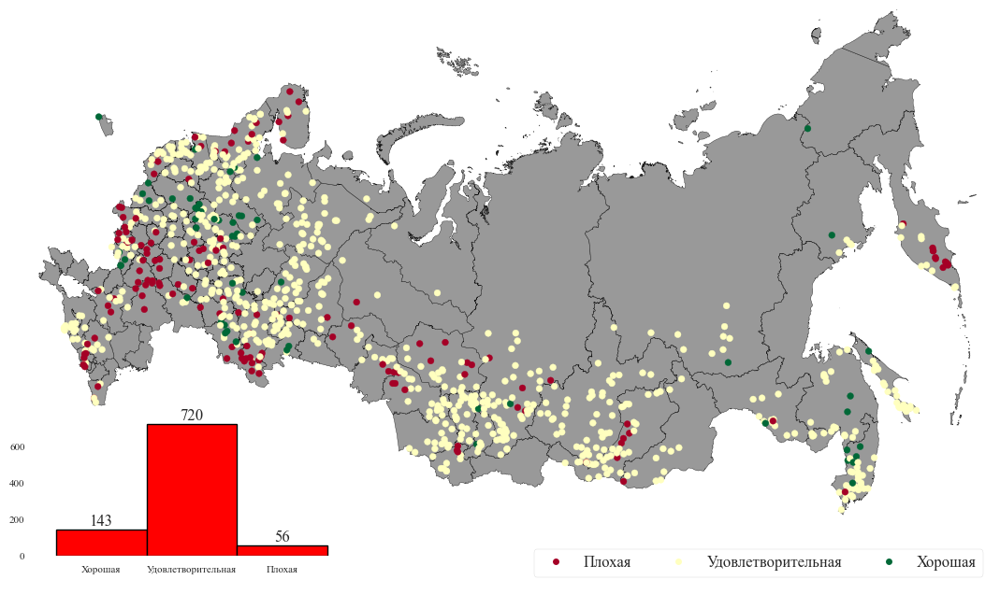

In [29]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_all_era5l,
    basemap_data=basemap_data,
    distinction_col="S/σ",
    just_points=True,
    specific_xlabel=["Хорошая", "Удовлетворительная", "Плохая"],
    figsize=(15, 8),
    title_text="",
    with_histogram=True,
)
gauges_fig.savefig("./images/s_sigma_tft.png", dpi=1500, bbox_inches="tight")

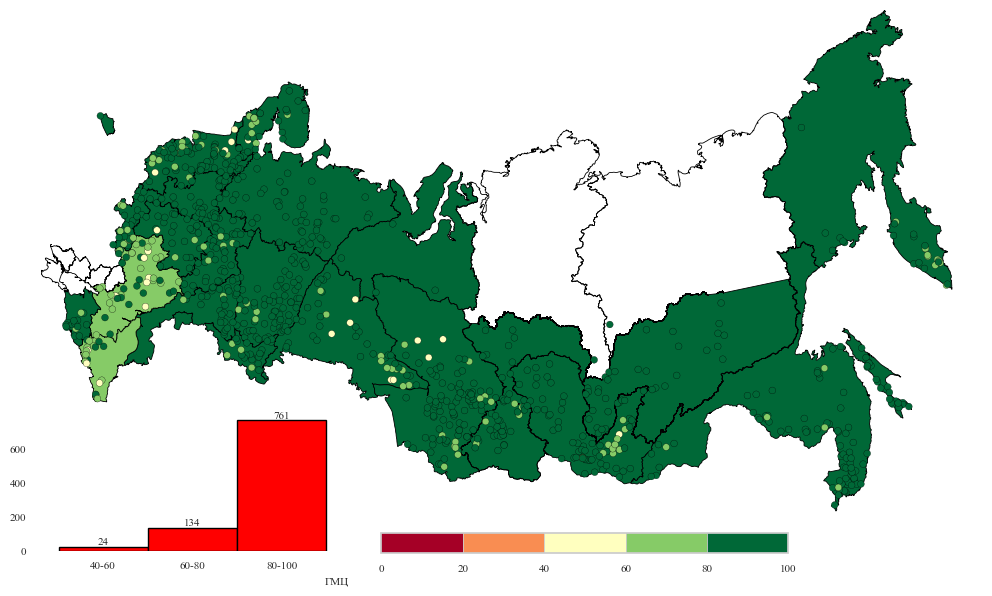

In [28]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_all_era5l,
    basemap_data=basemap_data,
    distinction_col="",
    list_of_limits=[0, 40, 60, 80, 100],
    cmap_lims=(0, 100),
    figsize=(15, 8),
    title_text="",
    with_histogram=True,
    ugms=True,
    ugms_gdf=basin_districts,
    metric_col="ГМЦ",
)
gauges_fig.savefig("./images/GMC_tft.png", dpi=1500, bbox_inches="tight")

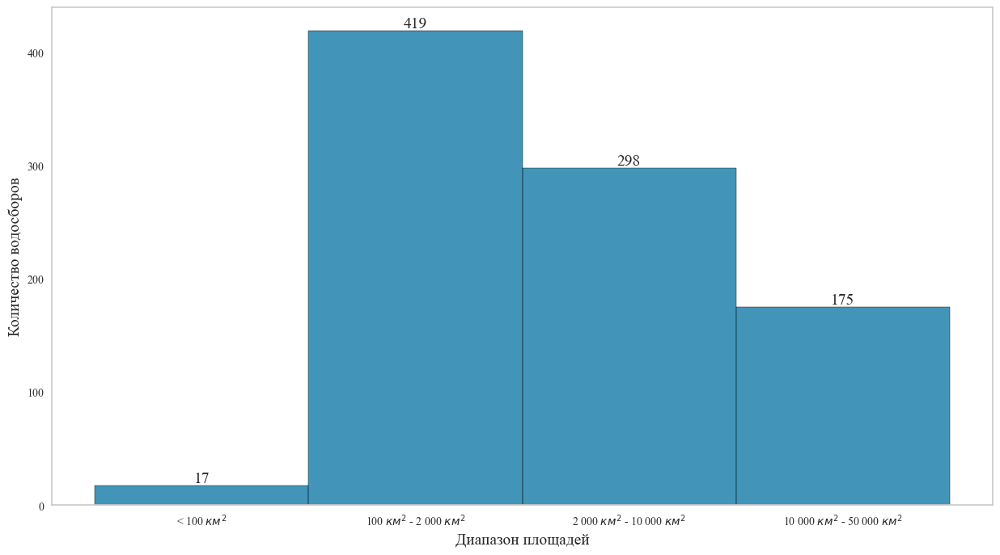

In [15]:
plt.rcParams["font.family"] = "Times New Roman"
plt.figure(figsize=(15, 8))

area_hist = sns.histplot(data=ws_file, x="size")
#  set the ticks first
area_hist.set_yticks(np.arange(0, 500, 100))
# set the labels
area_hist.set_yticklabels(np.arange(0, 500, 100))
area_hist.set_xlabel("Диапазон площадей", fontsize=14)
area_hist.set_ylabel("Количество водосборов", fontsize=14)
area_hist.bar_label(area_hist.containers[1], fmt="%.0f", fontsize=14)
area_hist.grid(False)

# area_hist.set_title(f"""Распределение водосборов по площадям""", fontsize=12);
plt.savefig("./images/area_distribution.png", dpi=1000, bbox_inches="tight")

In [30]:
stat_nse_qual = pd.DataFrame()

for i, (stat_attr, indx) in enumerate(tft_era5l.groupby("static").groups.items()):
    stat_nse_qual.loc[i, "Физико-географический атрибут"] = stat_attr
    stat_nse_qual.loc[i, "NSE"] = tft_era5l.loc[indx, "NSE"].mean()

In [38]:
stat_nse_qual.set_index("Физико-географический атрибут").T.to_csv(
    "./tables/fiz_geo_nse.csv"
)
stat_nse_qual.set_index("Физико-географический атрибут").T

Физико-географический атрибут,cly_pc_sav,crp_pc_sse,ele_mt_sav,for_pc_sse,gwt_cm_sav,inu_pc_ult,ire_pc_sse,kar_pc_sse,lka_pc_use,lkv_mc_usu,prm_pc_sse,pst_pc_sse,rev_mc_usu,sgr_dk_sav,slp_dg_sav,slt_pc_sav,snd_pc_sav,urb_pc_sse,ws_area
NSE,0.547012,0.380154,0.636396,0.685875,0.624563,0.654382,0.556711,0.708467,0.686307,0.572746,0.635245,0.610373,0.679,0.710811,0.695742,0.701114,0.433128,-2.120386,0.510478


In [77]:
ws_file["NSE"] = tft_all_era5l["NSE"]
ws_file["ГМЦ"] = tft_all_era5l["ГМЦ"]
ws_file["S/σ"] = tft_all_era5l["S/σ"]
ws_file["S/σ"] = ws_file["S/σ"].astype(float)
ws_file.loc[ws_file["S/σ"] > 1, "S/σ"] = 1.0

In [52]:
ws_file["S/σ"] = ws_file["S/σ"].apply(lambda x: round(x, 1))

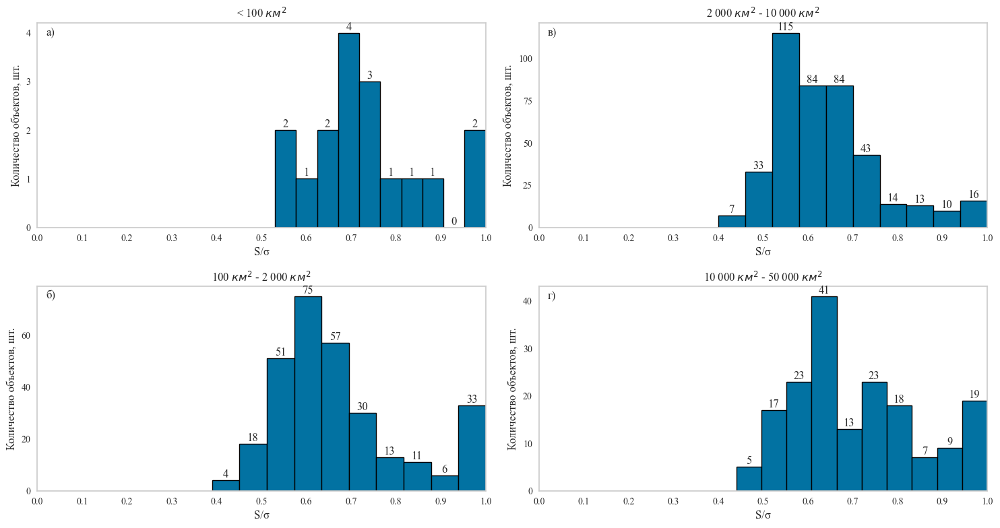

In [78]:
my_hist = ws_file.hist(
    column="S/σ", by="size", figsize=(15, 8), edgecolor="black", linewidth=1
)

xlbl = [str(col).replace(", ", "-") for col in np.unique(ws_file["size"])]
label_list = ["а)", "в)", "б)", "г)"][::-1]

for i, ax in enumerate(my_hist.flatten()[::-1]):
    ax.set_title(xlbl[i])
    ax.text(
        0.02,
        0.98,
        label_list[i],
        ha="left",
        va="top",
        transform=ax.transAxes,
        fontsize=12,
    )
    ax.set_xlabel("S/σ", fontsize=12)
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))

    ax.set_ylabel("Количество объектов, шт.", fontsize=12)
    ax.locator_params(axis="y", nbins=5)
    ax.set_xlim((0, 1.0))

    ax.locator_params(axis="x", nbins=10)
    ax.grid(False)
    ax.bar_label(ax.containers[0], fmt="%.0f".lstrip("0"))
    ax.tick_params(axis="x", labelrotation=0)
plt.tight_layout()
plt.savefig("./images/sigma_distribution.png", dpi=1500, bbox_inches="tight")

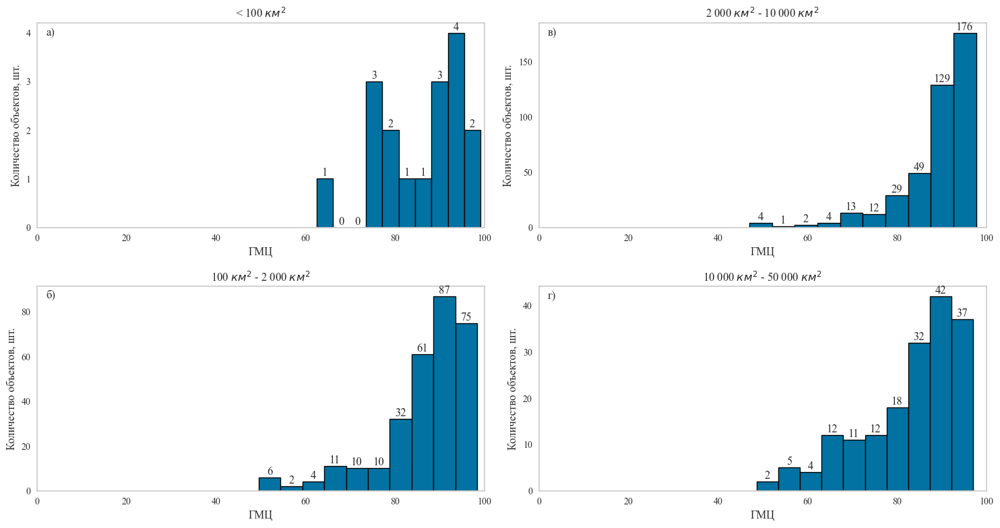

In [19]:
my_hist = ws_file.hist(
    column="ГМЦ", by="size", figsize=(15, 8), edgecolor="black", linewidth=1
)

xlbl = [str(col).replace(", ", "-") for col in np.unique(ws_file["size"])]
label_list = ["а)", "в)", "б)", "г)"][::-1]

for i, ax in enumerate(my_hist.flatten()[::-1]):
    ax.set_title(xlbl[i])
    ax.text(
        0.02,
        0.98,
        label_list[i],
        ha="left",
        va="top",
        transform=ax.transAxes,
        fontsize=12,
    )
    ax.set_xlabel("ГМЦ", fontsize=12)
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    ax.set_ylabel("Количество объектов, шт.", fontsize=12)
    ax.locator_params(axis="y", nbins=5)
    ax.set_xlim((0, 100))
    ax.locator_params(axis="x", nbins=5)
    ax.grid(False)
    ax.bar_label(ax.containers[0], fmt="%.0f".lstrip("0"))
    ax.tick_params(axis="x", labelrotation=0)
plt.tight_layout()
plt.savefig("./images/gmc_distribution.png", dpi=1500, bbox_inches="tight")

### q5, q95, mean, baseflow 

In [20]:
from scripts.hydro_metrics import hydro_job
from scripts.processing import split_by_hydro_year, split_by_year

In [21]:
gage_comp = dict()
final_list = list()
for g_id in tqdm(ws_file.index):
    gage_comp[g_id] = dict()
    test_df = pd.read_csv(f"./results/tft_256/{g_id}.csv", index_col="date")
    test_df.index = pd.to_datetime(test_df.index)
    for col in test_df.columns:
        year_res = list()
        hydro_years = split_by_hydro_year(test_df[col])
        calendar_years = split_by_year(test_df[col])

        for year in hydro_years.keys():
            year_res.append(
                pd.DataFrame(
                    hydro_job(
                        hydro_year=hydro_years[year], calendar_year=calendar_years[year]
                    ),
                    index=[0],
                )
            )
        year_res = pd.concat(year_res)
        gage_comp[g_id][col] = year_res
    res_df = (
        (gage_comp[g_id]["q_mm_day"] - gage_comp[g_id]["q_mm_day_pred"])
        / gage_comp[g_id]["q_mm_day"]
        * 100
    )
    res_df = res_df.mean().to_frame().T
    res_df["gauge_id"] = g_id
    final_list.append(res_df)
tft_stats = pd.concat(final_list).set_index("gauge_id", drop=True)

A Jupyter Widget

In [22]:
tft_all_era5l[["mean", "bfi", "q5", "q95"]] = tft_stats

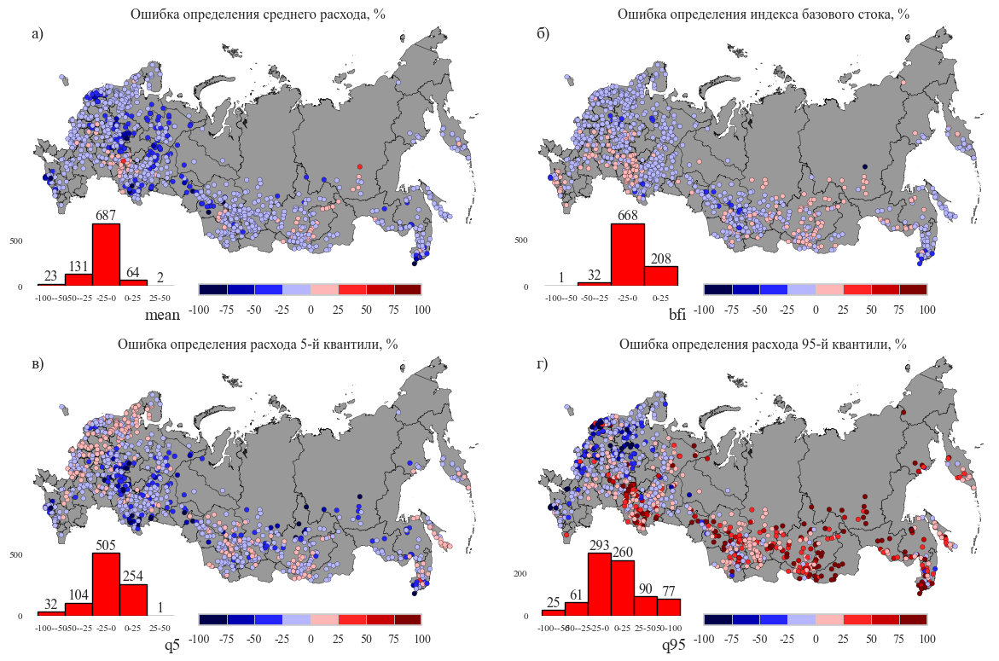

In [23]:
russia_plots_n(
    gdf_to_plot=tft_all_era5l,
    basemap_data=basemap_data,
    cmap_name="seismic",
    figsize=(15, 8),
    list_of_limits=[-100, -50, -25, 0, 25, 50, 100],
    cmap_lims=(-100, 100),
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    columns_from_gdf=["mean", "bfi", "q5", "q95"],
    with_histogram=True,
    title_text=[
        f"Ошибка определения среднего расхода, %",
        f"Ошибка определения индекса базового стока, %",
        f"Ошибка определения расхода 5-й квантили, %",
        f"Ошибка определения расхода 95-й квантили, %",
    ],
)
plt.savefig("./images/q5q95bfimean.png", dpi=1500, bbox_inches="tight")

In [5]:
from datetime import datetime


def get_season(value: datetime) -> int:
    """[summary]

    Args:
        value (datetime): [description]

    Returns:
        int: [description]
    """
    month = value.month
    if month in range(1, 3) or month == 12:
        season = 1
    elif month in range(3, 6):
        season = 2
    elif month in range(5, 9):
        season = 3
    else:
        season = 4
    return season


def precip_limit(value: float) -> int:
    if value == 0:
        return 1
    if 0 < value < 10:
        return 2
    if 10 < value < 25:
        return 3
    else:
        return 4

In [24]:
def nse(predictions, targets):
    return 1 - (
        np.nansum((targets - predictions) ** 2)
        / np.nansum((targets - np.nanmean(targets)) ** 2)
    )


seasons = ["Зима", "Весна", "Лето", "Осень"]
season_gauges = dict()

for g_id in tqdm(ws_file.index):
    season_gauges[g_id] = dict()
    test_df = pd.read_csv(f"./results/tft_256/{g_id}.csv", index_col="date")
    test_df["season"] = list(map(get_season, pd.to_datetime(test_df.index)))
    orig_nse = nse(test_df["q_mm_day_pred"], test_df["q_mm_day"])

    for i, (key, dff) in enumerate(test_df.groupby("season")):
        res_file = pd.DataFrame()

        pred = dff["q_mm_day_pred"].values
        obs = dff["q_mm_day"].values

        res_file.loc[i, "gauge_id"] = g_id
        res_file.loc[i, "NSE"] = f"{orig_nse:.2f}"
        res_file.loc[i, "NSE сезон"] = f"{nse(pred, obs):.2f}"
        res_file.loc[i, "Ошибка, %"] = f"{np.median((obs-pred)/obs):.2f}"
        res_file = res_file.set_index("gauge_id", drop=True)
        season_gauges[g_id][seasons[i]] = res_file

seasonal_errors = dict()
for i, season in enumerate(seasons):
    seasonal_errors[season] = list()

    for g_id in ws_file.index:
        seasonal_errors[season].append(season_gauges[g_id][season])
    seasonal_errors[season] = pd.concat(seasonal_errors[season], axis=0)

A Jupyter Widget

NameError: name 'get_season' is not defined

In [ ]:
tft_all_era5l[["NSE зима", "Ошибка зима, %"]] = seasonal_errors["Зима"][
    ["NSE сезон", "Ошибка, %"]
]
tft_all_era5l[["NSE весна", "Ошибка весна, %"]] = seasonal_errors["Весна"][
    ["NSE сезон", "Ошибка, %"]
]
tft_all_era5l[["NSE лето", "Ошибка лето, %"]] = seasonal_errors["Лето"][
    ["NSE сезон", "Ошибка, %"]
]
tft_all_era5l[["NSE осень", "Ошибка осень, %"]] = seasonal_errors["Осень"][
    ["NSE сезон", "Ошибка, %"]
]
tft_all_era5l[["NSE зима", "NSE весна", "NSE лето", "NSE осень"]] = tft_all_era5l[
    ["NSE зима", "NSE весна", "NSE лето", "NSE осень"]
].astype(float)
nse_winter = tft_all_era5l["NSE зима"].median()
nse_spring = tft_all_era5l["NSE весна"].median()
nse_summer = tft_all_era5l["NSE лето"].median()
nse_autumn = tft_all_era5l["NSE осень"].median()

delta_winter = f"{tft_all_era5l['Ошибка зима, %'].median():.1%}"
delta_spring = f"{tft_all_era5l['Ошибка весна, %'].median():.1%}"
delta_summer = f"{tft_all_era5l['Ошибка лето, %'].median():.1%}"
delta_autumn = f"{tft_all_era5l['Ошибка осень, %'].median():.1%}"

In [ ]:
tft_all_era5l[
    ["Ошибка зима, %", "Ошибка весна, %", "Ошибка лето, %", "Ошибка осень, %"]
] = tft_all_era5l[
    ["Ошибка зима, %", "Ошибка весна, %", "Ошибка лето, %", "Ошибка осень, %"]
].astype(float)
tft_all_era5l[
    ["Ошибка зима, %", "Ошибка весна, %", "Ошибка лето, %", "Ошибка осень, %"]
] *= 1e2

In [ ]:
# give ugms some shine
for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = tft_all_era5l.loc[
        [geom.intersects(gage_point) for gage_point in tft_all_era5l["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["NSE зима", "NSE весна", "NSE лето", "NSE осень"]] = (
        ugms_part[["NSE зима", "NSE весна", "NSE лето", "NSE осень"]].median()
    )
basin_districts.loc[[26, 27], ["NSE зима", "NSE весна", "NSE лето", "NSE осень"]] = (
    np.NaN
)

A Jupyter Widget

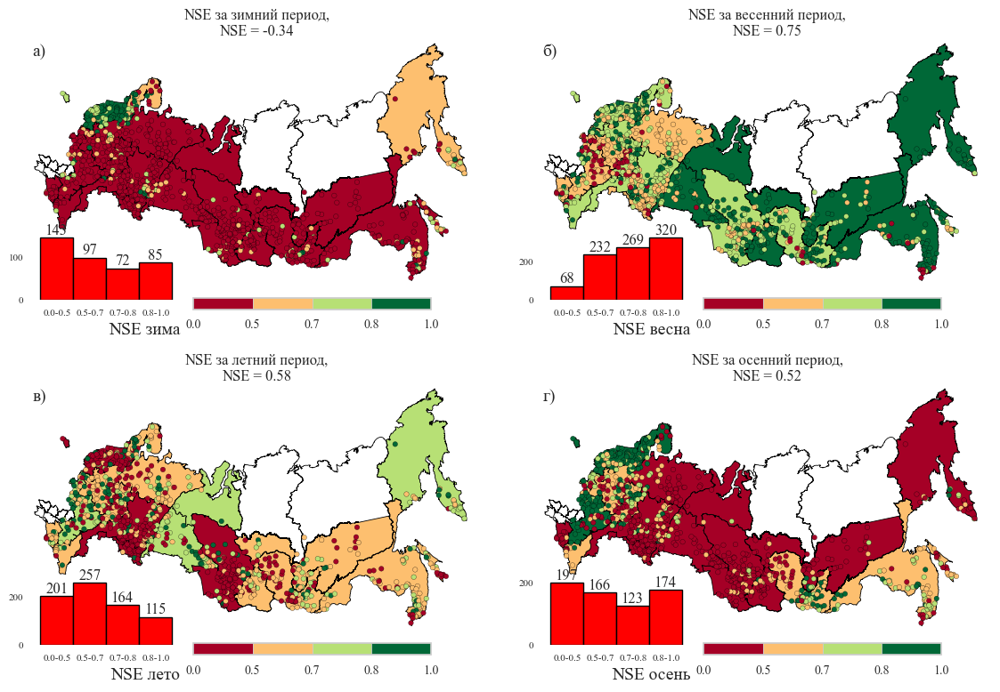

In [ ]:
differ_models = russia_plots_n(
    gdf_to_plot=tft_era5l,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=2,
    columns_from_gdf=["NSE зима", "NSE весна", "NSE лето", "NSE осень"],
    label_list=["а)", "б)", "в)", "г)"],
    with_histogram=True,
    title_text=[
        f"NSE за зимний период,\nNSE = {nse_winter:.2f}",
        f"NSE за весенний период,\nNSE = {nse_spring:.2f}",
        f"NSE за летний период,\nNSE = {nse_summer:.2f}",
        f"NSE за осенний период,\nNSE = {nse_autumn:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)
differ_models.savefig("./images/nse_seasons.png",
                      dpi=1500, bbox_inches="tight")

In [81]:
# give ugms some shine
for i, geom in enumerate(tqdm(basin_districts["geometry"])):
    ugms_part = tft_era5l.loc[
        [geom.intersects(gage_point) for gage_point in tft_era5l["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["Ошибка зима, %", "Ошибка весна, %",
            "Ошибка лето, %", "Ошибка осень, %"]
    ] = ugms_part[
        ["Ошибка зима, %", "Ошибка весна, %", "Ошибка лето, %", "Ошибка осень, %"]
    ].median()
basin_districts.loc[
    [26, 27], ["Ошибка зима, %", "Ошибка весна, %",
               "Ошибка лето, %", "Ошибка осень, %"]
] = np.NaN

A Jupyter Widget

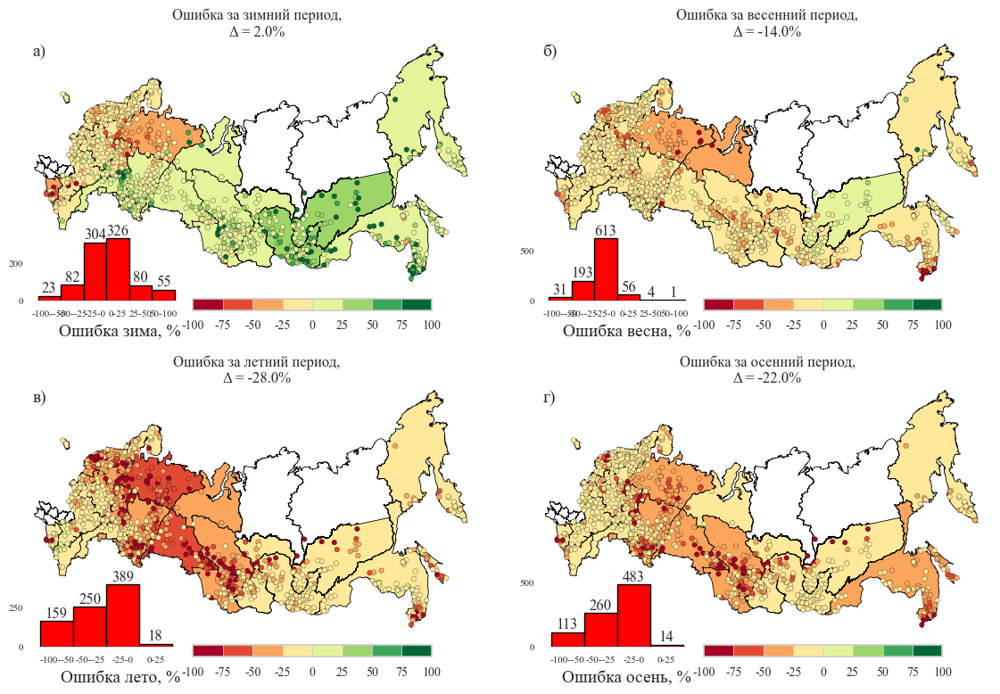

In [83]:
differ_models = russia_plots_n(
    gdf_to_plot=tft_era5l,
    basemap_data=basemap_data,
    figsize=(15, 8),
    nrows=2,
    ncols=2,
    columns_from_gdf=[
        "Ошибка зима, %",
        "Ошибка весна, %",
        "Ошибка лето, %",
        "Ошибка осень, %",
    ],
    label_list=["а)", "б)", "в)", "г)"],
    with_histogram=True,
    cmap_lims=(-100, 100),
    list_of_limits=[-100, -50, -25, 0, 25, 50, 100],
    title_text=[
        f"Ошибка за зимний период,\nΔ = {delta_winter}",
        f"Ошибка за весенний период,\nΔ = {delta_spring}",
        f"Ошибка за летний период,\nΔ = {delta_summer}",
        f"Ошибка за осенний период,\nΔ = {delta_autumn}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)
differ_models.savefig("./images/errors_seasons.png",
                      dpi=1500, bbox_inches="tight")

### Static parameters description

In [166]:
static_params = pd.read_csv("../geo_data/attributes/geo_vector.csv")
static_params = static_params.set_index("gauge_id")
static_parameters = [
    "for_pc_sse",
    "crp_pc_sse",
    "inu_pc_ult",
    "ire_pc_sse",
    "lka_pc_use",
    "prm_pc_sse",
    "pst_pc_sse",
    "cly_pc_sav",
    "slt_pc_sav",
    "snd_pc_sav",
    "kar_pc_sse",
    "urb_pc_sse",
    "gwt_cm_sav",
    "lkv_mc_usu",
    "rev_mc_usu",
    "sgr_dk_sav",
    "slp_dg_sav",
    "ws_area",
    "ele_mt_sav",
]
static_final = static_params[static_parameters]

test_static = deepcopy(static_final)
test_static.index = test_static.index.astype(str)


for g_id in test_static.index:
    if str(g_id) in tft_era5l.index:
        pass
    else:
        test_static = test_static.drop(g_id)

test_static_big = deepcopy(static_params)
for g_id in test_static_big.index:
    if str(g_id) in tft_era5l.index:
        pass
    else:
        test_static_big = test_static_big.drop(g_id)

In [124]:
def pca95(df: pd.DataFrame) -> np.ndarray:
    scale_df = MinMaxScaler().fit_transform(df)

    pca_trans = PCA(n_components=0.95, random_state=42)
    pca_trans.fit(scale_df)

    reduced_df = pca_trans.transform(scale_df)

    return reduced_df


clusters_range = range(3, 20)
silhoute_result = dict()
data = pca95(test_static)

for i in clusters_range:
    km = KMeans(n_clusters=i, random_state=42, n_init=15)
    cluster_labels = km.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    silhoute_result[i] = silhouette_avg

In [228]:
def get_high_silhoute(input_df: pd.DataFrame):
    import matplotlib.ticker as ticker

    clusters_range = range(2, 21)
    silhoute_result = dict()
    data = pca95(input_df)

    for i in clusters_range:
        km = KMeans(n_clusters=i, random_state=42, n_init=15)
        cluster_labels = km.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        silhoute_result[i] = silhouette_avg

    plt.rcParams["font.family"] = "Times New Roman"
    fig, ax = plt.subplots(figsize=(15, 8))

    x = list(silhoute_result.keys())
    y = list(silhoute_result.values())

    ax.plot(x, y, "-")
    line_x = x[np.argmax(y)]
    ax.axvline(x=line_x, color="r")

    ax.set_xlabel("Количество кластеров, шт.", fontsize=14)
    ax.set_ylabel("Величина силуэта", fontsize=14)
    ax.set_title(
        f"Максимальная величина силуэта найдена для {line_x} кластеров", fontsize=14
    )
    ax.xaxis.set_major_locator(
        ticker.FixedLocator(locs=[i for i in range(1, 21)]))
    ax.set_xticklabels([f"{i}" for i in range(1, 21)])

    plt.setp(ax.get_yticklabels(), fontsize=10)
    plt.setp(ax.get_xticklabels(), fontsize=10)
    ax.grid(False)
    plt.show()

    return fig

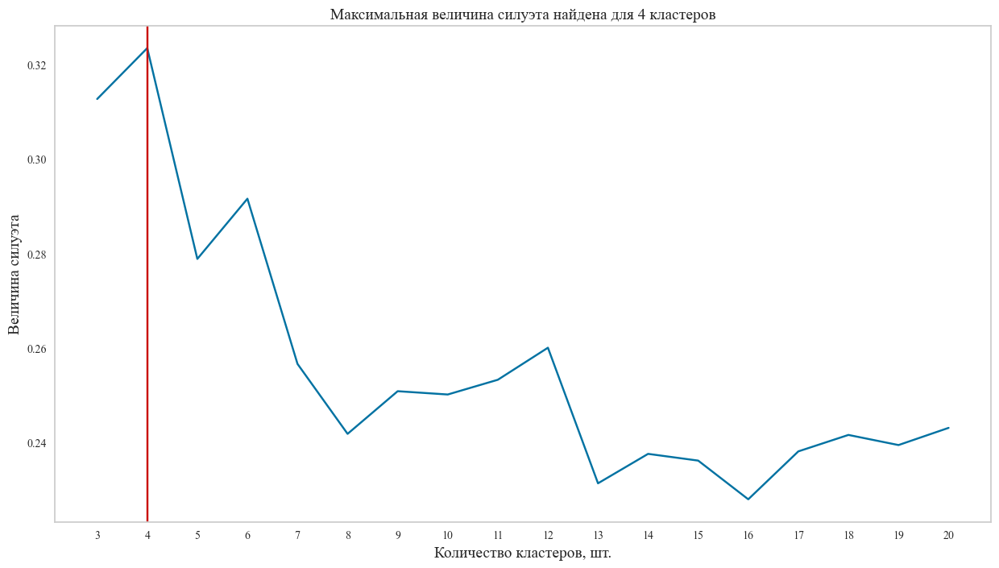

In [151]:
static_classic = get_high_silhoute(test_static)
static_classic.savefig(
    "./images/static_default_physgeo.png", dpi=1500, bbox_inches="tight"
)

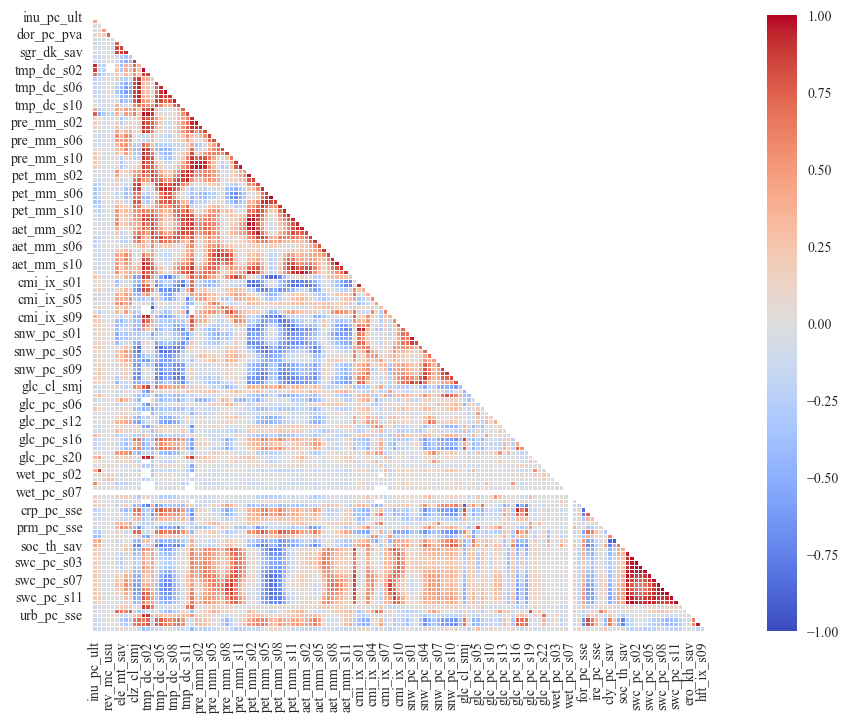

In [173]:
plt.rcParams["font.family"] = "Times New Roman"
# remove columns which had no representation in data
corr_frame = test_static_big.drop(
    ["glc_pc_s01", "glc_pc_s03", "glc_pc_s07", "glc_pc_s08", "wet_pc_s05"], axis=1
)
correlation_matrix = corr_frame.corr()
correlation_matrix = correlation_matrix.where(
    np.tril(np.ones(correlation_matrix.shape), k=-1).astype(bool)
)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 8))
sns.heatmap(
    correlation_matrix,
    cmap="coolwarm",
    ax=ax,
    robust=True,
    vmax=1.0,
    vmin=-1.0,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 1},
)
plt.savefig("./images/corr_mat_everything.png", dpi=1500, bbox_inches="tight")

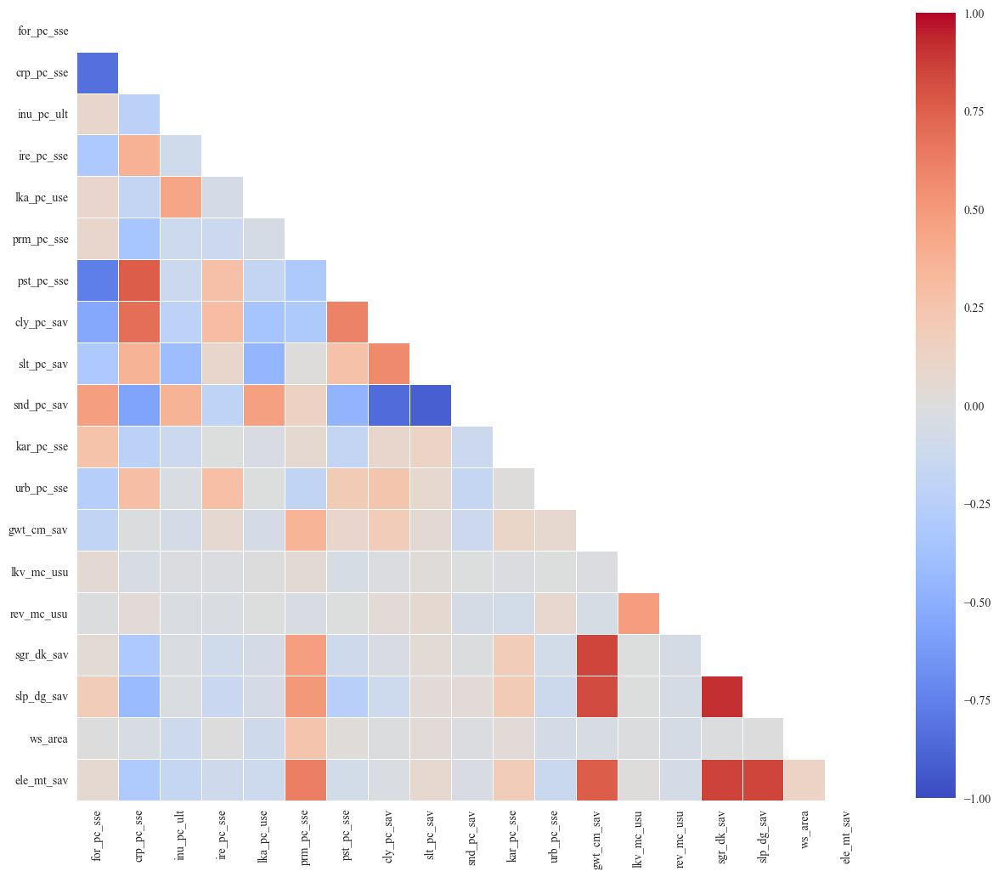

In [175]:
# remove columns which had no representation in data
correlation_matrix = test_static.corr()
correlation_matrix = correlation_matrix.where(
    np.tril(np.ones(correlation_matrix.shape), k=-1).astype(bool)
)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(
    correlation_matrix,
    cmap="coolwarm",
    ax=ax,
    robust=True,
    vmax=1.0,
    vmin=-1.0,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
)
plt.savefig("./images/corr_mat_final.png", dpi=1500, bbox_inches="tight")

### Clusters based on static values order in tft

In [167]:
tft_static = pd.read_csv("../forecast/result/tft_by_gauge_static.csv")
tft_static["gauge_id"] = tft_static["gauge_id"].astype(str)
tft_static = tft_static.set_index("gauge_id", drop=True)
tft_static = tft_static[tft_static.index.isin(tft_era5l.index)]
tft_static

,for_pc_sse,crp_pc_sse,inu_pc_ult,ire_pc_sse,lka_pc_use,prm_pc_sse,pst_pc_sse,cly_pc_sav,slt_pc_sav,snd_pc_sav,kar_pc_sse,urb_pc_sse,gwt_cm_sav,lkv_mc_usu,rev_mc_usu,sgr_dk_sav,slp_dg_sav,ws_area,ele_mt_sav
gauge_id,,,,,,,,,,,,,,,,,,,
10620,1.536321,0.981264,3.262345,1.495815,1.936688,64.866602,4.337567,1.426344,1.412909,1.766071,0.929946,0.996013,0.995530,2.640635,0.409990,1.654734,5.760129,1.469562,2.121532
8306,0.643010,38.209555,0.719831,0.663329,4.847274,0.907043,4.812509,2.506283,4.628784,5.727230,7.971287,2.011538,2.039643,3.090566,5.116057,1.234178,8.078911,3.217815,3.575151
78614,9.921046,0.825598,0.722537,2.222036,1.775828,1.024988,2.632831,5.088431,5.096455,1.239382,8.493590,3.075307,6.188953,31.288260,0.766142,2.860319,4.300021,1.379343,11.098927
5287,0.630077,5.508376,7.658359,5.155208,1.196655,6.317987,0.764545,1.057418,2.186410,2.317660,2.322745,7.260954,2.467805,28.916684,1.491777,1.009765,10.177813,8.894353,4.665410
2198,1.233185,0.838933,0.545819,10.376235,4.460650,4.997325,4.693094,3.321991,0.567689,5.501205,2.009829,27.442285,3.852467,1.255871,6.761649,2.176082,3.970586,6.940580,9.054524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72603,0.758493,23.082277,0.678859,10.186093,6.240482,2.315752,1.511101,2.742289,7.227344,4.865864,1.947372,6.246084,6.211688,6.083347,3.662983,0.574737,1.652482,12.503505,1.509241
72660,3.251546,3.307675,1.941737,1.521662,0.859296,17.066474,1.436722,0.555228,9.722568,6.352772,2.720113,1.042658,10.096829,2.306483,1.945897,2.857724,17.473365,1.534415,14.006835
75576,5.215265,3.987650,5.151546,16.590343,2.576960,1.200100,1.072677,2.985325,3.698246,5.309991,1.327338,2.680716,9.797145,1.078059,0.968239,1.125265,0.615911,29.414016,5.205207


In [169]:
test_static = test_static[test_static.index.isin(tft_static.index)]

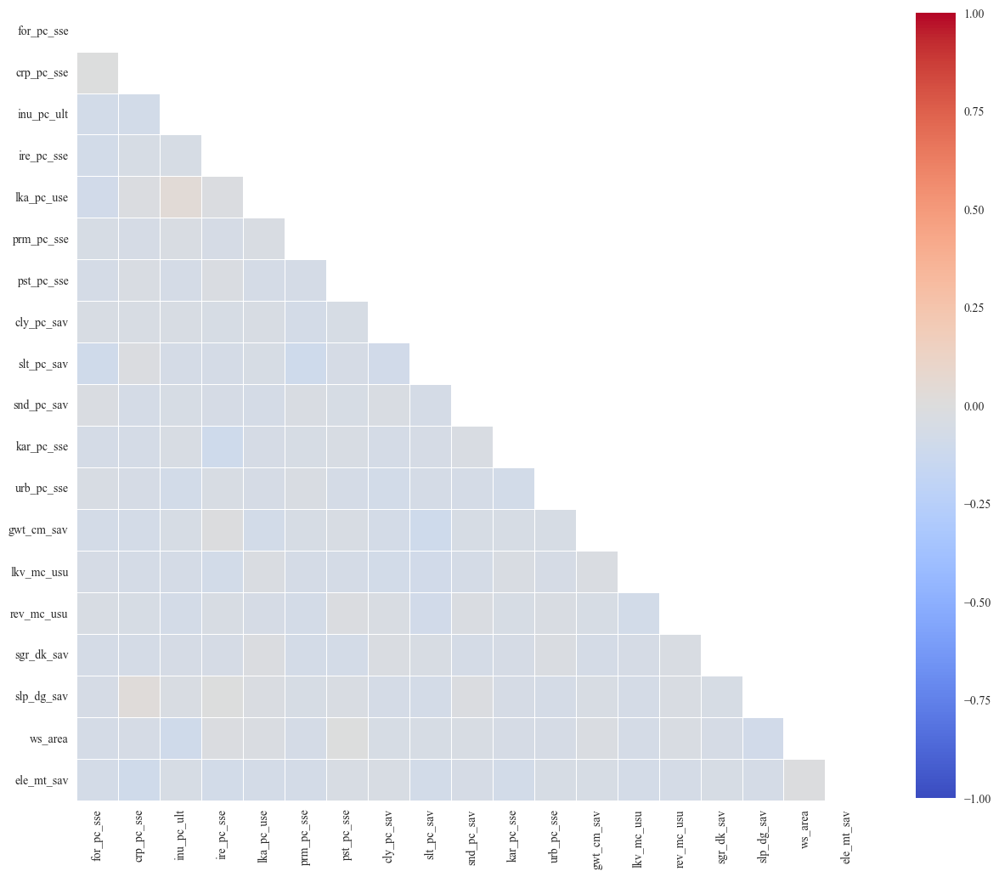

In [176]:
# remove columns which had no representation in data
correlation_matrix = tft_static.corr()
correlation_matrix = correlation_matrix.where(
    np.tril(np.ones(correlation_matrix.shape), k=-1).astype(bool)
)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(
    correlation_matrix,
    cmap="coolwarm",
    ax=ax,
    robust=True,
    vmax=1.0,
    vmin=-1.0,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
)
plt.savefig("./images/corr_mat_tft.png", dpi=1500, bbox_inches="tight")

In [331]:
tft_cluster = deepcopy(
    tft_all_era5l.loc[tft_all_era5l.index.isin(tft_static.index)])

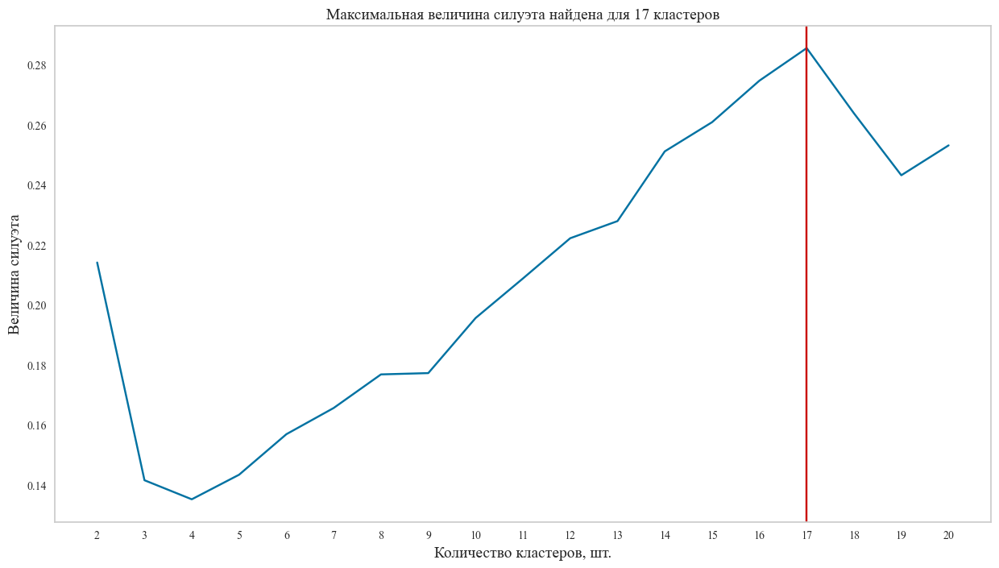

In [234]:
static_classic = get_high_silhoute(pca95(tft_static))
static_classic.savefig("./images/static_tft_physgeo.png",
                       dpi=1500, bbox_inches="tight")

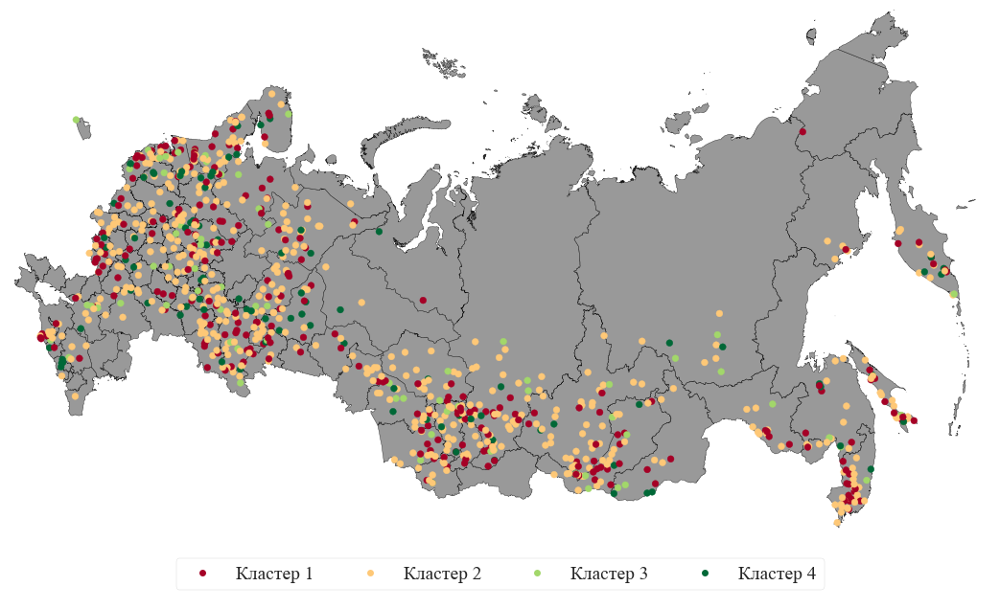

In [334]:
km = KMeans(n_clusters=4, random_state=42, n_init=15)

yhat_AC = km.fit_predict(tft_static.to_numpy())

tft_cluster["Кластер_tft"] = [f"Кластер {i+1}" for i in yhat_AC]
tft_cluster["Кластер_tft"] = tft_cluster["Кластер_tft"].sort_values()
tft_static["ResClust"] = [i + 1 for i in yhat_AC]
tft_cluster["importance"] = tft_static.iloc[:, :-1].idxmax(axis=1)

gauges_fig = russia_plots(
    gdf_to_plot=tft_cluster,
    basemap_data=basemap_data,
    distinction_col="Кластер_tft",
    # cmap_name='tab20',
    #   metric_col='Кластер',
    list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
    with_histogram=False,
)

gauges_fig.savefig("./images/clusters_Rus_tft.png",
                   dpi=1500, bbox_inches="tight")

In [335]:
cmap_name: str = "RdYlGn"
cmap = cm.get_cmap(cmap_name, 4)
color_list = [mcolors.rgb2hex(cmap(i)) for i in range(cmap.N)]

polar = tft_static.groupby("ResClust").mean().reset_index()

polar = pd.melt(polar, id_vars=["ResClust"])


fig_polar = px.line_polar(
    polar,
    r="value",
    theta="variable",
    color="ResClust",
    color_discrete_sequence=color_list,
    template="seaborn",
    height=800,
    width=800,
)
fig_polar.update_layout(
    polar=dict(
        radialaxis=dict(showticklabels=False, ticks=""),
        angularaxis=dict(showticklabels=True, tickangle=0),
    ),
    legend_title_text="Кластеры",
    legend=dict(
        orientation="h",
        yanchor="middle",
        y=-0.1,
        xanchor="center",
        x=0.5,
        bgcolor=None,
        bordercolor="Black",
        borderwidth=0,
    ),
)
fig_polar.write_image("./images/cluster_importance_tft.png")
fig_polar

### Attention vs Static clustering

In [253]:
tft_attention = pd.read_csv("../forecast/result/tft_by_gauge_attention.csv")
tft_attention["gauge_id"] = tft_attention["gauge_id"].astype(str)
tft_attention = tft_attention.set_index("gauge_id", drop=True)
tft_attention = tft_attention[tft_attention.index.isin(tft_era5l.index)]
tft_attention["median_attnt"] = tft_attention.iloc[:, :11].median(axis=1)

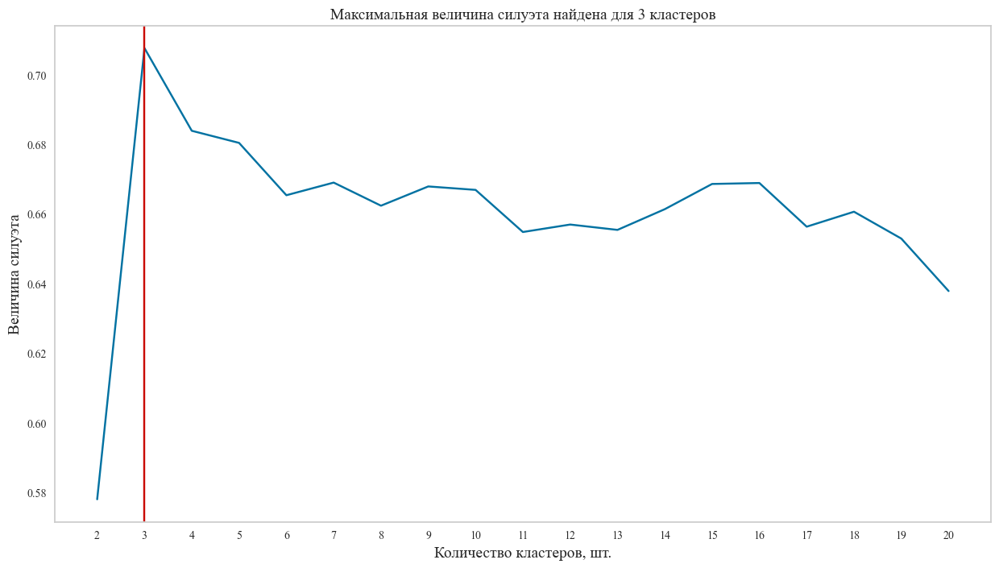

In [252]:
static_classic = get_high_silhoute(
    tft_attention["median_attnt"].values.reshape(-1, 1))
static_classic.savefig("./images/attention_tft.png",
                       dpi=1500, bbox_inches="tight")

In [340]:
tft_attention.iloc[:, :-2]

,0,1,2,3,4,5,6,7,8,9,...,356,357,358,359,360,361,362,363,364,median_attnt
gauge_id,,,,,,,,,,,,,,,,,,,,,
10620,198,197,196,195,199,194,200,201,193,202,...,360,5,361,362,4,363,3,364,365,198.0
8306,207,208,209,206,205,204,210,211,203,202,...,33,36,24,23,35,31,32,21,19,207.0
78614,1,365,364,363,16,17,362,15,12,11,...,177,180,183,187,174,182,181,175,176,16.0
5287,365,364,363,362,361,360,359,358,357,356,...,207,215,214,208,213,212,211,209,210,360.0
2198,364,365,361,362,363,360,359,358,357,329,...,195,194,192,191,190,187,184,186,185,360.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72603,1,132,301,295,131,210,306,205,256,127,...,356,358,359,360,361,362,363,364,365,210.0
72660,1,211,210,205,209,212,213,208,204,214,...,18,19,26,20,25,21,24,22,23,210.0
75576,143,145,188,146,144,140,149,150,142,189,...,7,357,363,361,360,359,364,358,365,146.0


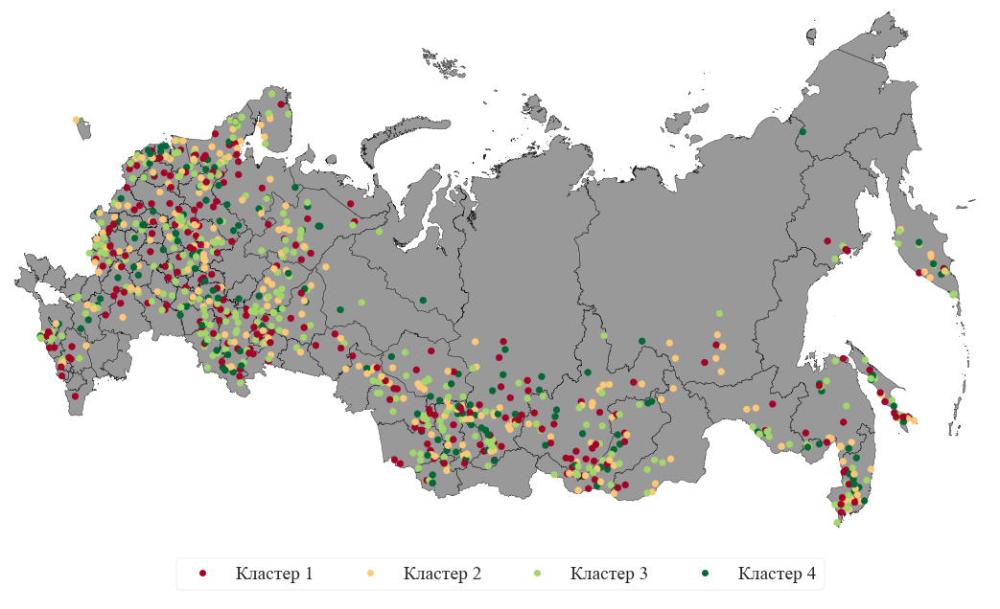

In [341]:
km = KMeans(n_clusters=4, random_state=42, n_init=15)

yhat_AC = km.fit_predict(
    tft_attention["median_attnt"].to_numpy().reshape(-1, 1))

tft_cluster["Кластер_tft"] = [f"Кластер {i+1}" for i in yhat_AC]
tft_cluster["Кластер_tft"] = tft_cluster["Кластер_tft"].sort_values()
tft_attention["ResClust"] = [i + 1 for i in yhat_AC]
tft_cluster["attention"] = tft_attention.iloc[:, :-2].idxmax(axis=1)

gauges_fig = russia_plots(
    gdf_to_plot=tft_cluster,
    basemap_data=basemap_data,
    distinction_col="Кластер_tft",
    #   cmap_name='tab20',
    #   metric_col='Кластер',
    list_of_limits=list(range(1, 18)),
    figsize=(15, 8),
    just_points=True,
    with_histogram=False,
)

gauges_fig.savefig("./images/clusters_attention.png",
                   dpi=1500, bbox_inches="tight")

In [342]:
cmap_name: str = "tab20"
cmap = cm.get_cmap(cmap_name, 17)
color_list = [mcolors.rgb2hex(cmap(i)) for i in range(cmap.N)]

polar = (
    tft_attention[["median_attnt", "ResClust"]].groupby(
        "ResClust").mean().reset_index()
)

polar = pd.melt(polar, id_vars=["ResClust"])
polar.to_csv("./tables/attention_clusters.csv", index=False)
polar

,ResClust,variable,value
0,1,median_attnt,16.074380
1,2,median_attnt,337.085586
2,3,median_attnt,194.718310
3,4,median_attnt,117.068750


In [286]:
{val: len(g) for val, g in tft_cluster.groupby("importance").groups.items()}

{'ResClust': 8,
 'cly_pc_sav': 42,
 'crp_pc_sse': 49,
 'ele_mt_sav': 63,
 'for_pc_sse': 65,
 'gwt_cm_sav': 36,
 'inu_pc_ult': 45,
 'ire_pc_sse': 45,
 'kar_pc_sse': 58,
 'lka_pc_use': 26,
 'lkv_mc_usu': 71,
 'prm_pc_sse': 56,
 'pst_pc_sse': 33,
 'rev_mc_usu': 37,
 'sgr_dk_sav': 42,
 'slp_dg_sav': 40,
 'slt_pc_sav': 71,
 'snd_pc_sav': 38,
 'urb_pc_sse': 46,
 'ws_area': 37}

In [292]:
{val: len(g) for val, g in tft_cluster.groupby("importance").groups.items()}

{'ResClust': 3,
 'cly_pc_sav': 42,
 'crp_pc_sse': 49,
 'ele_mt_sav': 64,
 'for_pc_sse': 65,
 'gwt_cm_sav': 37,
 'inu_pc_ult': 45,
 'ire_pc_sse': 45,
 'kar_pc_sse': 58,
 'lka_pc_use': 26,
 'lkv_mc_usu': 74,
 'prm_pc_sse': 56,
 'pst_pc_sse': 33,
 'rev_mc_usu': 39,
 'sgr_dk_sav': 39,
 'slp_dg_sav': 40,
 'slt_pc_sav': 72,
 'snd_pc_sav': 38,
 'urb_pc_sse': 46,
 'ws_area': 37}

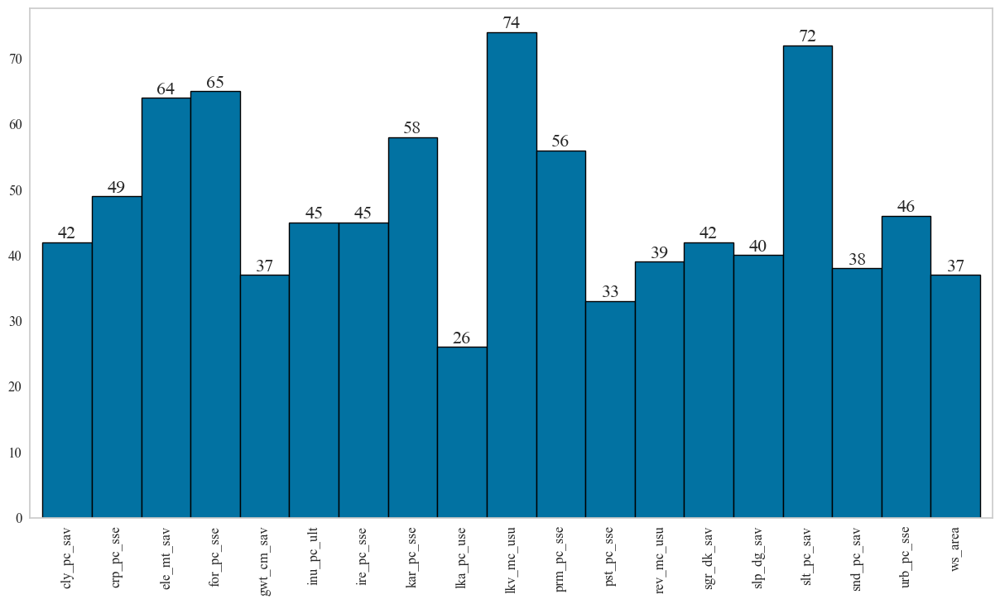

In [79]:
clust_hist = pd.DataFrame(
    {val: len(g)
     for val, g in tft_cluster.groupby("importance").groups.items()},
    index=[0],
).T.plot.bar(
    figsize=(15, 8), rot=90, width=1, edgecolor="black", grid=False, legend=False, lw=1
)
clust_hist.bar_label(clust_hist.containers[0], fmt="%.0f", fontsize=16)
plt.setp(clust_hist.get_xticklabels(), fontsize=12)
plt.setp(clust_hist.get_yticklabels(), fontsize=12)
plt.savefig("./images/clust_dominance.png", dpi=1000, bbox_inches="tight")

In [ ]:
# tft single era5l
import ast
tft_static, nse_tft = metric_viewer(
    metric_csv="../forecast/result/tft_by_gauge_static_final.csv",
    metric_col="NSE",
    gauges_file=gauges_file,
)
tft_test_cluster = deepcopy(tft_static[["static"]])

static_dict = {
    param: code + 1
    for code, param in zip(pd.Categorical(static_parameters).codes, static_parameters)
}


def static_as_int(static_dict: dict, row):
    return list(map(lambda x: static_dict[x], ast.literal_eval(row)))


for g in tft_test_cluster.index:
    tft_test_cluster.loc[g, ["x1", "x2", "x3", "x4"]] = static_as_int(
        static_dict=static_dict, row=tft_test_cluster.loc[g, "static"]
    )
tft_test_cluster = tft_test_cluster[["x1", "x2", "x3", "x4"]]

In [314]:
static_params = pd.read_csv("../geo_data/attributes/geo_vector.csv")
static_params = static_params.set_index("gauge_id")
static_parameters = [
    "for_pc_sse",
    "crp_pc_sse",
    "inu_pc_ult",
    "ire_pc_sse",
    "lka_pc_use",
    "prm_pc_sse",
    "pst_pc_sse",
    "cly_pc_sav",
    "slt_pc_sav",
    "snd_pc_sav",
    "kar_pc_sse",
    "urb_pc_sse",
    "gwt_cm_sav",
    "lkv_mc_usu",
    "rev_mc_usu",
    "sgr_dk_sav",
    "slp_dg_sav",
    "ws_area",
    "ele_mt_sav",
]
static_final = static_params[static_parameters]

test_static = deepcopy(static_final)
test_static.index = test_static.index.astype(str)

In [304]:
test_static.loc[test_static.index.isin(tft_all_era5l.index), :]

,for_pc_sse,crp_pc_sse,inu_pc_ult,ire_pc_sse,lka_pc_use,prm_pc_sse,pst_pc_sse,cly_pc_sav,slt_pc_sav,snd_pc_sav,kar_pc_sse,urb_pc_sse,gwt_cm_sav,lkv_mc_usu,rev_mc_usu,sgr_dk_sav,slp_dg_sav,ws_area,ele_mt_sav
gauge_id,,,,,,,,,,,,,,,,,,,
9164,78.120000,0.000000,0.000000,0.0,0.092000,51.880000,0.000000,10.960000,39.160000,50.080000,53.600000,0.000000,370.280000,1.720000,0.000000,314.560000,14.984000,1254.320139,1406.880000
9166,85.333333,0.000000,0.209877,0.0,0.067901,38.382716,0.000000,11.888889,41.802469,46.345679,71.604938,0.000000,344.444444,445.308642,0.000000,263.580247,14.067901,5743.573901,1263.938272
9169,86.428571,0.000000,0.000000,0.0,0.057143,48.285714,0.000000,10.571429,39.857143,49.714286,70.142857,0.000000,394.142857,3.714286,0.000000,310.000000,15.771429,211.358746,1399.000000
9189,73.307692,19.076923,0.153846,0.0,0.046154,6.384615,11.384615,14.692308,42.538462,42.769231,0.000000,0.076923,223.615385,3350.923077,2407.692308,132.153846,9.476923,529.141565,647.384615
9191,85.000000,8.473684,0.000000,0.0,0.047368,16.500000,5.447368,14.657895,42.394737,42.973684,0.894737,0.368421,279.842105,2.605263,0.000000,179.342105,11.313158,2510.623856,814.657895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10204,77.756757,6.000000,0.000000,0.0,0.018919,0.000000,7.054054,14.378378,48.216216,37.270270,89.135135,0.351351,88.513514,0.702703,0.000000,53.702703,3.221622,2525.991764,322.783784
10246,80.923241,7.592751,0.029851,0.0,0.101919,5.174840,4.535181,14.844350,44.995736,40.134328,24.066098,1.897655,163.893390,12.162047,0.000000,115.643923,8.213859,47275.698864,536.609808
10387,73.873016,14.031746,0.071429,0.0,0.192857,3.857143,10.904762,14.396825,45.103175,40.587302,20.380952,0.333333,107.071429,29.793651,0.000000,81.333333,5.233333,10537.785868,424.833333


In [322]:
static_params = pd.read_csv("../geo_data/attributes/geo_vector.csv")
static_params = static_params.set_index("gauge_id")
static_parameters = [
    "for_pc_sse",
    "crp_pc_sse",
    "inu_pc_ult",
    "ire_pc_sse",
    "lka_pc_use",
    "prm_pc_sse",
    "pst_pc_sse",
    "cly_pc_sav",
    "slt_pc_sav",
    "snd_pc_sav",
    "kar_pc_sse",
    "urb_pc_sse",
    "gwt_cm_sav",
    "lkv_mc_usu",
    "rev_mc_usu",
    "sgr_dk_sav",
    "slp_dg_sav",
    "ws_area",
    "ele_mt_sav",
]
static_final = static_params[static_parameters]

test_static = deepcopy(static_final)
test_static.index = test_static.index.astype(str)

test_static = test_static.loc[test_static.index.isin(tft_all_era5l.index), :]

test_static.loc[:, :] = MinMaxScaler().fit_transform(test_static.values)
km = KMeans(n_clusters=4, random_state=42, n_init=15)

yhat_AC = km.fit_predict(test_static)
tft_all_era5l = tft_all_era5l.loc[tft_all_era5l.index.isin(
    test_static.index), :]
tft_all_era5l["Кластер"] = [str(f"Кластер {i+1}") for i in yhat_AC]
test_static["ResClust"] = [i + 1 for i in yhat_AC]
# test_static['color'] = test_static['ResClust'].apply(
# lambda x: dict(zip([1, 2, 3, 4], color_list))[x])

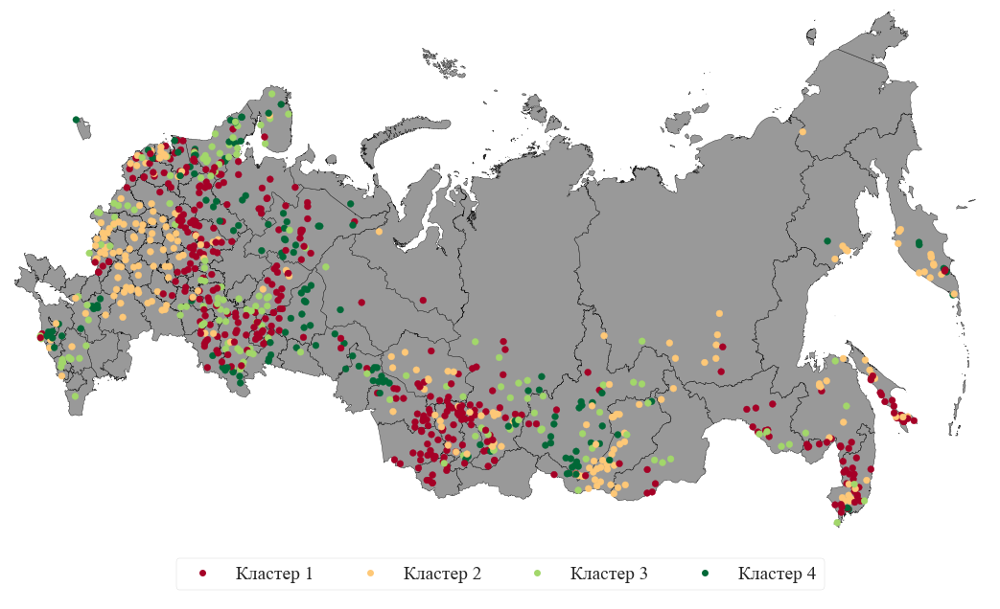

In [329]:
gauges_fig = russia_plots(
    gdf_to_plot=tft_all_era5l,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    #   metric_col='Кластер',
    list_of_limits=[0, 1, 2, 3, 4],
    figsize=(15, 8),
    just_points=True,
    with_histogram=False,
)

In [ ]:
cmap_name: str = "RdYlGn"
cmap = cm.get_cmap(cmap_name, 4)
color_list = [mcolors.rgb2hex(cmap(i)) for i in range(cmap.N)]

polar = test_static.groupby("ResClust").mean().reset_index()

polar = pd.melt(polar, id_vars=["ResClust"])


fig_polar = px.line_polar(
    polar,
    r="value",
    theta="variable",
    color="ResClust",
    color_discrete_sequence=color_list,
    template="seaborn",
    height=800,
    width=800,
)
fig_polar.update_layout(
    polar=dict(
        # radialaxis_angle = -45
        radialaxis=dict(showticklabels=False, ticks=""),
        angularaxis=dict(showticklabels=True, tickangle=0),
    ),
    legend_title_text="Кластеры",
    legend=dict(
        orientation="h",
        yanchor="middle",
        y=-0.1,
        xanchor="center",
        x=0.5,
        bgcolor=None,
        bordercolor="Black",
        borderwidth=0,
    ),
)
fig_polar.write_image("./images/cluster_importance.png")

In [313]:
fig_polar

### temp

In [ ]:
from forecast.scripts.model_eval import nse

lost_df = pd.DataFrame()
for i, file in enumerate(glob.glob("../forecast/result/lost_gauge/*.csv")):
    gauge_id = file.split("/")[-1][:-4]
    compare_res = pd.read_csv(f"../forecast/result/lost_gauge/{gauge_id}.csv")
    # get nse
    pred_nse = nse(pred=compare_res["q_mm_day_pred"],
                   target=compare_res["q_mm_day"])
    lost_df.loc[i, "gauge_id"] = gauge_id
    lost_df.loc[i, "NSE"] = pred_nse
lost_df